<a href="https://colab.research.google.com/github/alanagadelha/DeepLearning_AntarticaWork/blob/main/SSCAD2025_Previs%C3%A3o_de_Temperatura_e_Vento_na_Ant%C3%A1rtida_METAR_e_ICON_Ygor_(C%C3%B3pia_do_METAR_Temperatura).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup das configurações

In [ ]:
!pip install nvidia-ml-py3 psutil matplotlib
!pip install ydata-profiling -q

  Preparing metadata (setup.py) ... done
  Created wheel for nvidia-ml-py3: filename=nvidia_ml_py3-7.352.0-py3-none-any.whl size=19172 sha256=c04891c0c36630faabd301e429c3859e05841a5c155172fb89f83ffa774fb7de
  Stored in directory: /root/.cache/pip/wheels/47/50/9e/29dc79037d74c3c1bb4a8661fb608e8674b7e4260d6a3f8f51
Successfully built nvidia-ml-py3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.0/679.0 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.3 MB/s eta 0:00:00


In [ ]:
!cat /proc/meminfo | grep MemTotal
!cat /proc/cpuinfo | grep processor | wc -l
!cat /etc/os-release
!df -h

MemTotal:       13289424 kB
2
PRETTY_NAME="Ubuntu 22.04.4 LTS"
NAME="Ubuntu"
VERSION_ID="22.04"
VERSION="22.04.4 LTS (Jammy Jellyfish)"
VERSION_CODENAME=jammy
ID=ubuntu
ID_LIKE=debian
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
UBUNTU_CODENAME=jammy
Filesystem      Size  Used Avail Use% Mounted on
overlay         226G   39G  188G  17% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.2G  775M  61% /usr/sbin/docker-init
tmpfs           6.4G  688K  6.4G   1% /var/colab
/dev/sda1       233G   40G  193G  17% /kaggle/input
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
usuario='Ygor'

arquivo_metar = 'metar_frei_20100101_20250630-novoteste.csv'
endpoint = 'https://ygor.ml/uff/sscad2025'

modo_execucao = 'Treinamento' # e.g: 'Treinamento' ou 'Visualização'
modo_hardware = 'GPU'

lista_modelos = {
    'Linear': 'Linear_01-08-2025_031423Z.keras',
    'mlp': 'mlp_01-08-2025_031717Z.keras',
    'mlp2': 'mlp2_01-08-2025_032015Z.keras',
    'multiple-input-step': 'multiple-input-step_01-08-2025_032355Z.keras',
    'multiple-input-step-2': 'multiple-input-step-2_01-08-2025_032819Z.keras',
    'cnn': 'cnn_01-08-2025_033020Z.keras',
    'LSTM': 'LSTM_01-08-2025_034323Z.keras',
    'BiLSTM': 'BiLSTM_01-08-2025_035824Z.keras'
}

tempos_treinamento = {} # Treinamento
tempos_validacao = {}  # Validacao
tempos_teste = {} # Teste / Inferência

val_performance = {}
performance = {}

In [ ]:
!wget -O {arquivo_metar} {endpoint}/{arquivo_metar}

--2025-08-05 14:29:09--  https://ygor.ml/uff/sscad2025/metar_frei_20100101_20250630-novoteste.csv
Resolving ygor.ml (ygor.ml)... 177.73.233.43
Connecting to ygor.ml (ygor.ml)|177.73.233.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6316847 (6.0M) [text/csv]
Saving to: ‘metar_frei_20100101_20250630-novoteste.csv’

metar_frei_20100101 100%[===================>]   6.02M  5.21MB/s    in 1.2s    

2025-08-05 14:29:11 (5.21 MB/s) - ‘metar_frei_20100101_20250630-novoteste.csv’ saved [6316847/6316847]



In [ ]:
if modo_execucao == 'Visualização':
  for key, value in lista_modelos.items():
    !wget {endpoint}/{value}

In [ ]:
import time
import psutil
import matplotlib.pyplot as plt
from pynvml import nvmlInit, nvmlDeviceGetHandleByIndex, nvmlDeviceGetMemoryInfo, nvmlDeviceGetUtilizationRates
from tensorflow.keras.callbacks import Callback
import numpy as np
import datetime

# Lista global para armazenar todos os monitors criados
monitors = []

class ResourceMonitorCallback(Callback):
    def __init__(self, model_name='model', gpu_index=0, time_based=True):
        """Inicializa o monitor para um modelo específico.

        Args:
            model_name (str): Nome do modelo para identificação
            gpu_index (int): Índice da GPU a monitorar
            time_based (bool): Se True, gráficos serão por tempo; False para épocas
        """
        super().__init__()
        self.model_name = model_name
        self.time_based = time_based
        self.gpu_available = False

        try:
            nvmlInit()
            self.gpu_handle = nvmlDeviceGetHandleByIndex(gpu_index)
            self.gpu_available = True
        except Exception as e:
            print(f"AVISO: Monitoramento de GPU desativado. Erro: {e}")

        self.metrics = {
            'timestamps': [],
            'epochs': [],
            'gpu_mem_usage': [],
            'gpu_util': [],
            'cpu_usage': [],
            'ram_usage': []
        }
        monitors.append(self)  # Auto-registro na lista global

    def on_train_begin(self, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        # Coleta métricas da GPU
        if self.gpu_available:
            try:
                mem_info = nvmlDeviceGetMemoryInfo(self.gpu_handle)
                util = nvmlDeviceGetUtilizationRates(self.gpu_handle)
                self.metrics['gpu_mem_usage'].append(mem_info.used / (1024**2))  # MB
                self.metrics['gpu_util'].append(util.gpu)  # %
            except Exception as e:
                print(f"Erro ao coletar métricas da GPU: {e}")
                self.metrics['gpu_mem_usage'].append(0)
                self.metrics['gpu_util'].append(0)

        # Coleta métricas da CPU/RAM
        self.metrics['cpu_usage'].append(psutil.cpu_percent(interval=0.1))  # %
        self.metrics['ram_usage'].append(psutil.virtual_memory().used / (1024**3))  # GB
        self.metrics['timestamps'].append(time.time() - self.start_time)  # s
        self.metrics['epochs'].append(epoch + 1)  # epoch começa em 0

    def plot_metrics(self, show=True, save_path=None):
        """Gera gráficos para este modelo específico."""
        if not self.metrics['epochs']:
            print("Nenhuma métrica disponível para plotar.")
            return

        plt.figure(figsize=(15, 10), num=f"Resource Usage - {self.model_name}")

        x_values = self.metrics['timestamps'] if self.time_based else self.metrics['epochs']
        x_label = 'Tempo (s)' if self.time_based else 'Época'

        # GPU Metrics
        if self.gpu_available and any(self.metrics['gpu_mem_usage']):
            plt.subplot(2, 2, 1)
            plt.plot(x_values, self.metrics['gpu_mem_usage'], 'b-')
            plt.title(f'{self.model_name} - Uso de Memória GPU')
            plt.ylabel('MB')
            plt.xlabel(x_label)
            plt.grid(True)

            plt.subplot(2, 2, 2)
            plt.plot(x_values, self.metrics['gpu_util'], 'r-')
            plt.title(f'{self.model_name} - Utilização GPU')
            plt.ylabel('%')
            plt.xlabel(x_label)
            plt.grid(True)

        # CPU/RAM Metrics
        plt.subplot(2, 2, 3)
        plt.plot(x_values, self.metrics['cpu_usage'], 'g-')
        plt.title(f'{self.model_name} - Utilização CPU')
        plt.ylabel('%')
        plt.xlabel(x_label)
        plt.grid(True)

        plt.subplot(2, 2, 4)
        plt.plot(x_values, self.metrics['ram_usage'], 'm-')
        plt.title(f'{self.model_name} - Uso de Memória RAM')
        plt.ylabel('GB')
        plt.xlabel(x_label)
        plt.grid(True)

        plt.suptitle(f'Monitoramento de Recursos - {self.model_name}', y=1.02)
        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Gráfico salvo em: {save_path}")
        if show:
            plt.show()

def plot_combined_metrics(metrics=None, time_based=True, figsize=(15, 10)):
    """Plota métricas comparativas para todos os modelos monitorados.

    Args:
        metrics (list): Lista de métricas para plotar (padrão: todas principais)
        time_based (bool): Se True, eixo X como tempo; False para épocas
        figsize (tuple): Tamanho da figura
    """
    if not monitors:
        print("Nenhum modelo monitorado encontrado.")
        return

    if not metrics:
        metrics = ['cpu_usage', 'ram_usage']
        if monitors[0].gpu_available:
            metrics.extend(['gpu_util', 'gpu_mem_usage'])

    plt.figure(figsize=figsize, num="Comparação entre Modelos")

    for i, metric in enumerate(metrics, 1):
        plt.subplot(len(metrics)//2 + len(metrics)%2, 2, i)

        for monitor in monitors:
            if not monitor.metrics[metric]:
                continue

            x_values = monitor.metrics['timestamps'] if time_based else monitor.metrics['epochs']
            y_values = monitor.metrics[metric]

            plt.plot(x_values, y_values, label=monitor.model_name)

        plt.title(metric.replace('_', ' ').title())
        plt.xlabel('Tempo (s)' if time_based else 'Época')
        plt.ylabel({
            'gpu_util': 'Utilização GPU (%)',
            'gpu_mem_usage': 'Memória GPU (MB)',
            'cpu_usage': 'Utilização CPU (%)',
            'ram_usage': 'Memória RAM (GB)'
        }.get(metric, metric))
        plt.legend()
        plt.grid(True)

    plt.suptitle('Comparação de Utilização de Recursos entre Modelos', y=1.02)
    plt.tight_layout()
    plt.show()

In [ ]:
import os

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

In [ ]:
mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [ ]:
from google.colab import drive

if usuario=='Alana':
  #drive.mount('/content/drive')
  #my_path = '/content/drive/MyDrive/Colab Notebooks/metar_frei_2010-a-2025-processado.csv'
  my_path = f"/content/{arquivo_metar}"
elif usuario=='Ygor':
  my_path = f"/content/{arquivo_metar}"

df = pd.read_csv(my_path)
df.tail(100)

,time,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
106733,2025-06-25 21:00:00,-5.1,-10.7,72.0,0.0,NaN,130.0,31.7,NaN,997.9,NaN,3.0
106734,2025-06-25 22:00:00,-5.0,-10.4,73.0,0.0,NaN,137.0,118.4,NaN,998.2,NaN,3.0
106735,2025-06-25 23:00:00,-4.9,-10.5,72.0,0.0,NaN,133.0,118.4,NaN,998.9,NaN,3.0
106736,2025-06-26 00:00:00,-4.9,-10.5,72.0,0.0,NaN,145.0,124.2,NaN,999.0,NaN,3.0
106737,2025-06-26 01:00:00,-4.7,-9.9,74.0,0.0,NaN,141.0,40.7,NaN,999.4,NaN,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
106828,2025-06-29 20:00:00,1.0,0.2,96.0,0.2,NaN,280.0,61.2,NaN,993.1,NaN,5.0
106829,2025-06-29 21:00:00,1.2,0.0,94.0,0.0,NaN,290.0,59.4,NaN,993.5,NaN,3.0
106830,2025-06-29 22:00:00,1.0,-0.2,94.0,0.0,NaN,280.0,59.4,NaN,994.1,NaN,5.0
106831,2025-06-29 23:00:00,1.0,-0.4,93.0,0.0,NaN,280.0,61.2,NaN,994.0,NaN,5.0


In [ ]:
new_columns = {
    'temp': 'Air_Temp',
    'dwpt': 'Dew_Point',
    'prcp': 'Total_Precip',
    'wdir': 'Wind_Direction',
    'wspd': 'Average_WSpeed',
    'wpgt': 'Wind_Peak_Gust',
    'rhum': 'Rel_Humidity',
    'pres': 'Pressure',
    'snow': 'Snow_Depth',
    'tsun': 'Total_Sunshine',
    'coco': 'Weather_Cond_Code'
}

df.rename(columns=new_columns, inplace=True)

In [ ]:
df

,time,Air_Temp,Dew_Point,Rel_Humidity,Total_Precip,Snow_Depth,Wind_Direction,Average_WSpeed,Wind_Peak_Gust,Pressure,Total_Sunshine,Weather_Cond_Code
0,2010-01-01 00:00:00,-2.3,-3.1,96.0,NaN,NaN,20.0,25.9,NaN,993.3,NaN,NaN
1,2010-01-01 08:00:00,-3.0,-3.0,100.0,NaN,NaN,40.0,18.4,NaN,NaN,NaN,NaN
2,2010-01-01 09:00:00,-3.0,-3.0,100.0,NaN,NaN,40.0,13.0,NaN,NaN,NaN,NaN
3,2010-01-01 11:00:00,-2.0,-2.0,100.0,NaN,NaN,30.0,5.4,NaN,NaN,NaN,NaN
4,2010-01-01 12:00:00,-1.2,-2.4,94.0,NaN,NaN,190.0,3.6,NaN,993.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
106828,2025-06-29 20:00:00,1.0,0.2,96.0,0.2,NaN,280.0,61.2,NaN,993.1,NaN,5.0
106829,2025-06-29 21:00:00,1.2,0.0,94.0,0.0,NaN,290.0,59.4,NaN,993.5,NaN,3.0
106830,2025-06-29 22:00:00,1.0,-0.2,94.0,0.0,NaN,280.0,59.4,NaN,994.1,NaN,5.0
106831,2025-06-29 23:00:00,1.0,-0.4,93.0,0.0,NaN,280.0,61.2,NaN,994.0,NaN,5.0


# METAR da Base Presidente Eduardo Frei Montalva (SCRM), Chile

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Air_Temp,106723.0,-1.916174,3.688601,-21.9,-3.000,-1.0,0.5,9.0
Dew_Point,106388.0,-3.910787,4.704835,-27.1,-6.225,-2.6,-0.4,6.0
Rel_Humidity,106388.0,90.011655,9.269203,0.0,85.000,93.0,99.0,100.0
Total_Precip,38946.0,0.146195,0.324564,0.0,0.000,0.0,0.1,6.0
Snow_Depth,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wind_Direction,106113.0,213.049334,110.253955,0.0,110.000,252.0,300.0,360.0
Average_WSpeed,106623.0,34.302275,21.280626,0.0,20.500,31.3,43.0,249.5
Wind_Peak_Gust,71.0,46.225352,14.031798,21.0,35.500,45.0,53.0,81.0
Pressure,63605.0,989.648356,12.540859,935.8,981.400,989.4,998.0,1031.1
Total_Sunshine,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
!pip install ydata-profiling -q
from ydata_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:01<00:00,  9.54it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Pré-Processamento

In [ ]:
df.drop(['Snow_Depth', 'Total_Sunshine', 'Wind_Peak_Gust'], axis=1, inplace=True)

In [ ]:
df['Weather_Cond_Code'] = df['Weather_Cond_Code'].fillna(0)
df['Total_Precip'] = df['Total_Precip'].fillna(0)

In [ ]:
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)

,0
Pressure,0.404632
Wind_Direction,0.006739
Dew_Point,0.004165
Rel_Humidity,0.004165
Average_WSpeed,0.001966
Air_Temp,0.001030
time,0.000000
Total_Precip,0.000000
Weather_Cond_Code,0.000000


In [ ]:
while(df['Wind_Direction'].isnull().sum() > 0):
  for col in ['Wind_Direction']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

while(df['Pressure'].isnull().sum() > 0):
  for col in ['Pressure']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

while(df['Dew_Point'].isnull().sum() > 0):
  for col in ['Dew_Point']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

while(df['Air_Temp'].isnull().sum() > 0):
  for col in ['Air_Temp']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

while(df['Rel_Humidity'].isnull().sum() > 0):
  for col in ['Rel_Humidity']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

while(df['Average_WSpeed'].isnull().sum() > 0):
  for col in ['Average_WSpeed']:
      df[col] = df[col].fillna(df[col].rolling(window=3, min_periods=1).mean())

df['Weather_Cond_Code'] = df['Weather_Cond_Code'].fillna(0)
df['Total_Precip'] = df['Total_Precip'].fillna(0)

In [ ]:
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)

,0
time,0.0
Air_Temp,0.0
Dew_Point,0.0
Rel_Humidity,0.0
Total_Precip,0.0
Wind_Direction,0.0
Average_WSpeed,0.0
Pressure,0.0
Weather_Cond_Code,0.0


In [ ]:
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

## Feature Engineering - Criando Average_WSpeed_KNOTS, Wind_Peak_Gust_KNOTS e DIREÇÃO DO VENTO

A coluna da direção do vento está graus (º). Mas ângulos não são bons parâmetros de entrada do modelo: 360° e 0° devem estar próximos um do outro.

Será mais fácil para o modelo interpretar se você converter as colunas de direção e velocidade do vento em um vetor de vento.

*np.pi / 180: Converte a direção do vento de graus para radianos. A maioria das funções trigonométricas (seno, cosseno) em bibliotecas como NumPy espera ângulos em radianos, não em graus. Esta é a conversão padrão ($180^\\circ = \\pi$ radianos).

In [ ]:
df['Average_WSpeed_knots'] = (df['Average_WSpeed'] / 1.852).round(2)

(np.float64(-133.7158175491189),
 np.float64(128.46817138044253),
 np.float64(-125.51349396532824),
 np.float64(95.82540310378855))

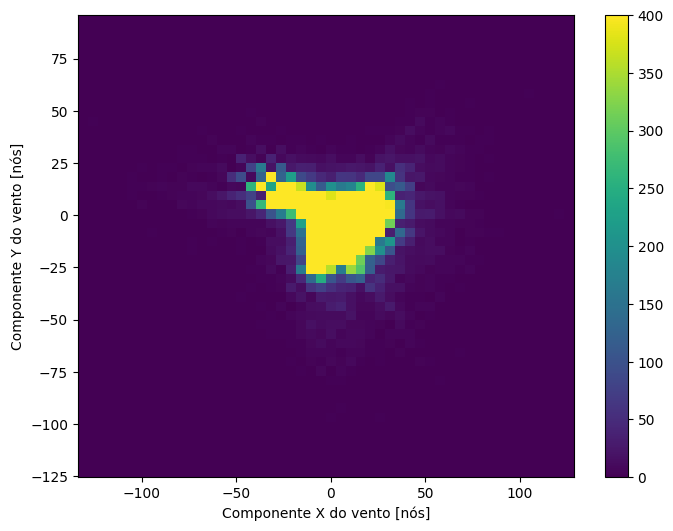

In [ ]:
# Converter direção de onde o vento vem para para onde ele vai
Wind_Direction_cartesiano = (270 - df['Wind_Direction']) % 360
Wind_Direction_rad = np.radians(Wind_Direction_cartesiano)

df.loc[:,'wind_compX'] = df['Average_WSpeed_knots'] * np.cos(Wind_Direction_rad)
df.loc[:,'wind_compY'] = df['Average_WSpeed_knots'] * np.sin(Wind_Direction_rad)

# Remover NaNs para o plot
df_plot = df.dropna(subset=['wind_compX', 'wind_compY'])

plt.hist2d(df_plot['wind_compX'], df_plot['wind_compY'], bins=(50, 50), vmax=400)
plt.colorbar()
plt.xlabel('Componente X do vento [nós]')
plt.ylabel('Componente Y do vento [nós]')
ax = plt.gca()
ax.axis('tight')

In [ ]:
# plot_cols = ['Air_Temp', 'Dew_Point', 'Average_WSpeed_knots', 'Pressure']

# plot_features = df[plot_cols]
# _ = plot_features.plot(subplots=True)

# plot_features = df[plot_cols]['2024-01-01':'2025-02-28']
# _ = plot_features.plot(subplots=True)

# #Atualmente, a distribuição dos dados de vento se parece com esta:
# df_plot = df.dropna(subset=['Wind_Direction', 'Average_WSpeed_knots'])
# plt.hist2d(df_plot['Wind_Direction'], df_plot['Average_WSpeed_knots'], bins=(50, 50), vmax=400)
# plt.colorbar()
# plt.xlabel('Direção do vento (graus)')
# plt.ylabel('Velocidade do vento (nós)')

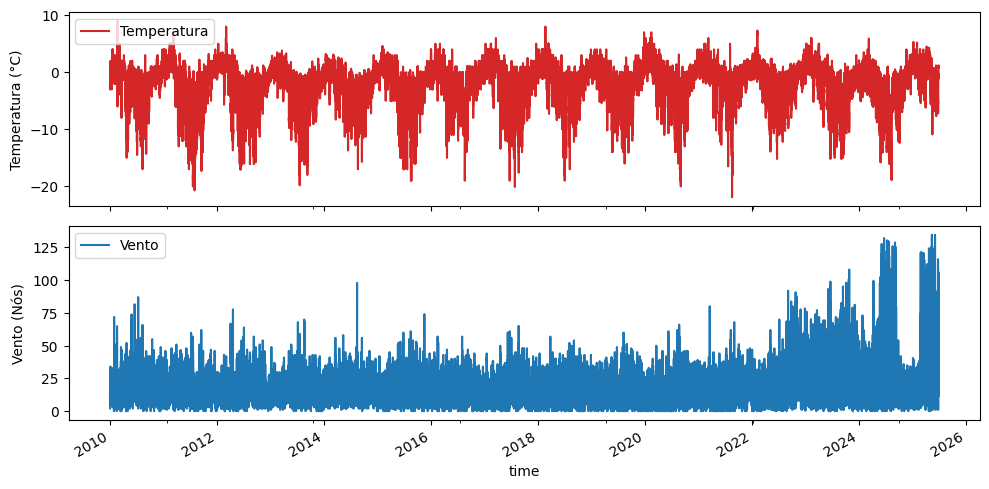

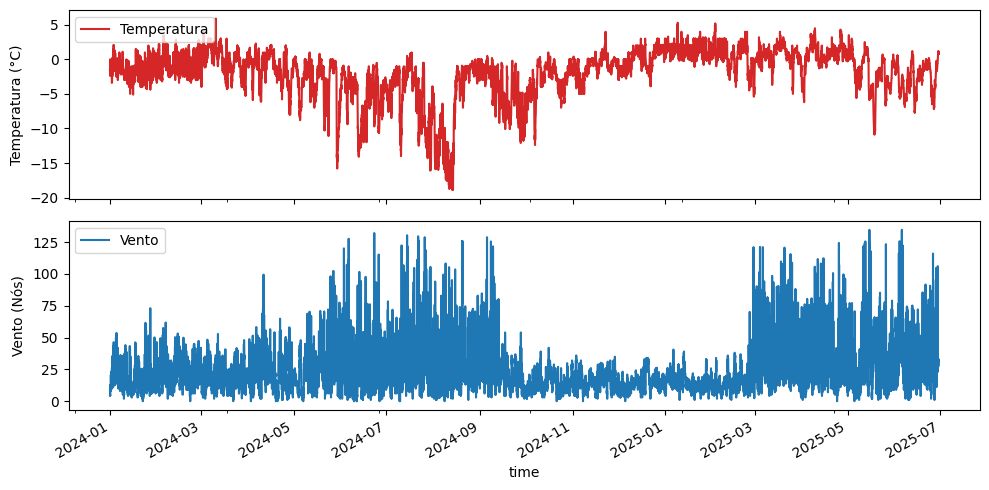

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(10, 5), sharex=True)

df['Air_Temp'].plot(ax=ax[0], color='tab:red', label='Temperatura')
ax[0].set_ylabel('Temperatura (°C)')
ax[0].legend(loc='upper left')

df['Average_WSpeed_knots'].plot(ax=ax[1], color='tab:blue', label='Vento')
ax[1].set_ylabel('Vento (Nós)')
ax[1].legend(loc='upper left')

plt.tight_layout()

fig, ax = plt.subplots(2, 1, figsize=(10, 5), sharex=True)

df['Air_Temp']['2024-01-01'::].plot(ax=ax[0], color='tab:red', label='Temperatura')
ax[0].set_ylabel('Temperatura (°C)')
ax[0].legend(loc='upper left')

df['Average_WSpeed_knots']['2024-01-01'::].plot(ax=ax[1], color='tab:blue', label='Vento')
ax[1].set_ylabel('Vento (Nós)')
ax[1].legend(loc='upper left')

plt.tight_layout()
plt.show()

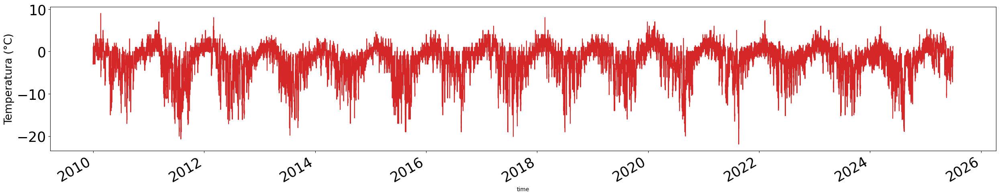

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25, 5))

df['Air_Temp'].plot(ax=ax, color='tab:red', label='Temperatura')

ax.set_ylabel('Temperatura (°C)', fontsize=19)  # Tamanho da fonte do eixo Y
#ax.set_xlabel('Tempo em anos', fontsize=20)              # Tamanho da fonte do eixo X (opcional)
#ax.set_title('Série Temporal da Temperatura no Aeroporto SCRM, na Antártica', fontsize=25)  # Título, se quiser

#ax.legend(loc='upper left', fontsize=20)        # Tamanho da fonte da legenda
ax.tick_params(axis='both', labelsize=25)       # Tamanho da fonte dos ticks dos eixos

plt.tight_layout()
plt.show()

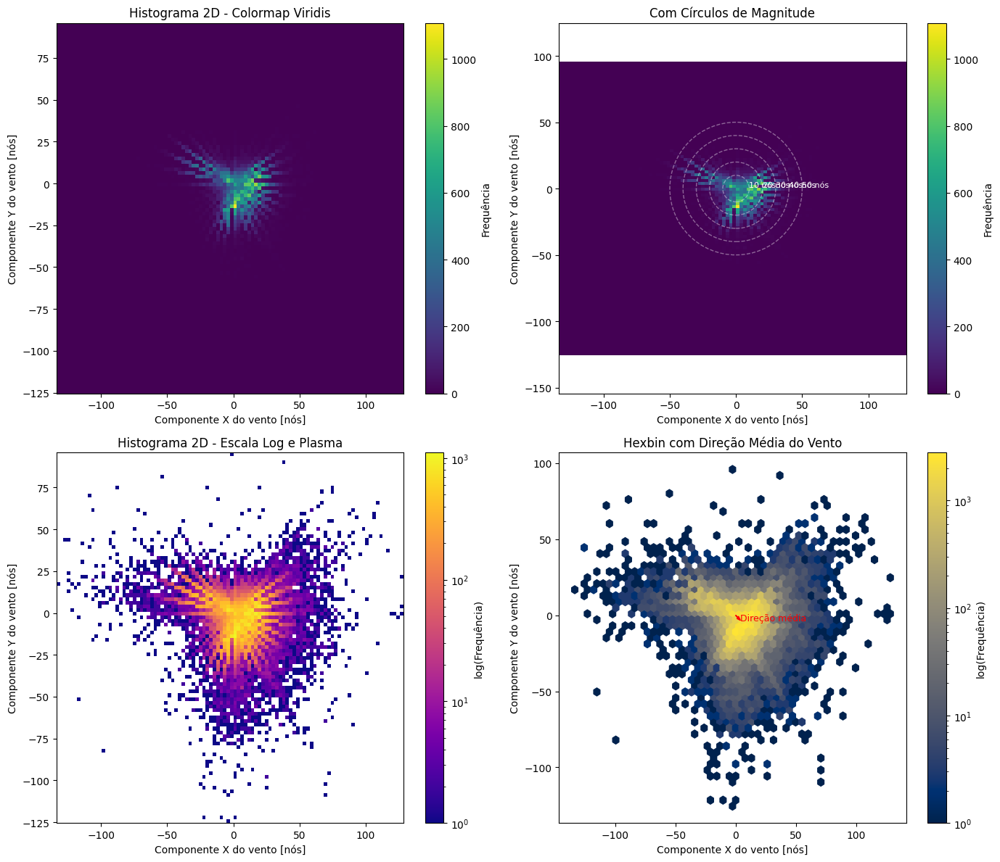

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Certifique-se de que esses campos estão calculados
Wind_Direction_cartesiano = (270 - df['Wind_Direction']) % 360
Wind_Direction_rad = np.radians(Wind_Direction_cartesiano)

df['wind_compX'] = df['Average_WSpeed_knots'] * np.cos(Wind_Direction_rad)
df['wind_compY'] = df['Average_WSpeed_knots'] * np.sin(Wind_Direction_rad)

wind_compX = df['wind_compX']
wind_compY = df['wind_compY']

# Criar figuras com subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 12))

# 1. Histograma 2D padrão com viridis
h1 = axs[0, 0].hist2d(wind_compX, wind_compY, bins=100, cmap='viridis')
axs[0, 0].set_title('Histograma 2D - Colormap Viridis')
axs[0, 0].set_xlabel("Componente X do vento [nós]")
axs[0, 0].set_ylabel("Componente Y do vento [nós]")
fig.colorbar(h1[3], ax=axs[0, 0], label='Frequência')

# 2. Histograma 2D com círculos de magnitude
h2 = axs[0, 1].hist2d(wind_compX, wind_compY, bins=100, cmap='viridis')
axs[0, 1].set_title('Com Círculos de Magnitude')
axs[0, 1].set_xlabel("Componente X do vento [nós]")
axs[0, 1].set_ylabel("Componente Y do vento [nós]")
fig.colorbar(h2[3], ax=axs[0, 1], label='Frequência')
for mag in [10, 20, 30, 40, 50]:
    circle = plt.Circle((0, 0), mag, color='white', fill=False, linestyle='--', alpha=0.4)
    axs[0, 1].add_patch(circle)
    axs[0, 1].text(mag, 0, f'{mag} nós', color='white', fontsize=8, ha='left', va='bottom')
axs[0, 1].axis('equal')

# 3. Histograma 2D com log da frequência
h3 = axs[1, 0].hist2d(wind_compX, wind_compY, bins=100, cmap='plasma', norm='log')
axs[1, 0].set_title('Histograma 2D - Escala Log e Plasma')
axs[1, 0].set_xlabel("Componente X do vento [nós]")
axs[1, 0].set_ylabel("Componente Y do vento [nós]")
fig.colorbar(h3[3], ax=axs[1, 0], label='log(Frequência)')

# 4. Hexbin com direção média
hb = axs[1, 1].hexbin(wind_compX, wind_compY, gridsize=50, cmap='cividis', bins='log')
axs[1, 1].set_title('Hexbin com Direção Média do Vento')
axs[1, 1].set_xlabel("Componente X do vento [nós]")
axs[1, 1].set_ylabel("Componente Y do vento [nós]")
fig.colorbar(hb, ax=axs[1, 1], label='log(Frequência)')

# Direção média do vetor vento
U_mean = wind_compX.mean()
V_mean = wind_compY.mean()
axs[1, 1].arrow(0, 0, U_mean, V_mean, color='red', head_width=2, length_includes_head=True)
axs[1, 1].text(U_mean, V_mean, 'Direção média', color='red', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
Average_WSpeed_knots = df.pop('Average_WSpeed_knots')
Weather_Cond_Code = df.pop('Weather_Cond_Code')
Total_Precip = df.pop('Total_Precip')

In [ ]:
# Aqui está sendo feito o drop de Wind_Direction

df.drop(['Wind_Direction'], axis=1, inplace=True)

In [ ]:
df.loc[:,'year'] = df.index.year
df.loc[:,'month'] = df.index.month
df.loc[:,'day'] = df.index.day
df.loc[:,'hour'] = df.index.hour

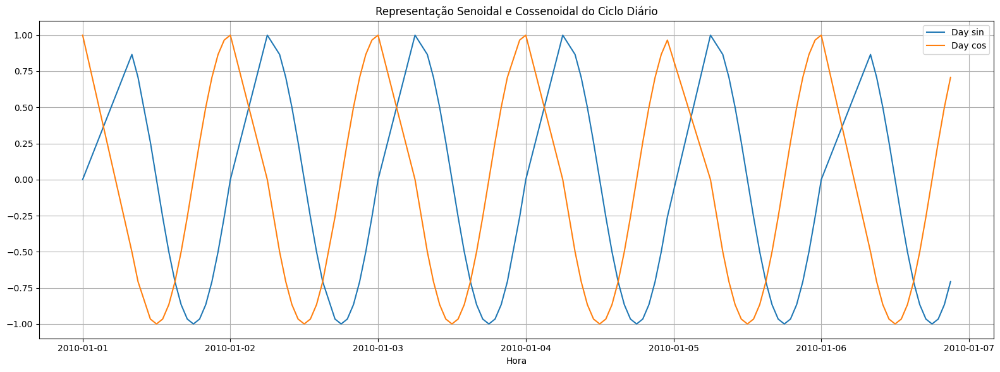

In [ ]:
# Garantir que o índice está em datetime
df.index = pd.to_datetime(df.index)

# Transformar o índice para timestamp em segundos
timestamp_s = df.index.view('int64') // 1_000_000_000  # segundos desde época UNIX

# Constantes
day = 24*60*60
year = 365.2425*day

# Cálculo dos componentes sazonais
df.loc[:,'Day sin'] = np.sin(2 * np.pi * timestamp_s / day)
df.loc[:,'Day cos'] = np.cos(2 * np.pi * timestamp_s / day)
df.loc[:,'Year sin'] = np.sin(2 * np.pi * timestamp_s / year)
df.loc[:,'Year cos'] = np.cos(2 * np.pi * timestamp_s / year)

# Visualizar o ciclo diário nos primeiros 24 pontos (ou 25 horas)
plt.figure(figsize=(16, 6))
plt.plot(df['Day sin'][:100], label='Day sin')
plt.plot(df['Day cos'][:100], label='Day cos')
plt.xlabel('Hora')
plt.title('Representação Senoidal e Cossenoidal do Ciclo Diário')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df.head()
df.describe().transpose()
df.isna().any().any()

np.False_

## Dividir os dados (Split the data)

Você usará uma divisão **(70%, 20%, 10%)** para os conjuntos de **treinamento, validação e teste**. Observe que os dados não são embaralhados aleatoriamente antes da divisão. Isso ocorre por dois motivos:

Isso garante que ainda seja possível dividir os dados em janelas de amostras consecutivas.
Isso garante que os resultados da validação/teste sejam mais realistas, sendo avaliados com base nos dados coletados após o treinamento do modelo.

In [ ]:
column_indices = {name: i for i, name in enumerate(df.columns)}
n = len(df)
print(n)

train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

106833


## Normalização (escalonamento) dos dados
É importante escalonar os atributos antes de treinar uma rede neural. A normalização é a maneira mais comum de fazer esse escalonamento. Fórmula => [atributo(feature-média]/[desvio padrão], isso para cada atributo do conjunto de dados.

### Importante:
A média e o desvio padrão devem ser calculados apenas usando os dados de treinamento para que **os modelos não tenham acesso aos valores nos conjuntos de validação e teste.**

In [ ]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

/tmp/ipython-input-1335022677.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ = ax.set_xticklabels(df.keys(), rotation=90)


,Column,Normalized
0,Air_Temp,-0.088042
1,Air_Temp,-0.270063
2,Air_Temp,-0.270063
3,Air_Temp,-0.010033
4,Air_Temp,0.197990


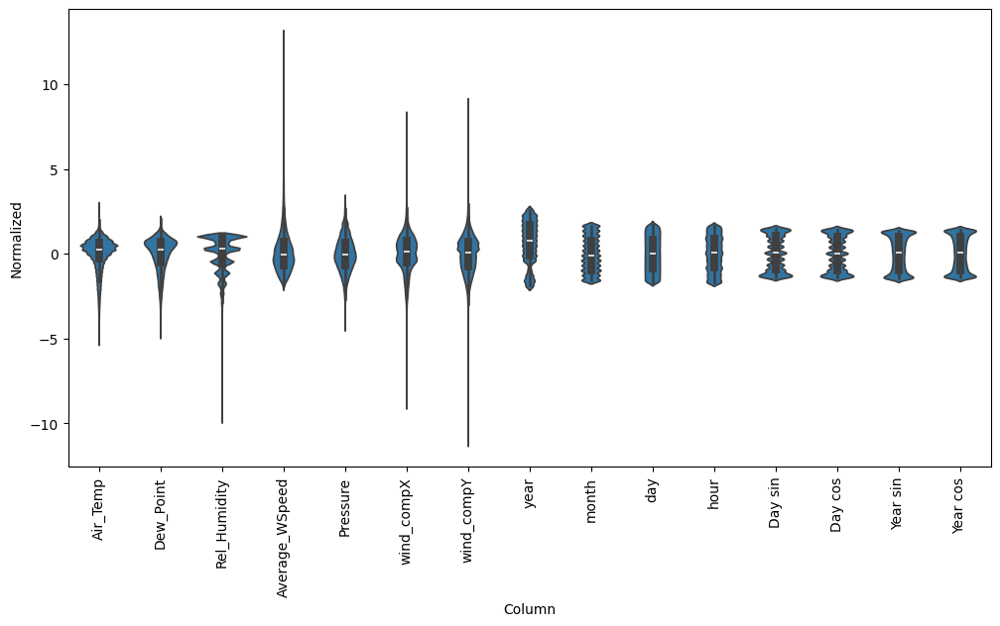

In [ ]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')

plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

df_std.head()

## Classe Auxiliar - WindowGenerator()

In [ ]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):

    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [ ]:
# def plot(self, model=None, plot_col='Air_Temp', max_subplots=3):
#   inputs, labels = self.example
#   plt.figure(figsize=(12, 8))
#   plot_col_index = self.column_indices[plot_col]
#   max_n = min(max_subplots, len(inputs))
#   for n in range(max_n):
#     plt.subplot(max_n, 1, n+1)
#     plt.ylabel(f'{plot_col} [normed]')
#     plt.plot(self.input_indices, inputs[n, :, plot_col_index],
#              label='Inputs', marker='.', zorder=-10)

#     if self.label_columns:
#       label_col_index = self.label_columns_indices.get(plot_col, None)
#     else:
#       label_col_index = plot_col_index

#     if label_col_index is None:
#       continue

#     plt.scatter(self.label_indices, labels[n, :, label_col_index],
#                 edgecolors='k', label='Labels', c='#2ca02c', s=64)
#     if model is not None:
#       predictions = model(inputs)
#       plt.scatter(self.label_indices, predictions[n, :, label_col_index],
#                   marker='X', edgecolors='k', label='Predictions',
#                   c='#ff7f0e', s=64)

#     if n == 0:
#       plt.legend()

#   plt.xlabel('Time [h]')

# WindowGenerator.plot = plot

In [ ]:
# Esta é a função plot mais recente

def plot(self, models=None, plot_col='Air_Temp', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(12, 8))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))

    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normalizado]')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                 label='Entrada', marker='.', zorder=-10)

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', label='Observado', c='#2ca02c', s=64)

        if models is not None:
            for name, model in models.items():
                try:
                    preds = model(inputs)

                    # Debug: imprimir forma das previsões
                    print(f"Modelo {name}: forma das previsões = {preds.shape}")

                    # Extrair valores de previsão baseado na forma
                    if len(preds.shape) == 3:
                        # Caso 1: Forma [batch, time, features]
                        if preds.shape[2] == 1:
                            # Se última dimensão é 1, achatar
                            pred_values = preds[n, :, 0].numpy()
                        else:
                            # Se tem múltiplas features, usar o índice correto
                            if preds.shape[2] > label_col_index:
                                pred_values = preds[n, :, label_col_index].numpy()
                            else:
                                pred_values = preds[n, :, 0].numpy()
                    elif len(preds.shape) == 2:
                        # Caso 2: Forma [batch, time] ou [batch, features]
                        pred_values = preds[n, :].numpy()
                    else:
                        print(f"Forma inesperada para {name}: {preds.shape}")
                        continue

                    # Determinar quantos pontos temos para plotar
                    num_pred_points = len(pred_values)
                    num_label_points = len(self.label_indices)

                    # Ajustar índices e valores para o plot
                    if num_pred_points == num_label_points:
                        # Caso ideal: mesmo número de pontos
                        plot_indices = self.label_indices
                        plot_values = pred_values
                    elif num_pred_points == 1:
                        # Previsão de único passo (CNN com conv_window)
                        plot_indices = [self.label_indices[-1]]
                        plot_values = pred_values
                    elif num_pred_points < num_label_points:
                        # Menos previsões que labels
                        plot_indices = self.label_indices[:num_pred_points]
                        plot_values = pred_values
                    else:
                        # Mais previsões que labels (truncar)
                        plot_indices = self.label_indices
                        plot_values = pred_values[:num_label_points]

                    # Plotar
                    plt.scatter(plot_indices,
                                plot_values,
                                marker='X', edgecolors='k',
                                label=name,
                                s=64)

                except Exception as e:
                    print(f"Erro ao processar modelo {name}: {e}")
                    continue

        if n == 0:
            plt.legend()
    plt.xlabel('Tempo [horas]')

# Substitui o método na classe
WindowGenerator.plot = plot

In [ ]:
# Esta é a versão mais recente da função plot (experimental)

def plot(self, models=None, plot_col='Air_Temp', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(12, 8))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))

    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normalizado]')

        # Plotar entrada começando de 0
        input_hours = np.arange(len(self.input_indices))
        plt.plot(input_hours, inputs[n, :, plot_col_index],
                 label='Entrada', marker='.', zorder=-10)

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        # Calcular onde as labels começam em relação ao início (hora 0)
        label_start_hour = self.label_indices[0] - self.input_indices[0]
        label_hours = np.arange(label_start_hour, label_start_hour + len(self.label_indices))

        plt.scatter(label_hours, labels[n, :, label_col_index],
                    edgecolors='k', label='Observado', c='#2ca02c', s=64)

        if models is not None:
            for name, model in models.items():
                try:
                    preds = model(inputs)

                    if len(preds.shape) == 3:
                        if preds.shape[2] == 1:
                            pred_values = preds[n, :, 0].numpy()
                        else:
                            if preds.shape[2] > label_col_index:
                                pred_values = preds[n, :, label_col_index].numpy()
                            else:
                                pred_values = preds[n, :, 0].numpy()
                    elif len(preds.shape) == 2:
                        pred_values = preds[n, :].numpy()
                    else:
                        continue

                    num_pred_points = len(pred_values)

                    # Para CNN com conv_window (prevê apenas 1 passo)
                    if name == 'CNN' and num_pred_points == 1:
                        # CNN prevê para o primeiro ponto de label
                        plot_indices = [label_hours[0]]
                        plot_values = pred_values
                    elif num_pred_points == len(label_hours):
                        plot_indices = label_hours
                        plot_values = pred_values
                    elif num_pred_points < len(label_hours):
                        plot_indices = label_hours[:num_pred_points]
                        plot_values = pred_values
                    else:
                        plot_indices = label_hours
                        plot_values = pred_values[:len(label_hours)]

                    plt.scatter(plot_indices,
                                plot_values,
                                marker='X', edgecolors='k',
                                label=name,
                                s=64)

                except Exception as e:
                    print(f"Erro ao processar modelo {name}: {e}")
                    continue

        if n == 0:
            plt.legend()

    plt.xlabel('Tempo [horas]')

# Substitui o método na classe
WindowGenerator.plot = plot

In [ ]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack([labels[:, :, self.column_indices[name]] for name in self.label_columns], axis=-1)
  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [ ]:
#Primeira janela com shift de 24 horas, com 24 horas de dados anteriores
w1 = WindowGenerator(input_width=24, label_width=1, shift=24, label_columns=['Air_Temp'])
w1

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [47]
Label column name(s): ['Air_Temp']

In [ ]:
w2 = WindowGenerator(input_width=6, label_width=1, shift=1,
                     label_columns=['Air_Temp'])
w2

Total window size: 7
Input indices: [0 1 2 3 4 5]
Label indices: [6]
Label column name(s): ['Air_Temp']

In [ ]:
# Stack three slices, the length of the total window.
example_window = tf.stack([np.array(train_df[:w2.total_window_size]),
                           np.array(train_df[100:100+w2.total_window_size]),
                           np.array(train_df[200:200+w2.total_window_size])])

example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 7, 15)
Inputs shape: (3, 6, 15)
Labels shape: (3, 1, 1)


In [ ]:
w2.example = example_inputs, example_labels

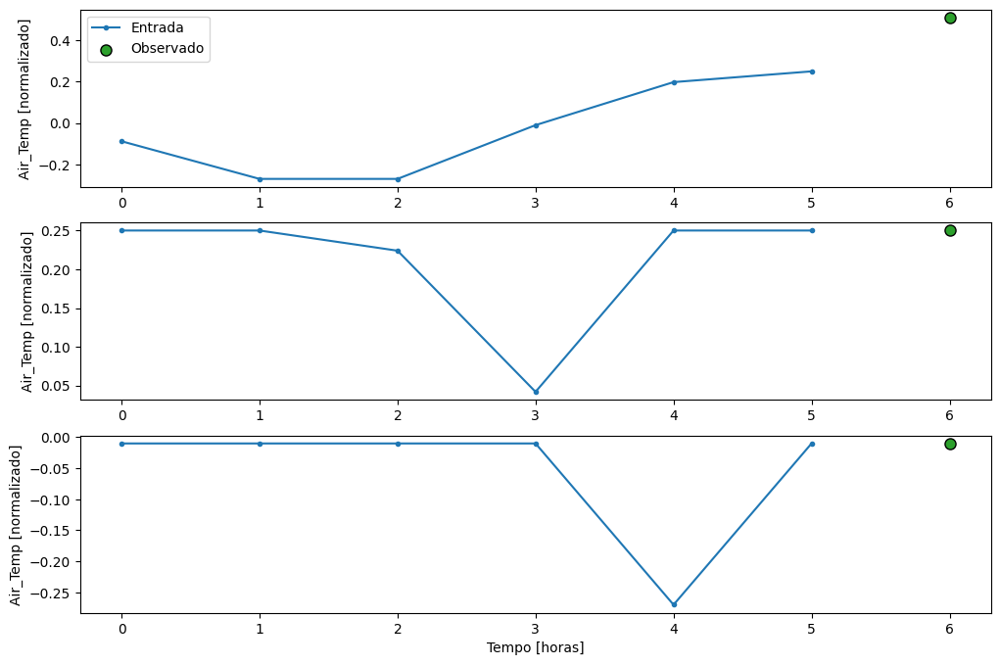

In [ ]:
w2.plot()

Create tf.data.Datasets

Finally, this make_dataset method will take a time series DataFrame and convert it to a tf.data.Dataset of (input_window, label_window) pairs using the tf.keras.utils.timeseries_dataset_from_array function:

In [ ]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [ ]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [ ]:
# Each element is an (inputs, label) pair.
w2.train.element_spec

(TensorSpec(shape=(None, 6, 15), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

In [ ]:
for example_inputs, example_labels in w2.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 6, 15)
Labels shape (batch, time, features): (32, 1, 1)


# METAR com Temperatura - Modelos de Aprendizado de Máquina - MSE

Single step models
The simplest model you can build on this sort of data is one that predicts a single feature's value—1 time step (one hour) into the future based only on the current conditions.

So, start by building models to predict the T (degC) value one hour into the future.
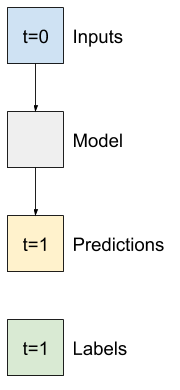

Predict the next time step

Configure a WindowGenerator object to produce these single-step (input, label) pairs:

## ARIMA - METAR com Temperatura

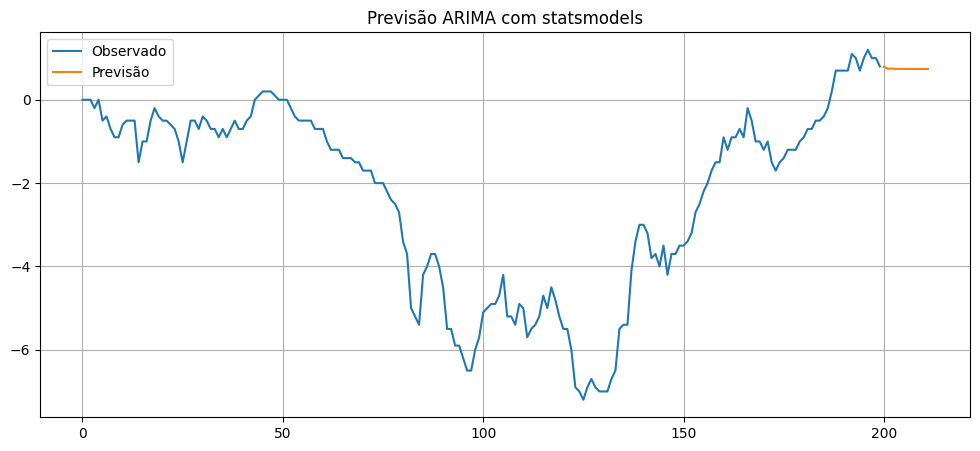

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

series = df['Air_Temp'].values[-200:]

model = ARIMA(series, order=(2,1,1))
model_fit = model.fit()
forecast = model_fit.forecast(steps=12)

# Plot
plt.figure(figsize=(12, 5))
plt.plot(series, label='Observado')
plt.plot(np.arange(len(series), len(series)+12), forecast, label='Previsão')
plt.legend()
plt.grid(True)
plt.title("Previsão ARIMA com statsmodels")
plt.show()

In [ ]:
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['Air_Temp'])
single_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['Air_Temp']

In [ ]:
for example_inputs, example_labels in single_step_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 1, 15)
Labels shape (batch, time, features): (32, 1, 1)


## Baseline - METAR com Temperatura - MSE

In [ ]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

In [ ]:
baseline = Baseline(label_index=column_indices['Air_Temp'])

baseline_fit_start = time.time()
baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                 metrics=[tf.keras.metrics.MeanAbsoluteError()])
baseline_fit_end = time.time()
baseline_fit_elapsed = baseline_fit_end - baseline_fit_start
tempos_treinamento['baseline'] = baseline_fit_elapsed

baseline_val_start = time.time()
val_performance['Baseline'] = baseline.evaluate(single_step_window.val, return_dict=True)
baseline_val_end = time.time()
baseline_val_elapsed = baseline_val_end - baseline_val_start
tempos_validacao['baseline'] = baseline_val_elapsed

baseline_test_start = time.time()
performance['Baseline'] = baseline.evaluate(single_step_window.test, verbose=0, return_dict=True)
baseline_test_end = time.time()
baseline_test_elapsed = baseline_test_end - baseline_test_start
tempos_teste['baseline'] = baseline_test_elapsed

668/668 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0360 - mean_absolute_error: 0.1196


In [ ]:
tempos_teste

{'baseline': 1.3413794040679932}

In [ ]:
tempos_validacao

{'baseline': 5.414351940155029}

In [ ]:
tempos_treinamento

{'baseline': 0.02585005760192871}

In [ ]:
modelo = 'baseline'
print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: baseline
Tempo de treinamento: 0.02585005760192871 s
Tempo de validação: 5.414351940155029 s
Tempo de teste/inferência: 1.3413794040679932 s


loss: 0.3....Valor da função de perda, que é o Mean Squared Error (MSE) neste caso. Indica o erro quadrático médio entre as predições e os valores reais. Quanto menor, melhor. O MSE de 0.02....mostra a média dos erros quadrados, que penaliza erros maiores.

mean_absolute_error: 0.3 Métrica de erro médio absoluto (MAE). Representa a média das diferenças absolutas entre as predições e valores reais. O baseline está errando em média cerca de 0.3 unidades da variável prevista (exemplo: graus de temperatura, se for temperatura).


In [ ]:
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['Air_Temp'])

wide_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['Air_Temp']

## Função Auxiliar - compile_and_fit - Suporte a MAE, MAPE, RMSE e MSE.

In [ ]:
MAX_EPOCHS = 20

# O método "early_stopping" monitora o desempenho do modelo durante o treino.
# Ela monitora a métrica 'val_loss' (perda no conjunto de validação).
# Se a validação não melhorar após patience épocas (aqui, 2), o treino para antes do limite máximo.
# mode='min' indica que queremos minimizar a perda.
# patience: quantas épocas o treino espera para tentar melhorar a validação antes de parar (early stopping).

def root_mean_squared_error(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

def compile_and_fit(model, window, model_name, patience=2, time_based=True, loss_type='MSE'):
    """Função auxiliar para treinar modelos com monitoramento automático."""
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=patience,
        mode='min'
    )

    resource_monitor = ResourceMonitorCallback(model_name=model_name, time_based=time_based)

    # Seleciona a função de perda
    if loss_type == 'MAPE':
        loss_function = tf.keras.losses.MeanAbsolutePercentageError()
        extra_metrics = [tf.keras.metrics.MeanAbsoluteError()]
    elif loss_type == 'MAE':
        loss_function = tf.keras.losses.MeanAbsoluteError()
        extra_metrics = [tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.MeanAbsolutePercentageError(), tf.keras.metrics.MeanSquaredError()]
    elif loss_type == 'RMSE':
        loss_function = tf.keras.losses.MeanSquaredError()  # Loss continua sendo MSE
        extra_metrics = [tf.keras.metrics.MeanAbsoluteError(), root_mean_squared_error]
    elif loss_type == 'MSE':
        loss_function = tf.keras.losses.MeanSquaredError()
        extra_metrics = [tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.MeanAbsolutePercentageError(), tf.keras.metrics.MeanSquaredError()]
    else:
        raise ValueError(f"Loss type '{loss_type}' não suportado.")

    model.compile(
        loss=loss_function,
        optimizer=tf.keras.optimizers.Adam(),
        metrics=extra_metrics
    )

    history = model.fit(
        window.train,
        epochs=MAX_EPOCHS,
        validation_data=window.val,
        callbacks=[early_stopping, resource_monitor],
        verbose=1
    )

    #resource_monitor.plot_metrics()
    return history

## Linear - METAR com Temperatura - MSE

The simplest trainable model you can apply to this task is to insert linear transformation between the input and output. In this case the output from a time step only depends on that step:
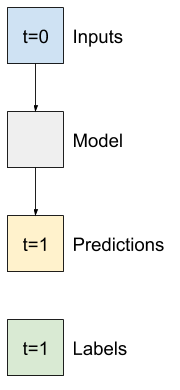



In [ ]:
modelo = 'Linear'

if modo_execucao == 'Treinamento':
  linear = tf.keras.Sequential([
      tf.keras.layers.Dense(units=1)
  ])
  print('Input shape:', single_step_window.example[0].shape)
  print('Output shape:', linear(single_step_window.example[0]).shape)

  linear_fit_start = time.time()
  history = compile_and_fit(linear, single_step_window, model_name='Linear')
  linear_fit_end = time.time()
  linear_fit_elapsed = linear_fit_end - linear_fit_start
  tempos_treinamento[modelo] = linear_fit_elapsed
else:
  linear = tf.keras.models.load_model(f"{lista_modelos['Linear']}")

linear_val_start = time.time()
val_performance['Linear'] = linear.evaluate(single_step_window.val, return_dict=True)
linear_val_end = time.time()
linear_val_elapsed = linear_val_end - linear_val_start
tempos_validacao[modelo] = linear_val_elapsed

linear_test_start = time.time()
performance['Linear'] = linear.evaluate(single_step_window.test, verbose=0, return_dict=True)
linear_test_end = time.time()
linear_test_elapsed = linear_test_end - linear_test_start
tempos_teste[modelo] = linear_test_elapsed

Input shape: (32, 1, 15)
Output shape: (32, 1, 1)
AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.4906 - mean_absolute_error: 0.4571 - mean_absolute_percentage_error: 362.9061 - mean_squared_error: 0.4906 - root_mean_squared_error: 0.6618 - val_loss: 0.0352 - val_mean_absolute_error: 0.1256 - val_mean_absolute_percentage_error: 112.0188 - val_mean_squared_error: 0.0352 - val_root_mean_squared_error: 0.1876
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0340 - mean_absolute_error: 0.1140 - mean_absolute_percentage_error: 96.5819 - mean_squared_error: 0.0340 - root_mean_squared_error: 0.1844 - val_loss: 0.0346 - val_mean_absolute_error: 0.1217 - val_mean_absolute_percentage_error: 105.2997 - val_mean_squared_error: 0.0346 - val_root_mean_squared_error: 0.1860
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0339 - mean_absolute_error: 0.1134 - mean_absolute_percent

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  linear.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: Linear
Tempo de treinamento: 66.61089658737183 s
Tempo de validação: 2.6384999752044678 s
Tempo de teste/inferência: 0.9338967800140381 s


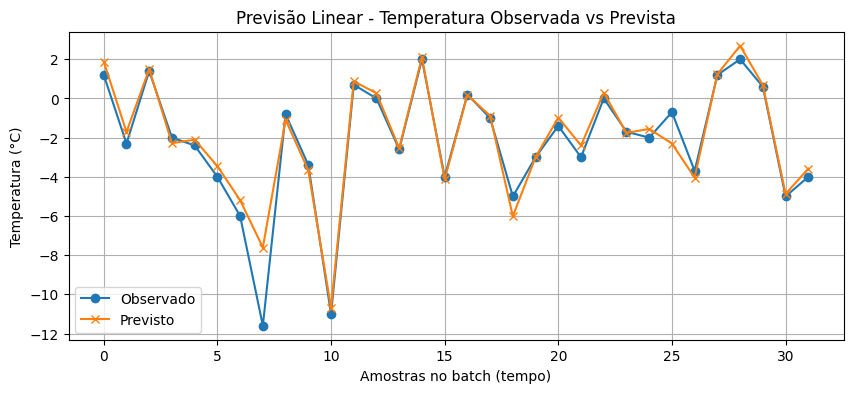

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Obtemos um batch do dataset de teste
for inputs, labels in single_step_window.test.take(1):
    predictions = linear(inputs)  # faz a predição com o modelo treinado

# Converte para numpy e remove dimensões extras
true = labels.numpy().squeeze()        # shape (batch_size,)
pred = predictions.numpy().squeeze()   # shape (batch_size,)

# Reverte a normalização z-score (supondo train_mean e train_std definidos para 'Air_Temp')
true_orig = true * train_std['Air_Temp'] + train_mean['Air_Temp']
pred_orig = pred * train_std['Air_Temp'] + train_mean['Air_Temp']

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(true_orig, label='Observado', marker='o')
plt.plot(pred_orig, label='Previsto', marker='x')
plt.title('Previsão Linear - Temperatura Observada vs Prevista')
plt.xlabel('Amostras no batch (tempo)')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# wide_window.plot(linear)
# wide_window.plot(baseline)

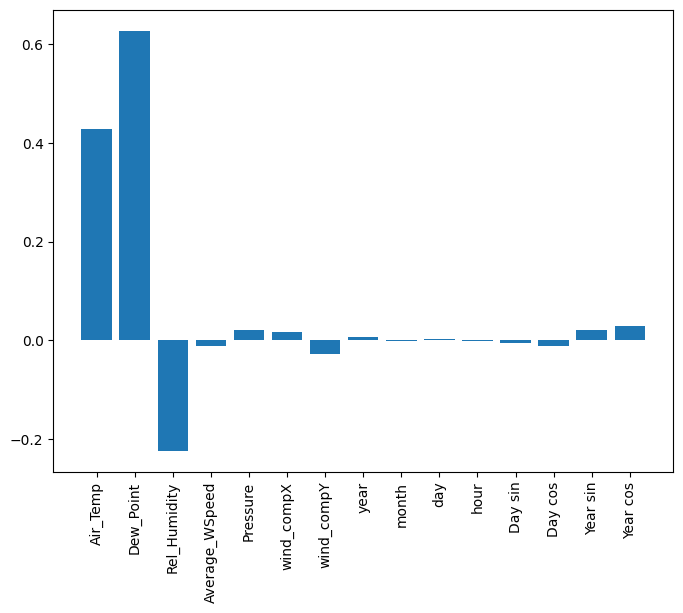

In [ ]:
plt.bar(x = range(len(train_df.columns)), height=linear.layers[0].kernel[:,0].numpy())
axis = plt.gca()

axis.set_xticks(range(len(train_df.columns)))
_ = axis.set_xticklabels(train_df.columns, rotation=90)

## Multi-Layer Perceptron (MLP) - 'DENSE' - METAR com Temperatura - MSE

Before applying models that actually operate on multiple time-steps, it's worth checking the performance of deeper, more powerful, single input step models.

Here's a model similar to the linear model, except it stacks several a few Dense layers between the input and the output.

**perceptron multicamadas (MLP)** simples para problemas de regressão, como o nosso para prever estimar temperatura.

Esse modelo tem 3 camadas densas (fully connected):
* Primeira camada: 64 neurônios, função de ativação ReLU (relu), que introduz não linearidade.

* Segunda camada: mais 64 neurônios com ativação ReLU.

* Terceira camada: camada de saída com 1 neurônio (sem ativação explícita, padrão é linear), para regressão (ex: prever temperatura).



In [ ]:
modelo = 'mlp'
if modo_execucao == 'Treinamento':
  mlp_fit_start = time.time()
  dense = tf.keras.Sequential([
      tf.keras.layers.Dense(units=64, activation='relu'),
      tf.keras.layers.Dense(units=64, activation='relu'),
      tf.keras.layers.Dense(units=1)
  ])

  history = compile_and_fit(dense, single_step_window, model_name='mlp')
  mlp_fit_end = time.time()
  mlp_fit_elapsed = mlp_fit_end - mlp_fit_start
  tempos_treinamento[modelo] = mlp_fit_elapsed
else:
  dense = tf.keras.models.load_model(f"{lista_modelos['mlp']}")


mlp_val_start = time.time()
val_performance['Dense'] = dense.evaluate(single_step_window.val, return_dict=True)
mlp_val_end = time.time()
mlp_val_elapsed = mlp_val_end - mlp_val_start
tempos_validacao[modelo] = mlp_val_elapsed

mlp_test_start = time.time()
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0, return_dict=True)
mlp_test_end = time.time()
mlp_test_elapsed = mlp_test_end - mlp_test_start
tempos_teste[modelo] = mlp_test_elapsed

AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0688 - mean_absolute_error: 0.1644 - mean_absolute_percentage_error: 128.3104 - mean_squared_error: 0.0688 - root_mean_squared_error: 0.2483 - val_loss: 0.0437 - val_mean_absolute_error: 0.1487 - val_mean_absolute_percentage_error: 145.4580 - val_mean_squared_error: 0.0437 - val_root_mean_squared_error: 0.2090
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0334 - mean_absolute_error: 0.1213 - mean_absolute_percentage_error: 101.6541 - mean_squared_error: 0.0334 - root_mean_squared_error: 0.1826 - val_loss: 0.0386 - val_mean_absolute_error: 0.1357 - val_mean_absolute_percentage_error: 134.0509 - val_mean_squared_error: 0.0386 - val_root_mean_squared_error: 0.1966
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 0.0323 - mean_absolute_error: 0.1181 - mean_absolute_percentage_error: 97.8830 - mean_squared_error: 0.0323

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  dense.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: mlp
Tempo de treinamento: 63.06341099739075 s
Tempo de validação: 2.1007044315338135 s
Tempo de teste/inferência: 1.345576524734497 s


O erro deu alto e o gráfico abaixo mostra isso:

* Vamos aplicar o Dropout ou aqui vou aplicar => L2 regularization para evitar overfitting.

## Multi-Layer Perceptron (MLP) - 'DENSE_2' - METAR com Temperatura - MSE

In [ ]:
modelo = 'mlp2'

if modo_execucao == 'Treinamento':
  mlp2_fit_start = time.time()
  dense = tf.keras.Sequential([
      tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
      tf.keras.layers.Dropout(0.2),
      tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
      tf.keras.layers.Dense(1)
  ])

  history = compile_and_fit(dense, single_step_window, model_name='mlp2')
  mlp2_fit_end = time.time()
  mlp2_fit_elapsed = mlp2_fit_end - mlp2_fit_start
  tempos_treinamento[modelo] = mlp2_fit_elapsed
else:
  dense = tf.keras.models.load_model(f"{lista_modelos['mlp2']}")

mlp2_val_start = time.time()
val_performance['Dense'] = dense.evaluate(single_step_window.val, return_dict=True)
mlp2_val_end = time.time()
mlp2_val_elapsed = mlp2_val_end - mlp2_val_start
tempos_validacao[modelo] = mlp2_val_elapsed

mlp2_test_start = time.time()
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0, return_dict=True)
mlp2_test_end = time.time()
mlp2_test_elapsed = mlp2_test_end - mlp2_test_start
tempos_teste[modelo] = mlp2_test_elapsed

AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - loss: 0.1707 - mean_absolute_error: 0.2219 - mean_absolute_percentage_error: 179.1662 - mean_squared_error: 0.1081 - root_mean_squared_error: 0.3160 - val_loss: 0.0550 - val_mean_absolute_error: 0.1296 - val_mean_absolute_percentage_error: 120.2859 - val_mean_squared_error: 0.0358 - val_root_mean_squared_error: 0.1891
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 20s 5ms/step - loss: 0.0541 - mean_absolute_error: 0.1335 - mean_absolute_percentage_error: 107.9948 - mean_squared_error: 0.0394 - root_mean_squared_error: 0.1984 - val_loss: 0.0484 - val_mean_absolute_error: 0.1417 - val_mean_absolute_percentage_error: 138.0876 - val_mean_squared_error: 0.0407 - val_root_mean_squared_error: 0.2018
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 20s 5ms/step - loss: 0.0442 - mean_absolute_error: 0.1283 - mean_absolute_percentage_error: 101.0469 - mean_squared_error: 0.037

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  dense.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: mlp2
Tempo de treinamento: 82.78998756408691 s
Tempo de validação: 2.6221797466278076 s
Tempo de teste/inferência: 2.626399040222168 s


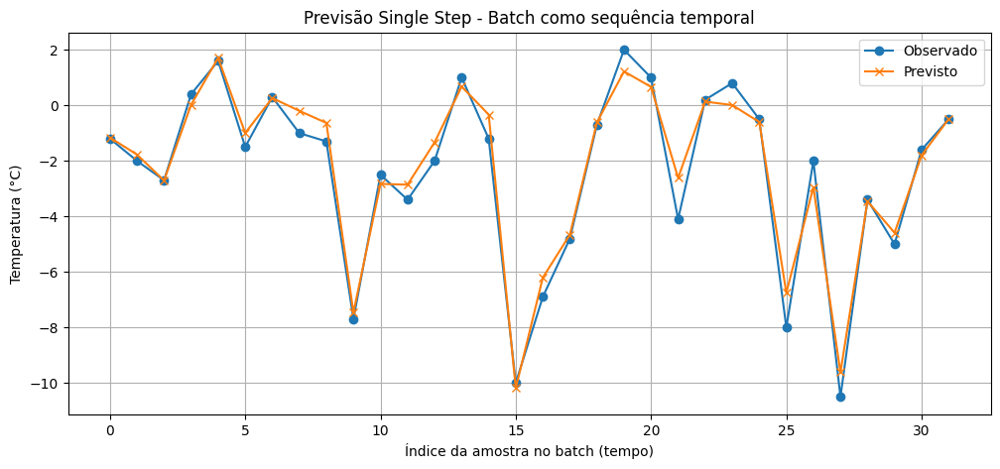

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

for inputs, labels in single_step_window.test.take(1):
    predictions = dense(inputs)

# labels e predictions tem shape (batch_size, 1, 1)
# Vamos pegar a dimensão batch para plotar no eixo x
true = labels.numpy().squeeze()       # shape (batch_size,)
pred = predictions.numpy().squeeze()  # shape (batch_size,)

# Reverter normalização
true_orig = true * train_std['Air_Temp'] + train_mean['Air_Temp']
pred_orig = pred * train_std['Air_Temp'] + train_mean['Air_Temp']

plt.figure(figsize=(12, 5))
plt.plot(true_orig, label='Observado', marker='o')
plt.plot(pred_orig, label='Previsto', marker='x')
plt.title('Previsão Single Step - Batch como sequência temporal')
plt.xlabel('Índice da amostra no batch (tempo)')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', linear(wide_window.example[0]).shape)

#wide_window.plot(dense)

Input shape: (32, 24, 15)
Output shape: (32, 24, 1)


**Multi-step dense**

A single-time-step model has no context for the current values of its inputs. It can't see how the input features are changing over time. To address this issue the model needs access to multiple time steps when making predictions. The baseline, linear and dense (MLP) models handled each time step independently.

Here the model will take multiple time steps as input to produce a single output.

Create a WindowGenerator that will produce batches of three-hour inputs and one-hour labels:

Note that the Window's shift parameter is relative to the end of the two windows.

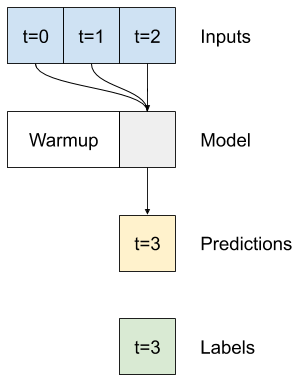

In [ ]:
CONV_WIDTH = 3
conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=['Air_Temp'])

conv_window
#conv_window.plot()

plt.suptitle("Dada 3 horas de INPUT, o modelo estima 1 hora a frente.")

Text(0.5, 0.98, 'Dada 3 horas de INPUT, o modelo estima 1 hora a frente.')

<Figure size 800x600 with 0 Axes>

Vamos treinar uma modelo de Multiple-Input-STEP adicionando tf.keras.layers.Flatten na primeira camada do modelo.

In [ ]:
modelo = 'multiple-input-step'
if modo_execucao == 'Treinamento':
  multiple_input_step_fit_start = time.time()
  multi_step_dense = tf.keras.Sequential([
      # Shape: (time, features) => (time*features)
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(units=32, activation='relu'),
      tf.keras.layers.Dense(units=32, activation='relu'),
      tf.keras.layers.Dense(units=1),
      # Add back the time dimension.
      # Shape: (outputs) => (1, outputs)
      tf.keras.layers.Reshape([1, -1]),
  ])
  history = compile_and_fit(multi_step_dense, conv_window, model_name='multiple-input-step')
  multiple_input_step_fit_end = time.time()
  multiple_input_step_fit_elapsed = multiple_input_step_fit_end - multiple_input_step_fit_start
  tempos_treinamento[modelo] = multiple_input_step_fit_elapsed
else:
  multi_step_dense = tf.keras.models.load_model(f"{lista_modelos['multiple-input-step']}")

#IPython.display.clear_output()
multiple_input_step_val_start = time.time()
val_performance['Multi Step dense'] = multi_step_dense.evaluate(conv_window.val, return_dict=True)
multiple_input_step_val_end = time.time()
multiple_input_step_val_elapsed = multiple_input_step_val_end - multiple_input_step_val_start
tempos_validacao[modelo] = multiple_input_step_val_elapsed

multiple_input_step_test_start = time.time()
performance['Multi Step dense'] = multi_step_dense.evaluate(conv_window.test, verbose=0, return_dict=True)
multiple_input_step_test_end = time.time()
multiple_input_step_test_elapsed = multiple_input_step_test_end - multiple_input_step_test_start
tempos_teste[modelo] = multiple_input_step_test_elapsed

AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.1031 - mean_absolute_error: 0.2087 - mean_absolute_percentage_error: 179.3967 - mean_squared_error: 0.1031 - root_mean_squared_error: 0.3045 - val_loss: 0.0362 - val_mean_absolute_error: 0.1349 - val_mean_absolute_percentage_error: 124.2028 - val_mean_squared_error: 0.0362 - val_root_mean_squared_error: 0.1901
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0339 - mean_absolute_error: 0.1228 - mean_absolute_percentage_error: 107.5594 - mean_squared_error: 0.0339 - root_mean_squared_error: 0.1842 - val_loss: 0.0339 - val_mean_absolute_error: 0.1277 - val_mean_absolute_percentage_error: 109.8963 - val_mean_squared_error: 0.0339 - val_root_mean_squared_error: 0.1842
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0320 - mean_absolute_error: 0.1175 - mean_absolute_percentage_error: 101.7311 - mean_squared_error: 0.0320

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  dense.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: multiple-input-step
Tempo de treinamento: 38.19488501548767 s
Tempo de validação: 2.618170738220215 s
Tempo de teste/inferência: 1.3297479152679443 s


In [ ]:
print('Input shape:', conv_window.example[0].shape)
print('Output shape:', multi_step_dense(conv_window.example[0]).shape)

Input shape: (32, 3, 15)
Output shape: (32, 1, 1)


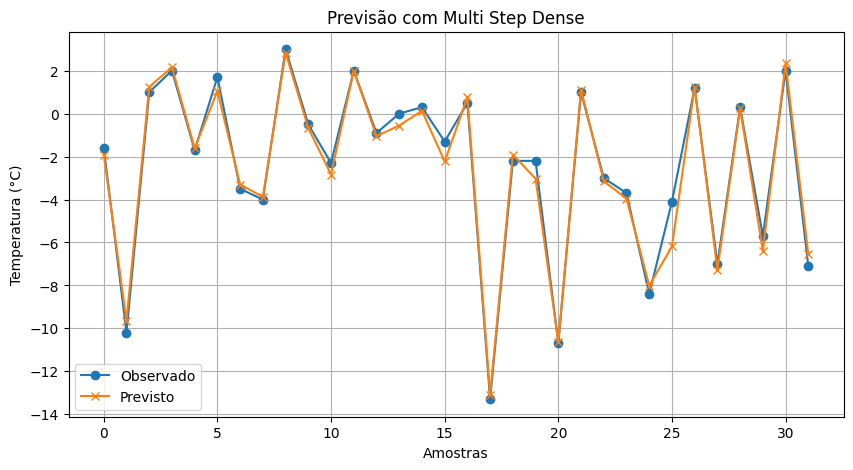

In [ ]:
for inputs, labels in conv_window.test.take(1):
    # inputs: (batch, time, features) — ex: (32, 3, 15)
    predictions = multi_step_dense(inputs)

    # Remove as dimensões extras para facilitar o plot
    y_true = labels[:, 0, 0].numpy()
    y_pred = predictions[:, 0, 0].numpy()

    # Reverte a normalização (Z-score)
    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']

# Plotando
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(y_true_orig, label='Observado', marker='o')
plt.plot(y_pred_orig, label='Previsto', marker='x')
plt.title('Previsão com Multi Step Dense')
plt.xlabel('Amostras')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
#conv_window.plot(multi_step_dense)

In [ ]:
print('Input shape:', wide_window.example[0].shape)
try:
  print('Output shape:', multi_step_dense(wide_window.example[0]).shape)
except Exception as e:
  print(f'\n{type(e).__name__}:{e}')

# O problema:
# input com shape (32, 24, 18) (batch de 32 janelas, cada uma com 24 passos de tempo e 18 variáveis) para um modelo Sequential que espera entrada com última dimensão = 54.
# expected axis -1 of input shape to have value 54, but received input with shape (32, 432)
# indica que, em algum lugar, o modelo foi configurado para esperar vetores de entrada de tamanho 54,
# mas está recebendo algo com shape=(32, 24, 18).

# causa:
# Você deve ter "achatado" a entrada para (batch_size, 432) dentro do modelo — usando Flatten() ou Reshape(), porque:
# 24 (time steps) × 18 (features) = 432 e isso conflita com o que o Sequential espera.

Input shape: (32, 24, 15)

ValueError:Exception encountered when calling Sequential.call().

Input 0 of layer "dense_7" is incompatible with the layer: expected axis -1 of input shape to have value 45, but received input with shape (32, 360)

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(32, 24, 15), dtype=float32)
  • training=None
  • mask=None


In [ ]:
CONV_WIDTH = 24
modelo = 'multiple-input-step-2'

conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=['Air_Temp'])

conv_window

if modo_execucao == 'Treinamento':
  multiple_input_step_2_fit_start = time.time()
  multi_step_dense = tf.keras.Sequential([
      # Shape: (time, features) => (time*features)
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(units=32, activation='relu'),
      tf.keras.layers.Dense(units=32, activation='relu'),
      tf.keras.layers.Dense(units=1),
      # Add back the time dimension.
      # Shape: (outputs) => (1, outputs)
      tf.keras.layers.Reshape([1, 1]),
  ])

  print('Input shape:', conv_window.example[0].shape)
  print('Output shape:', multi_step_dense(conv_window.example[0]).shape)

  history = compile_and_fit(multi_step_dense, conv_window, model_name='multiple-input-step-2')
  multiple_input_step_2_fit_end = time.time()
  multiple_input_step_2_fit_elapsed = multiple_input_step_2_fit_end - multiple_input_step_2_fit_start
  tempos_treinamento[modelo] = multiple_input_step_2_fit_elapsed
else:
  multi_step_dense = tf.keras.models.load_model(f"{lista_modelos['multiple-input-step-2']}")

#IPython.display.clear_output()

multiple_input_step_2_val_start = time.time()
val_performance['Multi-Step-Dense-24input'] = multi_step_dense.evaluate(conv_window.val, return_dict=True)
multiple_input_step_2_val_end = time.time()
multiple_input_step_2_val_elapsed = multiple_input_step_2_val_end - multiple_input_step_2_val_start
tempos_validacao[modelo] = multiple_input_step_2_val_elapsed

multiple_input_step_2_test_start = time.time()
performance['Multi-Step-Dense-24input'] = multi_step_dense.evaluate(conv_window.test, verbose=0, return_dict=True)
multiple_input_step_2_test_end = time.time()
multiple_input_step_2_test_elapsed = multiple_input_step_2_test_end - multiple_input_step_2_test_start
tempos_teste[modelo] = multiple_input_step_2_test_elapsed

#conv_window.plot(multi_step_dense)

Input shape: (32, 24, 15)
Output shape: (32, 1, 1)
AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.1470 - mean_absolute_error: 0.2441 - mean_absolute_percentage_error: 205.5207 - mean_squared_error: 0.1470 - root_mean_squared_error: 0.3620 - val_loss: 0.0401 - val_mean_absolute_error: 0.1440 - val_mean_absolute_percentage_error: 130.9176 - val_mean_squared_error: 0.0401 - val_root_mean_squared_error: 0.2002
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0430 - mean_absolute_error: 0.1419 - mean_absolute_percentage_error: 123.8463 - mean_squared_error: 0.0430 - root_mean_squared_error: 0.2073 - val_loss: 0.0389 - val_mean_absolute_error: 0.1444 - val_mean_absolute_percentage_error: 111.5869 - val_mean_squared_error: 0.0389 - val_root_mean_squared_error: 0.1974
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0390 - mean_absolute_error: 0.1324 - mean_absolute_perc

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  multi_step_dense.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: multiple-input-step-2
Tempo de treinamento: 70.6384928226471 s
Tempo de validação: 2.639597177505493 s
Tempo de teste/inferência: 0.9423656463623047 s


Vamos resolver o problema acima com:
## Convolution Neural Network (CNN) - METAR com Temperatura - MSE

A convolution layer `(tf.keras.layers.Conv1D)` also takes multiple time steps as input to each prediction. Below is the same model as multi_step_dense, re-written with a convolution.

Note the changes:
The `tf.keras.layers.Flatten` and the first `tf.keras.layers.Dense` are replaced by a `tf.keras.layers.Conv1D`.

The `tf.keras.layers.Reshape` is no longer necessary since the convolution keeps the time axis in its output.

In [ ]:
CONV_WIDTH = 3
modelo = 'cnn'

conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=['Air_Temp'])

conv_window

if modo_execucao == 'Treinamento':
  conv_model_fit_start = time.time()
  conv_model = tf.keras.Sequential([
      tf.keras.layers.Conv1D(filters=32,
                            kernel_size=(CONV_WIDTH,),
                            activation='relu'),
      tf.keras.layers.Dense(units=32, activation='relu'),
      tf.keras.layers.Dense(units=1),
  ])

  print("Conv model on `conv_window`")
  print('Input shape:', conv_window.example[0].shape)
  print('Output shape:', conv_model(conv_window.example[0]).shape)

  history = compile_and_fit(conv_model, conv_window, model_name='cnn')
  conv_model_fit_end = time.time()
  conv_model_fit_elapsed = conv_model_fit_end - conv_model_fit_start
  tempos_treinamento[modelo] = conv_model_fit_elapsed
else:
  conv_model = tf.keras.models.load_model(f"{lista_modelos['cnn']}")

#IPython.display.clear_output()

conv_model_val_start = time.time()
val_performance['CNN-3Inp-12Out'] = conv_model.evaluate(conv_window.val, return_dict=True)
conv_model_val_end = time.time()
conv_model_val_elapsed = conv_model_val_end - conv_model_val_start
tempos_validacao[modelo] = conv_model_val_elapsed

conv_model_test_start = time.time()
performance['CNN-3Inp-12Out'] = conv_model.evaluate(conv_window.test, verbose=0, return_dict=True)
conv_model_test_end = time.time()
conv_model_test_elapsed = conv_model_test_end - conv_model_test_start
tempos_teste[modelo] = conv_model_test_elapsed

Conv model on `conv_window`
Input shape: (32, 3, 15)
Output shape: (32, 1, 1)
AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.1115 - mean_absolute_error: 0.2073 - mean_absolute_percentage_error: 169.5687 - mean_squared_error: 0.1115 - root_mean_squared_error: 0.3126 - val_loss: 0.0367 - val_mean_absolute_error: 0.1377 - val_mean_absolute_percentage_error: 132.7072 - val_mean_squared_error: 0.0367 - val_root_mean_squared_error: 0.1915
Epoch 2/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0337 - mean_absolute_error: 0.1212 - mean_absolute_percentage_error: 108.2601 - mean_squared_error: 0.0337 - root_mean_squared_error: 0.1834 - val_loss: 0.0333 - val_mean_absolute_error: 0.1286 - val_mean_absolute_percentage_error: 118.3455 - val_mean_squared_error: 0.0333 - val_root_mean_squared_error: 0.1826
Epoch 3/20
2337/2337 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0322 - mean_absolute_error: 

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  conv_model.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: cnn
Tempo de treinamento: 68.27582240104675 s
Tempo de validação: 1.8157508373260498 s
Tempo de teste/inferência: 0.9474706649780273 s


Train and evaluate it on the conv_window and it should give performance similar to the multi_step_dense model.

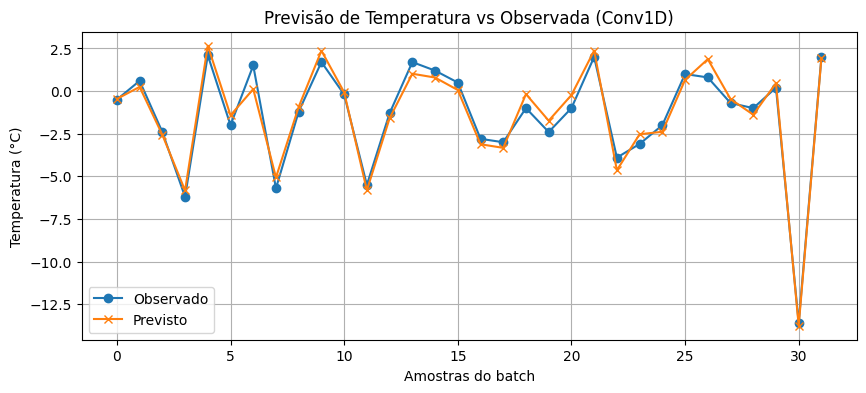

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Obter uma amostra do conjunto de teste
for inputs, labels in conv_window.test.take(1):
    predictions = conv_model(inputs)  # shape: (batch_size, 1, 1)

# Converter para 1D (batch_size,)
true = labels.numpy().squeeze()
pred = predictions.numpy().squeeze()

# Reverter normalização z-score da coluna 'Air_Temp'
true_orig = true * train_std['Air_Temp'] + train_mean['Air_Temp']
pred_orig = pred * train_std['Air_Temp'] + train_mean['Air_Temp']

# Plotar
plt.figure(figsize=(10, 4))
plt.plot(true_orig, label='Observado', marker='o')
plt.plot(pred_orig, label='Previsto', marker='x')
plt.legend()
plt.title('Previsão de Temperatura vs Observada (Conv1D)')
plt.xlabel('Amostras do batch')
plt.ylabel('Temperatura (°C)')
plt.grid(True)
plt.show()


The difference between this conv_model and the multi_step_dense model is that the conv_model can be run on inputs of any length. The convolutional layer is applied to a sliding window of inputs:

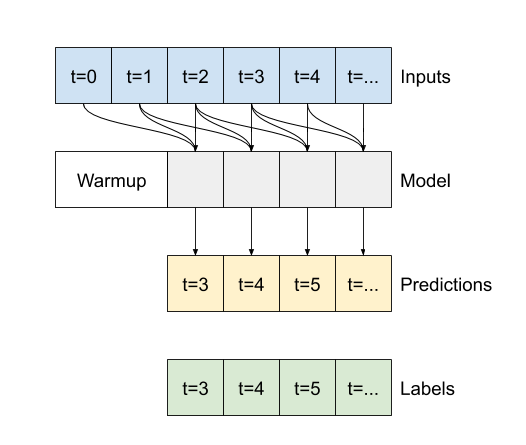

In [ ]:
print("Wide window")
print('Input shape:', wide_window.example[0].shape)
print('Labels shape:', wide_window.example[1].shape)
print('Output shape:', conv_model(wide_window.example[0]).shape)

Wide window
Input shape: (32, 24, 15)
Labels shape: (32, 24, 1)
Output shape: (32, 22, 1)


Observe que a saída é maior que a entrada. Para que o treinamento ou a plotagem funcionem, é necessário que os rótulos e a previsão tenham o mesmo comprimento. Portanto, crie um WindowGenerator para produzir janelas amplas com alguns passos de tempo de entrada extras para que os comprimentos dos rótulos e da previsão correspondam:

In [ ]:
LABEL_WIDTH = 12
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)
wide_conv_window = WindowGenerator(
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1,
    label_columns=['Air_Temp'])

wide_conv_window

Total window size: 15
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Label indices: [ 3  4  5  6  7  8  9 10 11 12 13 14]
Label column name(s): ['Air_Temp']

In [ ]:
print("Wide conv window")
print('Input shape:', wide_conv_window.example[0].shape)
print('Labels shape:', wide_conv_window.example[1].shape)
print('Output shape:', conv_model(wide_conv_window.example[0]).shape)

Wide conv window
Input shape: (32, 14, 15)
Labels shape: (32, 12, 1)
Output shape: (32, 12, 1)


In [ ]:
# wide_conv_window.plot(conv_model)

## Recurrent Neural Network (RNN) - LSTM - METAR com Temperatura - MSE

A Recurrent Neural Network (RNN) is a type of neural network well-suited to time series data. RNNs process a time series step-by-step, maintaining an internal state from time-step to time-step.

You can learn more in the Text generation with an RNN tutorial and the Recurrent Neural Networks (RNN) with Keras guide.

In this tutorial, you will use an RNN layer called Long Short-Term Memory (tf.keras.layers.LSTM).

An important constructor argument for all Keras RNN layers, such as tf.keras.layers.LSTM, is the return_sequences argument. This setting can configure the layer in one of two ways:

* **If False**, the default, the layer only returns the output of the final time step, giving the model time to warm up its internal state before making a single prediction:

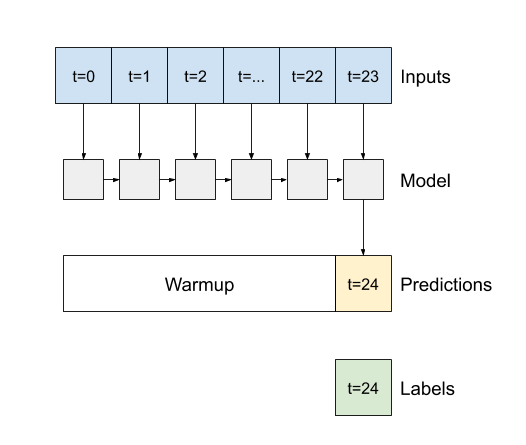

*** the layer returns** an output for each input. This is useful for:
Stacking RNN layers.
Training a model on multiple time steps simultaneously.

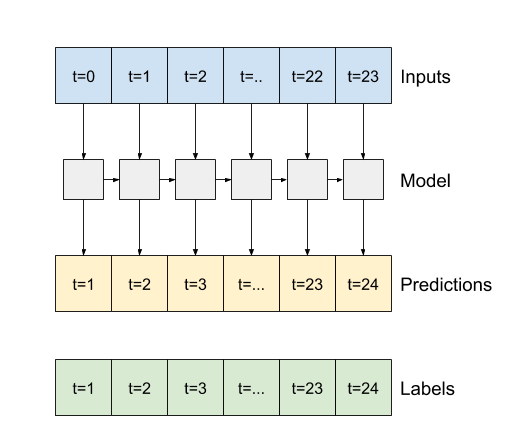

In [ ]:
modelo = 'LSTM'

wide_window = WindowGenerator(
    input_width=48, label_width=12, shift=1,
    label_columns=['Air_Temp'])

wide_window

if modo_execucao == 'Treinamento':
  LSTM_fit_start = time.time()
  lstm_model = tf.keras.models.Sequential([
      # Shape [batch, time, features] => [batch, time, lstm_units]
      tf.keras.layers.LSTM(32, return_sequences=False),
      # Shape => [batch, time, features]
      tf.keras.layers.Dense(units=12),
      tf.keras.layers.Reshape([12, 1])
  ])

  print('Input shape:', wide_window.example[0].shape)
  print('Output shape:', lstm_model(wide_window.example[0]).shape)

  history = compile_and_fit(lstm_model, wide_window, model_name='LSTM')
  LSTM_fit_end = time.time()
  LSTM_fit_elapsed = LSTM_fit_end - LSTM_fit_start
  tempos_treinamento[modelo] = LSTM_fit_elapsed
else:
  # ATENÇÃO! Aqui estou carregando um modelo já treinado, pois estamos em modo de 'Visualização'
  # O tempo será divergente no caso de comparação com modo 'Treinamento'.
  lstm_model = tf.keras.models.load_model(f"{lista_modelos['LSTM']}")

#IPython.display.clear_output()

LSTM_val_start = time.time()
val_performance['LSTM-48Inp-12Out'] = lstm_model.evaluate(wide_window.val, return_dict=True)
LSTM_val_end = time.time()
LSTM_val_elapsed = LSTM_val_end - LSTM_val_start
tempos_validacao[modelo] = LSTM_val_elapsed

LSTM_test_start = time.time()
performance['LSTM-48Inp-12Out'] = lstm_model.evaluate(wide_window.test, verbose=0, return_dict=True)
LSTM_test_end = time.time()
LSTM_test_elapsed = LSTM_test_end - LSTM_test_start
tempos_teste[modelo] = LSTM_test_elapsed

Input shape: (32, 48, 15)
Output shape: (32, 12, 1)
AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 38s 16ms/step - loss: 0.1399 - mean_absolute_error: 0.2187 - mean_absolute_percentage_error: 158.5465 - mean_squared_error: 0.1399 - root_mean_squared_error: 0.3472 - val_loss: 0.0172 - val_mean_absolute_error: 0.0913 - val_mean_absolute_percentage_error: 76.7176 - val_mean_squared_error: 0.0172 - val_root_mean_squared_error: 0.1312
Epoch 2/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 43s 17ms/step - loss: 0.0172 - mean_absolute_error: 0.0852 - mean_absolute_percentage_error: 72.6424 - mean_squared_error: 0.0172 - root_mean_squared_error: 0.1310 - val_loss: 0.0138 - val_mean_absolute_error: 0.0789 - val_mean_absolute_percentage_error: 64.0131 - val_mean_squared_error: 0.0138 - val_root_mean_squared_error: 0.1174
Epoch 3/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 43s 18ms/step - loss: 0.0121 - mean_absolute_error: 0.0706 - mean_absolute_pe

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  lstm_model.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: LSTM
Tempo de treinamento: 900.9815862178802 s
Tempo de validação: 10.313157320022583 s
Tempo de teste/inferência: 2.6392219066619873 s


In [ ]:
# wide_window.plot(lstm_model)

In [ ]:
# wide_window.plot(model={
#     'Linear': linear,
#     'LSTM': lstm_model
# }, plot_col='Air_Temp', max_subplots=2)

In [ ]:
cm = lstm_model.metrics[1]
cm.metrics

val_performance

{'Baseline': {'loss': 0.03618698567152023,
  'mean_absolute_error': 0.11897335201501846},
 'Linear': {'loss': 0.03476529195904732,
  'mean_absolute_error': 0.12222611159086227,
  'mean_absolute_percentage_error': 105.79878234863281,
  'mean_squared_error': 0.03476529195904732,
  'root_mean_squared_error': 0.18645453453063965},
 'Dense': {'loss': 0.042422354221343994,
  'mean_absolute_error': 0.1385709047317505,
  'mean_absolute_percentage_error': 116.83995819091797,
  'mean_squared_error': 0.03775694593787193,
  'root_mean_squared_error': 0.1943114697933197},
 'Multi Step dense': {'loss': 0.03403487056493759,
  'mean_absolute_error': 0.12620657682418823,
  'mean_absolute_percentage_error': 111.04414367675781,
  'mean_squared_error': 0.03403487056493759,
  'root_mean_squared_error': 0.18448542058467865},
 'Multi-Step-Dense-24input': {'loss': 0.03448778763413429,
  'mean_absolute_error': 0.13031835854053497,
  'mean_absolute_percentage_error': 115.79562377929688,
  'mean_squared_error': 

In [ ]:
# x = np.arange(len(performance))
# width = 0.3
metric_name = 'mean_absolute_error'
# val_mae = [v[metric_name] for v in val_performance.values()]
# test_mae = [v[metric_name] for v in performance.values()]

# plt.ylabel('MAE - Mean_Absolute_Error [Temperatura (degC), normalizado]')
# plt.bar(x - 0.17, val_mae, width, label='Validação')
# plt.bar(x + 0.17, test_mae, width, label='Teste')
# plt.xticks(ticks=x, labels=performance.keys(),
#            rotation=90)
# _ = plt.legend()

for name, value in performance.items():
  print(f'{name:12s}: {value[metric_name]:0.4f}')

Baseline    : 0.1068
Linear      : 0.1153
Dense       : 0.1373
Multi Step dense: 0.1270
Multi-Step-Dense-24input: 0.1409
CNN-3Inp-12Out: 0.1251
LSTM-48Inp-12Out: 0.0233


Avaliação do gráfico:
Baseline	MAEval=~0.10	MAEtest=~0.117	Muito forte! O modelo que apenas repete a última temperatura já é bom.

Linear	~0.105	~0.121	Levemente melhor que o Baseline no Val, igual ou um pouco pior no Teste.

Dense	~0.11	~0.118	Não superou o Linear, possivelmente subajuste ou ruído.

Multi-step Dense	~0.108	~0.120	Similar ao Dense.

Conv	~0.11	~0.120	Também não ganhou vantagem, talvez porque a estrutura temporal é simples.

LSTM	~0.105	~0.122	Leve overfitting, mas desempenho similar ao Linear.


Baseline já é muito forte, então superar ele é difícil — especialmente se a temperatura varia pouco de um passo para o outro (ex: hora a hora ou 3h em 3h).

Modelos mais complexos não trouxeram ganho claro — isso pode indicar que:

As janelas são curtas (pouca informação sequencial);
Os dados são limpos e suaves;
O target tem pouca variabilidade.
Seu Linear model está praticamente no mesmo nível dos outros, o que é um ótimo sinal de que seu pipeline de predição está funcionando bem — e que a tarefa em si pode não precisar de redes profundas.

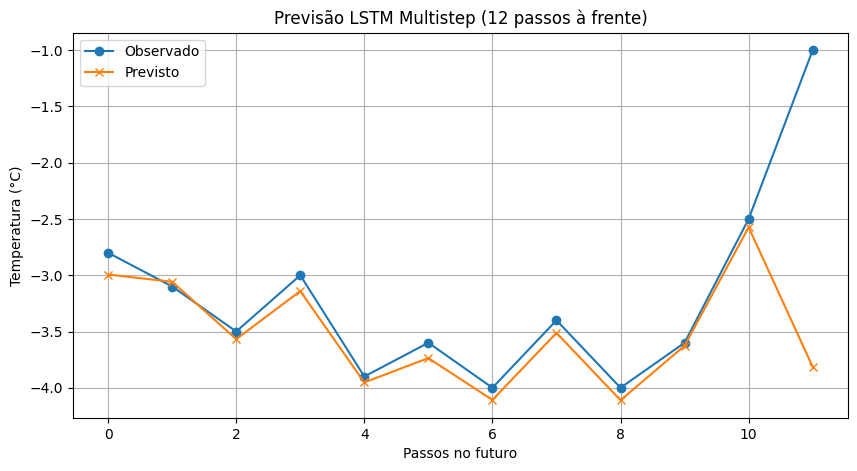

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Obter um batch do conjunto de teste
for inputs, labels in wide_window.test.take(1):
    predictions = lstm_model(inputs)

# true e pred têm shape (batch_size, 12, 1)
# Selecionar a primeira amostra do batch para plotar
true = labels[0].numpy().squeeze()       # shape (12,)
pred = predictions[0].numpy().squeeze()  # shape (12,)

# Reverter normalização z-score para a coluna 'Air_Temp'
true_orig = true * train_std['Air_Temp'] + train_mean['Air_Temp']
pred_orig = pred * train_std['Air_Temp'] + train_mean['Air_Temp']

# Plot dos 12 passos à frente
plt.figure(figsize=(10, 5))
plt.plot(true_orig, label='Observado', marker='o')
plt.plot(pred_orig, label='Previsto', marker='x')
plt.title('Previsão LSTM Multistep (12 passos à frente)')
plt.xlabel('Passos no futuro')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()

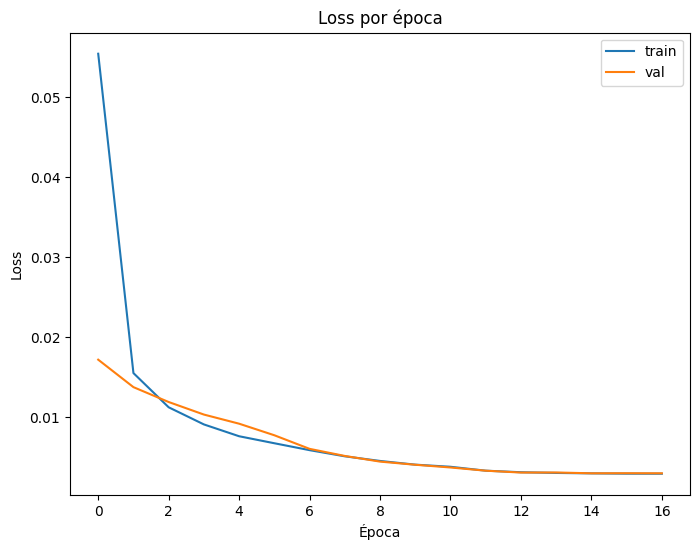

In [ ]:
if modo_execucao == 'Treinamento':
  plt.plot(history.history['loss'], label='train')
  plt.plot(history.history['val_loss'], label='val')
  plt.legend()
  plt.title('Loss por época')
  plt.xlabel('Época')
  plt.ylabel('Loss')
  plt.show()

Multi-output models
The models so far all predicted a single output feature, T (degC), for a single time step.

All of these models can be converted to predict multiple features just by changing the number of units in the output layer and adjusting the training windows to include all features in the labels (example_labels):

In [ ]:
# single_step_window = WindowGenerator(
#     # `WindowGenerator` returns all features as labels if you
#     # don't set the `label_columns` argument.
#     input_width=1, label_width=1, shift=1)

# wide_window = WindowGenerator(input_width=24, label_width=24, shift=1)

# for example_inputs, example_labels in wide_window.train.take(1):
#   print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
#   print(f'Labels shape (batch, time, features): {example_labels.shape}')

In [ ]:
# plot_combined_metrics()  # Todas as métricas disponíveis

In [ ]:
# def plot_combined_metrics(time_based=True, figsize=(15, 12)):
#     """Plota métricas comparativas para todos os modelos monitorados com distinção máxima.

#     Args:
#         time_based (bool): Se True, eixo X como tempo; False para épocas
#         figsize (tuple): Tamanho da figura
#     """
#     if not monitors:
#         print("Nenhum modelo monitorado encontrado.")
#         return

#     # Configuração de cores únicas por modelo (usando colormap 'tab20' para maior distinção)
#     model_colors = plt.cm.get_cmap('tab20')(np.linspace(0, 1, len(monitors)))

#     # Configuração de marcadores por métrica para fácil identificação
#     marker_styles = {
#         'cpu_usage': 'o',
#         'ram_usage': 's',
#         'gpu_util': '^',
#         'gpu_mem_usage': 'D'
#     }

#     # Linestyles por tipo de métrica
#     line_styles = {
#         'cpu_usage': '-',
#         'ram_usage': '--',
#         'gpu_util': '-.',
#         'gpu_mem_usage': ':'
#     }

#     fig, axs = plt.subplots(2, 2, figsize=figsize)
#     plt.suptitle('Monitoramento Comparativo de Recursos', fontsize=16, y=1.02)

#     metrics_config = [
#         ('cpu_usage', 'CPU Utilization (%)'),
#         ('ram_usage', 'RAM Usage (GB)'),
#         ('gpu_util', 'GPU T4 Utilization (%)'),
#         ('gpu_mem_usage', 'GPU T4 Memory (MB)')
#     ]

#     # Primeiro plota todos os dados
#     for ax, (metric, title) in zip(axs.flat, metrics_config):
#         for i, monitor in enumerate(monitors):
#             if metric not in monitor.metrics or not monitor.metrics[metric]:
#                 continue

#             x_values = monitor.metrics['timestamps'] if time_based else monitor.metrics['epochs']
#             y_values = monitor.metrics[metric]

#             ax.plot(x_values, y_values,
#                     color=model_colors[i],
#                     linestyle=line_styles[metric],
#                     marker=marker_styles[metric],
#                     markersize=6 if len(x_values) < 20 else 4,
#                     linewidth=2,
#                     label=f'{monitor.model_name} ({metric.split("_")[0].upper()})',
#                     alpha=0.8)

#         ax.set_title(title, fontsize=12, pad=10)
#         ax.set_xlabel('Time (s)' if time_based else 'Epoch', fontsize=10)
#         ax.grid(True, linestyle=':', alpha=0.5)

#         # Ajusta escala para métricas percentuais
#         if '%' in title:
#             ax.set_ylim(0, 105)

#         # Adiciona legenda dentro de cada subplot
#         ax.legend(fontsize=8, framealpha=1)

#     plt.tight_layout()

#     # Adiciona uma legenda global explicando os marcadores
#     extra = plt.figlegend(
#         handles=[
#             plt.Line2D([0], [0], marker=marker_styles[m], color='black',
#                       label=m.replace('_', ' ').title(), linestyle='None')
#             for m in marker_styles
#         ],
#         loc='upper center',
#         ncol=4,
#         bbox_to_anchor=(0.5, 1.01),
#         frameon=False,
#         title='Metric Types'
#     )

#     plt.subplots_adjust(top=0.88)
#     plt.show()


In [ ]:
# # Chamada simples (plotará todos os modelos monitorados)
# plot_combined_metrics()

# # Para versão por épocas
# plot_combined_metrics(time_based=False)

In [ ]:
# def plot_grouped_metrics(time_based=False, figsize=(16, 10)):
#     """Plota métricas comparativas com gráficos de barras agrupadas para % e linhas para memória.

#     Args:
#         time_based (bool): Se True, agrupa por tempo; se False, por épocas
#         figsize (tuple): Tamanho da figura
#     """
#     if not monitors:
#         print("Nenhum modelo monitorado encontrado.")
#         return

#     # Configuração de cores por modelo
#     model_colors = plt.colormaps.get_cmap('tab10')(np.linspace(0, 1, len(monitors)))

#     # Criar figura com subplots
#     fig, axs = plt.subplots(2, 2, figsize=figsize)
#     ax1, ax2, ax3, ax4 = axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1]

#     plt.subplots_adjust(hspace=0.3, wspace=0.25)
#     fig.suptitle('Monitoramento Comparativo de Recursos', fontsize=16, y=1.02)

#     # Verifica e sincroniza os pontos de coleta de dados
#     x_values_list = [m.metrics['timestamps' if time_based else 'epochs'] for m in monitors]
#     min_length = min(len(x) for x in x_values_list)
#     x_values = monitors[0].metrics['timestamps' if time_based else 'epochs'][:min_length]

#     # 1. Gráfico de barras agrupadas para CPU e GPU (%)
#     width = 0.35
#     x = np.arange(min_length)

#     for i, model in enumerate(monitors):
#         cpu_data = model.metrics['cpu_usage'][:min_length]
#         gpu_data = (model.metrics['gpu_util'][:min_length] if model.gpu_available
#                    else np.zeros(min_length))

#         ax1.bar(x - width/2 + i*(width/len(monitors)), cpu_data, width/len(monitors),
#                 label=f'{model.model_name} CPU', color=model_colors[i], alpha=0.7)

#         ax1.bar(x + width/2 + i*(width/len(monitors)), gpu_data, width/len(monitors),
#                 label=f'{model.model_name} GPU', color=model_colors[i], alpha=0.4, hatch='//')

#     ax1.set_title('Utilização em % - CPU vs GPU')
#     ax1.set_xlabel('Intervalos de Tempo (s)' if time_based else 'Época')
#     ax1.set_ylabel('Utilização (%)')
#     ax1.set_xticks(x)
#     ax1.set_xticklabels([f'{int(t)}' for t in x_values], rotation=45)
#     ax1.set_ylim(0, 100)
#     ax1.grid(True, linestyle=':', alpha=0.5)
#     ax1.legend(loc='upper right', fontsize=8)

#     # 2. Gráfico de linha para RAM
#     for i, model in enumerate(monitors):
#         ax2.plot(x_values, model.metrics['ram_usage'][:min_length],
#                 color=model_colors[i], linewidth=2, marker='o',
#                 label=f'{model.model_name} RAM')

#     ax2.set_title('Uso de RAM')
#     ax2.set_xlabel('Intervalos de Tempo (s)' if time_based else 'Época')
#     ax2.set_ylabel('GB')
#     ax2.grid(True, linestyle=':', alpha=0.5)
#     ax2.legend()

#     # 3. Gráfico de linha para GPU Memory (se disponível)
#     gpu_exists = any(m.gpu_available for m in monitors)
#     for i, model in enumerate(monitors):
#         if model.gpu_available:
#             ax3.plot(x_values, model.metrics['gpu_mem_usage'][:min_length],
#                     color=model_colors[i], linewidth=2, marker='s',
#                     label=f'{model.model_name} GPU Mem')

#     ax3.set_title('Uso de Memória GPU' if gpu_exists else '(Não disponível)')
#     ax3.set_xlabel('Intervalos de Tempo (s)' if time_based else 'Época')
#     ax3.set_ylabel('MB' if gpu_exists else '')
#     ax3.grid(True, linestyle=':', alpha=0.5)

#     # 4. Gráfico adicional opcional
#     ax4.axis('off')

#     # Adicionar legenda única
#     handles = [plt.Rectangle((0,0),1,1, color=model_colors[i])
#               for i in range(len(monitors))]
#     ax4.legend(handles, [m.model_name for m in monitors],
#               title="Modelos", loc='center', frameon=False)

#     plt.tight_layout()
#     plt.show()


In [ ]:
# plot_grouped_metrics()  # Para visualização por épocas
# plot_grouped_metrics(time_based=True)  # Para visualização por tempo

In [ ]:
# def plot_all_bar_metrics(time_based=False, figsize=(18, 12)):
#     """Plota todas as métricas em gráficos de barras agrupadas.

#     Args:
#         time_based (bool): Se True, agrupa por tempo; se False, por épocas
#         figsize (tuple): Tamanho da figura
#     """
#     if not monitors:
#         print("Nenhum modelo monitorado encontrado.")
#         return

#     # Configuração de cores por modelo
#     model_colors = plt.colormaps.get_cmap('tab10')(np.linspace(0, 1, len(monitors)))

#     # Criar figura com subplots
#     fig, axs = plt.subplots(2, 2, figsize=figsize)
#     ax1, ax2, ax3, ax4 = axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1]

#     plt.subplots_adjust(hspace=0.4, wspace=0.3)
#     fig.suptitle('Monitoramento Comparativo de Recursos (Todos em Barras)', fontsize=16, y=1.02)

#     # Sincroniza os pontos de coleta
#     x_values_list = [m.metrics['timestamps' if time_based else 'epochs'] for m in monitors]
#     min_length = min(len(x) for x in x_values_list) if x_values_list else 0
#     x_values = monitors[0].metrics['timestamps' if time_based else 'epochs'][:min_length] if monitors else []

#     if not x_values:
#         print("Nenhum dado disponível para plotagem.")
#         return

#     # Configurações comuns
#     width = 0.8 / len(monitors)  # Largura dinâmica baseada no número de modelos
#     x = np.arange(min_length)
#     x_label = 'Intervalos de Tempo (s)' if time_based else 'Época'

#     # 1. Utilização da CPU (%)
#     for i, model in enumerate(monitors):
#         ax1.bar(x + i*width, model.metrics['cpu_usage'][:min_length], width,
#                 color=model_colors[i], alpha=0.7, label=model.model_name)

#     ax1.set_title('Utilização da CPU (%)')
#     ax1.set_xlabel(x_label)
#     ax1.set_ylabel('Utilização (%)')
#     ax1.set_xticks(x + width*(len(monitors)-1)/2)
#     ax1.set_xticklabels([f'{int(t)}' for t in x_values], rotation=45)
#     ax1.set_ylim(0, 100)
#     ax1.grid(True, axis='y', linestyle=':', alpha=0.5)
#     ax1.legend()

#     # 2. Utilização da GPU (%)
#     for i, model in enumerate(monitors):
#         if model.gpu_available:
#             ax2.bar(x + i*width, model.metrics['gpu_util'][:min_length], width,
#                     color=model_colors[i], alpha=0.7, label=model.model_name)

#     ax2.set_title('Utilização da GPU (%)' if any(m.gpu_available for m in monitors) else 'GPU Não Disponível')
#     ax2.set_xlabel(x_label)
#     ax2.set_ylabel('Utilização (%)')
#     ax2.set_xticks(x + width*(len(monitors)-1)/2)
#     ax2.set_xticklabels([f'{int(t)}' for t in x_values], rotation=45)
#     ax2.set_ylim(0, 100)
#     ax2.grid(True, axis='y', linestyle=':', alpha=0.5)
#     ax2.legend()

#     # 3. Uso de RAM (GB)
#     for i, model in enumerate(monitors):
#         ax3.bar(x + i*width, model.metrics['ram_usage'][:min_length], width,
#                 color=model_colors[i], alpha=0.7, label=model.model_name)

#     ax3.set_title('Uso de Memória RAM (GB)')
#     ax3.set_xlabel(x_label)
#     ax3.set_ylabel('GB')
#     ax3.set_xticks(x + width*(len(monitors)-1)/2)
#     ax3.set_xticklabels([f'{int(t)}' for t in x_values], rotation=45)
#     ax3.grid(True, axis='y', linestyle=':', alpha=0.5)
#     ax3.legend()

#     # 4. Uso de Memória GPU (MB)
#     for i, model in enumerate(monitors):
#         if model.gpu_available:
#             ax4.bar(x + i*width, model.metrics['gpu_mem_usage'][:min_length], width,
#                     color=model_colors[i], alpha=0.7, label=model.model_name)

#     ax4.set_title('Uso de Memória GPU (MB)' if any(m.gpu_available for m in monitors) else 'GPU Não Disponível')
#     ax4.set_xlabel(x_label)
#     ax4.set_ylabel('MB' if any(m.gpu_available for m in monitors) else '')
#     ax4.set_xticks(x + width*(len(monitors)-1)/2)
#     ax4.set_xticklabels([f'{int(t)}' for t in x_values], rotation=45)
#     ax4.grid(True, axis='y', linestyle=':', alpha=0.5)
#     ax4.legend()

#     plt.tight_layout()
#     plt.show()


In [ ]:
# plot_all_bar_metrics()  # Para visualização por épocas
# plot_all_bar_metrics(time_based=True)  # Para visualização por tempo

In [ ]:
def plot_metrics_by_model(figsize=(14, 8)):
    """Plota métricas agrupadas por modelo, com todas as métricas lado a lado para cada modelo."""
    if not monitors:
        print("Nenhum modelo monitorado encontrado.")
        return

    # Configuração de cores por métrica
    metric_colors = {
        'cpu_usage': '#1f77b4',
        'gpu_util': '#ff7f0e',
        'ram_usage': '#2ca02c',
        'gpu_mem_usage': '#d62728'
    }

    # Preparar dados
    model_names = [m.model_name for m in monitors]
    metrics = ['cpu_usage', 'gpu_util', 'ram_usage', 'gpu_mem_usage']
    metric_labels = ['CPU (%)', 'GPU (%)', 'RAM (GB)', 'GPU Mem (MB)']

    # Calcular médias para cada modelo e métrica
    data = {}
    for metric in metrics:
        data[metric] = [np.mean(m.metrics[metric]) if m.metrics[metric] and (metric != 'gpu_util' or m.gpu_available) else 0
                        for m in monitors]

    # Configurar figura
    fig, ax = plt.subplots(figsize=figsize)

    # Posicionamento das barras
    x = np.arange(len(model_names))  # Localização dos grupos
    width = 0.2  # Largura das barras
    offsets = np.linspace(-width*1.5, width*1.5, len(metrics))

    # Plotar barras para cada métrica
    for i, (metric, label) in enumerate(zip(metrics, metric_labels)):
        # Verificar se a métrica existe para algum modelo
        if any(data[metric]):
            ax.bar(x + offsets[i], data[metric], width,
                   label=label, color=metric_colors[metric],
                   edgecolor='white', linewidth=0.5)

    # Configurações do gráfico
    ax.set_title('Métricas de Desempenho por Modelo', pad=20)
    ax.set_xlabel('Modelos')
    ax.set_ylabel('Valores')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names)
    ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)

    # Ajustar limites
    ax.set_ylim(0, max(max(vals) for vals in data.values()) * 1.2)

    plt.tight_layout()
    plt.show()


In [ ]:
#plot_metrics_by_model()

In [ ]:
# def plot_metrics_by_model(figsize=(14, 8)):
#     """Plota métricas agrupadas por modelo com todas as unidades em MB."""
#     if not monitors:
#         print("Nenhum modelo monitorado encontrado.")
#         return

#     # Configuração de cores por métrica
#     metric_colors = {
#         'cpu_usage': '#1f77b4',
#         'gpu_util': '#ff7f0e',
#         'ram_usage': '#2ca02c',
#         'gpu_mem_usage': '#d62728'
#     }

#     # Preparar dados - converter tudo para MB
#     model_names = [m.model_name for m in monitors]
#     metrics = ['cpu_usage', 'gpu_util', 'ram_usage', 'gpu_mem_usage']
#     metric_labels = ['CPU (%)', 'GPU (%)', 'RAM (MB)', 'GPU Mem (MB)']

#     # Calcular médias para cada modelo e métrica
#     data = {}
#     for metric in metrics:
#         if metric == 'ram_usage':  # Converter GB para MB
#             data[metric] = [np.mean(m.metrics[metric])*1024 if m.metrics[metric] else 0
#                            for m in monitors]
#         elif metric in ['cpu_usage', 'gpu_util']:  # Manter porcentagens
#             data[metric] = [np.mean(m.metrics[metric]) if m.metrics[metric] and (metric != 'gpu_util' or m.gpu_available) else 0
#                            for m in monitors]
#         else:  # GPU Mem já está em MB
#             data[metric] = [np.mean(m.metrics[metric]) if m.metrics[metric] and m.gpu_available else 0
#                            for m in monitors]

#     # Configurar figura com eixos duais
#     fig, ax1 = plt.subplots(figsize=figsize)
#     ax2 = ax1.twinx()

#     # Posicionamento das barras
#     x = np.arange(len(model_names))
#     width = 0.2
#     offsets = np.linspace(-width*1.5, width*1.5, len(metrics))

#     # Plotar barras para métricas de porcentagem (CPU, GPU)
#     for i, metric in enumerate(['cpu_usage', 'gpu_util']):
#         if any(data[metric]):
#             ax1.bar(x + offsets[i], data[metric], width,
#                     label=metric_labels[i], color=metric_colors[metric],
#                     edgecolor='white', linewidth=0.5)

#     # Plotar barras para métricas de MB (RAM, GPU Mem)
#     for i, metric in enumerate(['ram_usage', 'gpu_mem_usage'], 2):
#         if any(data[metric]):
#             ax2.bar(x + offsets[i], data[metric], width,
#                     label=metric_labels[i], color=metric_colors[metric],
#                     edgecolor='white', linewidth=0.5, alpha=0.7)

#     # Configurações do eixo de porcentagem
#     ax1.set_ylabel('Porcentagem (%)', color='#1f77b4')
#     ax1.tick_params(axis='y', colors='#1f77b4')
#     ax1.set_ylim(0, 100)

#     # Configurações do eixo de MB
#     ax2.set_ylabel('Megabytes (MB)', color='#2ca02c')
#     ax2.tick_params(axis='y', colors='#2ca02c')

#     # Configurações comuns
#     ax1.set_title('Métricas de Desempenho por Modelo', pad=20)
#     ax1.set_xlabel('Modelos')
#     ax1.set_xticks(x)
#     ax1.set_xticklabels(model_names)


In [ ]:
# plot_metrics_by_model()

In [ ]:
# def plot_metrics_by_model(figsize=(14, 8)):
#     """Plota métricas agrupadas por modelo com eixos duais e legendas aprimoradas."""
#     if not monitors:
#         print("Nenhum modelo monitorado encontrado.")
#         return

#     # Configuração de cores e estilos
#     metric_styles = {
#         'cpu_usage': {'color': '#1f77b4', 'label': 'CPU Usage (%)', 'hatch': ''},
#         'gpu_util': {'color': '#ff7f0e', 'label': 'GPU Util (%)', 'hatch': '//'},
#         'ram_usage': {'color': '#2ca02c', 'label': 'RAM (MB)', 'hatch': 'xx'},
#         'gpu_mem_usage': {'color': '#d62728', 'label': 'GPU Mem (MB)', 'hatch': '..'}
#     }

#     # Preparar dados - converter RAM para MB
#     model_names = [m.model_name for m in monitors]
#     metrics = ['cpu_usage', 'gpu_util', 'ram_usage', 'gpu_mem_usage']

#     data = {}
#     for metric in metrics:
#         if metric == 'ram_usage':  # Converter GB para MB
#             data[metric] = [np.mean(m.metrics[metric])*1024 if m.metrics[metric] else 0
#                           for m in monitors]
#         elif metric in ['cpu_usage', 'gpu_util']:  # Manter porcentagens
#             data[metric] = [np.mean(m.metrics[metric]) if m.metrics[metric] and
#                            (metric != 'gpu_util' or m.gpu_available) else 0
#                           for m in monitors]
#         else:  # GPU Mem já está em MB
#             data[metric] = [np.mean(m.metrics[metric]) if m.metrics[metric] and
#                            m.gpu_available else 0
#                           for m in monitors]

#     # Configurar figura com eixos duais
#     fig, ax1 = plt.subplots(figsize=figsize)
#     ax2 = ax1.twinx()

#     # Posicionamento das barras
#     x = np.arange(len(model_names))
#     width = 0.18
#     offsets = np.linspace(-width*1.5, width*1.5, len(metrics))

#     # Função auxiliar para plotar barras
#     def plot_bars(ax, metric, offset_idx, alpha=1.0):
#         style = metric_styles[metric]
#         ax.bar(x + offsets[offset_idx], data[metric], width,
#                color=style['color'], label=style['label'],
#                edgecolor='black', linewidth=0.5, alpha=alpha,
#                hatch=style['hatch'])

#     # Plotar métricas de porcentagem (CPU, GPU)
#     plot_bars(ax1, 'cpu_usage', 0)
#     plot_bars(ax1, 'gpu_util', 1)

#     # Plotar métricas de MB (RAM, GPU Mem)
#     plot_bars(ax2, 'ram_usage', 2, alpha=0.8)
#     plot_bars(ax2, 'gpu_mem_usage', 3, alpha=0.8)

#     # Configurar eixos e estilos
#     ax1.set_ylabel('Porcentagem (%)', fontsize=12, color='#1f77b4')
#     ax1.tick_params(axis='y', colors='#1f77b4')
#     ax1.set_ylim(0, 100)

#     ax2.set_ylabel('Uso de Memória (MB)', fontsize=12, color='#2ca02c')
#     ax2.tick_params(axis='y', colors='#2ca02c')
#     ax2.set_ylim(0, max(max(data['ram_usage']), max(data['gpu_mem_usage'])) * 1.2)

#     # Configurações comuns
#     ax1.set_title('Métricas de Desempenho por Modelo', pad=20, fontsize=14)
#     ax1.set_xlabel('Modelos', fontsize=12)
#     ax1.set_xticks(x)
#     ax1.set_xticklabels(model_names, rotation=45 if len(model_names) > 3 else 0)
#     ax1.grid(True, axis='y', linestyle=':', alpha=0.5)

#     # Legendas unificadas
#     lines1, labels1 = ax1.get_legend_handles_labels()
#     lines2, labels2 = ax2.get_legend_handles_labels()

#     # Posicionar legenda fora à direita
#     fig.legend(lines1 + lines2, labels1 + labels2,
#                loc='center right', bbox_to_anchor=(1.25, 0.5),
#                frameon=True, framealpha=1, shadow=True,
#                title='Métricas', title_fontsize='12')

#     plt.tight_layout(rect=[0, 0, 0.85, 1])  # Ajustar para a legenda
#     plt.show()

In [ ]:
#plot_metrics_by_model()

## Recurrent Neural Network (RNN) - BiLSTM - METAR com Temperatura - MSE

In [ ]:
import time
import tensorflow as tf

modelo = 'BiLSTM'

# Parâmetros
input_width = 48    # Entradas
label_width = 12    # Saídas (horizonte de previsão)
shift = 1           # Deslocamento

# Instancie sua janela
wide_window = WindowGenerator(
    input_width=input_width, label_width=label_width, shift=shift,
    label_columns=['Air_Temp']
)

if modo_execucao == 'Treinamento':
  # Modelo BiLSTM
  BiLSTM_fit_start = time.time()
  bilstm_model = tf.keras.models.Sequential([
      # Bidirectional LSTM
      tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=False)),
      # Densa para saída
      tf.keras.layers.Dense(units=label_width),
      tf.keras.layers.Reshape([label_width, 1])
  ])

  print('Input shape:', wide_window.example[0].shape)
  print('Output shape:', bilstm_model(wide_window.example[0]).shape)

  history = compile_and_fit(bilstm_model, wide_window, model_name='BiLSTM')
  BiLSTM_fit_end = time.time()
  BiLSTM_fit_elapsed = BiLSTM_fit_end - BiLSTM_fit_start
  tempos_treinamento[modelo] = BiLSTM_fit_elapsed
else:
  bilstm_model = tf.keras.models.load_model(f"{lista_modelos['BiLSTM']}")

# Validação e teste

tempo_inicio_validacao = time.time()
val_performance['BiLSTM-48Inp-12Out'] = bilstm_model.evaluate(wide_window.val, return_dict=True)
tempo_fim_validacao = time.time()
duracao_validacao = tempo_fim_validacao - tempo_inicio_validacao
tempos_validacao[modelo] = duracao_validacao

BiLSTM_test_start = time.time()
performance['BiLSTM-48Inp-12Out'] = bilstm_model.evaluate(wide_window.test, verbose=0, return_dict=True)
end_time = time.time()
execution_time = end_time - BiLSTM_test_start
tempos_teste[modelo] = execution_time

print(f"Tempo de execução do BiLSTM: {execution_time:.2f} segundos")

Input shape: (32, 48, 15)
Output shape: (32, 12, 1)
AVISO: Monitoramento de GPU desativado. Erro: NVML Shared Library Not Found
Epoch 1/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 66s 27ms/step - loss: 0.1413 - mean_absolute_error: 0.2242 - mean_absolute_percentage_error: 170.2020 - mean_squared_error: 0.1413 - root_mean_squared_error: 0.3489 - val_loss: 0.0183 - val_mean_absolute_error: 0.0955 - val_mean_absolute_percentage_error: 80.7146 - val_mean_squared_error: 0.0183 - val_root_mean_squared_error: 0.1351
Epoch 2/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 62s 27ms/step - loss: 0.0165 - mean_absolute_error: 0.0837 - mean_absolute_percentage_error: 73.1684 - mean_squared_error: 0.0165 - root_mean_squared_error: 0.1284 - val_loss: 0.0133 - val_mean_absolute_error: 0.0776 - val_mean_absolute_percentage_error: 66.3632 - val_mean_squared_error: 0.0133 - val_root_mean_squared_error: 0.1153
Epoch 3/20
2336/2336 ━━━━━━━━━━━━━━━━━━━━ 59s 25ms/step - loss: 0.0113 - mean_absolute_error: 0.0681 - mean_absolute_pe

In [ ]:
datahora = datetime.datetime.now().strftime("%d-%m-%Y_%H%M%SZ")
if modo_execucao == 'Treinamento':
  bilstm_model.save(f"{modelo}_{datahora}.keras")
else:
  tempos_treinamento[modelo] = 'nao_treinado'

print(f"MODELO: {modelo}")
print(f"Tempo de treinamento: {tempos_treinamento[modelo]} s")
print(f"Tempo de validação: {tempos_validacao[modelo]} s")
print(f"Tempo de teste/inferência: {tempos_teste[modelo]} s")

MODELO: BiLSTM
Tempo de treinamento: 1215.6453886032104 s
Tempo de validação: 10.32146954536438 s
Tempo de teste/inferência: 5.185123443603516 s


In [ ]:
# wide_window.plot(bilstm_model)

In [ ]:
val_performance

{'Baseline': {'loss': 0.03618698567152023,
  'mean_absolute_error': 0.11897335201501846},
 'Linear': {'loss': 0.03476529195904732,
  'mean_absolute_error': 0.12222611159086227,
  'mean_absolute_percentage_error': 105.79878234863281,
  'mean_squared_error': 0.03476529195904732,
  'root_mean_squared_error': 0.18645453453063965},
 'Dense': {'loss': 0.042422354221343994,
  'mean_absolute_error': 0.1385709047317505,
  'mean_absolute_percentage_error': 116.83995819091797,
  'mean_squared_error': 0.03775694593787193,
  'root_mean_squared_error': 0.1943114697933197},
 'Multi Step dense': {'loss': 0.03403487056493759,
  'mean_absolute_error': 0.12620657682418823,
  'mean_absolute_percentage_error': 111.04414367675781,
  'mean_squared_error': 0.03403487056493759,
  'root_mean_squared_error': 0.18448542058467865},
 'Multi-Step-Dense-24input': {'loss': 0.03448778763413429,
  'mean_absolute_error': 0.13031835854053497,
  'mean_absolute_percentage_error': 115.79562377929688,
  'mean_squared_error': 

In [ ]:
performance

{'Baseline': {'loss': 0.03193588927388191,
  'mean_absolute_error': 0.10684745013713837},
 'Linear': {'loss': 0.031300537288188934,
  'mean_absolute_error': 0.11527419835329056,
  'mean_absolute_percentage_error': 70.73503875732422,
  'mean_squared_error': 0.031300537288188934,
  'root_mean_squared_error': 0.1769195795059204},
 'Dense': {'loss': 0.043569665402173996,
  'mean_absolute_error': 0.13733987510204315,
  'mean_absolute_percentage_error': 82.39884185791016,
  'mean_squared_error': 0.038904257118701935,
  'root_mean_squared_error': 0.1972416192293167},
 'Multi Step dense': {'loss': 0.034465495496988297,
  'mean_absolute_error': 0.12704595923423767,
  'mean_absolute_percentage_error': 85.54869842529297,
  'mean_squared_error': 0.034465495496988297,
  'root_mean_squared_error': 0.1856488436460495},
 'Multi-Step-Dense-24input': {'loss': 0.03990151733160019,
  'mean_absolute_error': 0.1409229338169098,
  'mean_absolute_percentage_error': 88.66252136230469,
  'mean_squared_error': 0

In [ ]:
#wide_window.plot(bilstm_model)

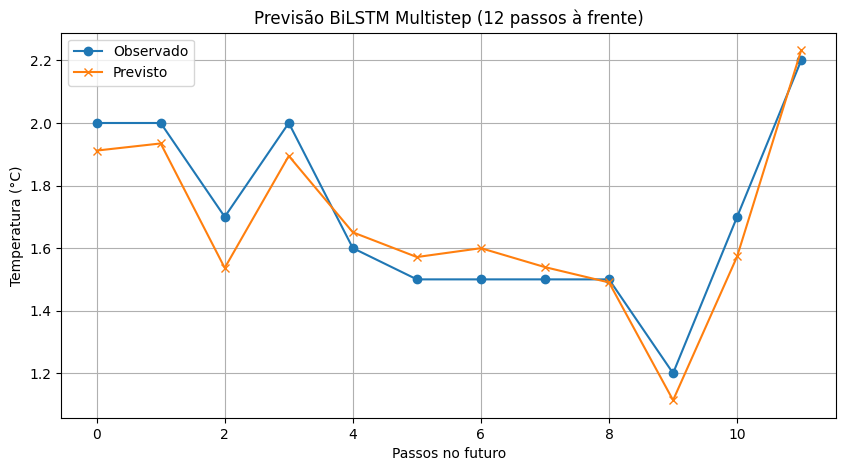

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Obter um batch do conjunto de teste
for inputs, labels in wide_window.test.take(1):
    predictions = bilstm_model(inputs)

# Selecionar a primeira amostra do batch para visualização
true = labels[0].numpy().squeeze()       # shape (12,)
pred = predictions[0].numpy().squeeze()  # shape (12,)

# Reverter normalização z-score para 'Air_Temp'
true_orig = true * train_std['Air_Temp'] + train_mean['Air_Temp']
pred_orig = pred * train_std['Air_Temp'] + train_mean['Air_Temp']

# Plotar os 12 passos à frente
plt.figure(figsize=(10, 5))
plt.plot(true_orig, label='Observado', marker='o')
plt.plot(pred_orig, label='Previsto', marker='x')
plt.title('Previsão BiLSTM Multistep (12 passos à frente)')
plt.xlabel('Passos no futuro')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()


## Plotagem Previsto vs. Observado de todos os modelos

In [ ]:
modelos = {
    'BiLSTM': (bilstm_model, wide_window),
    'LSTM': (lstm_model, wide_window),
    'CNN': (conv_model, conv_window),
    'Dense': (dense, single_step_window),
    'MultiStepDense': (multi_step_dense, conv_window),
    'Linear': (linear, single_step_window),
    'Baseline': (baseline, wide_window)
}

In [ ]:
for nome, (model, window) in modelos.items():
    for x, y in window.test.take(1):
        print(f'{nome}: input shape = {x.shape}')

BiLSTM: input shape = (32, 48, 15)
LSTM: input shape = (32, 48, 15)
CNN: input shape = (32, 3, 15)
Dense: input shape = (32, 1, 15)
MultiStepDense: input shape = (32, 3, 15)
Linear: input shape = (32, 1, 15)
Baseline: input shape = (32, 48, 15)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

def moving_average(series, window=5):
    return series.rolling(window=window, min_periods=1, center=True).mean()

def get_y_true_from_window(window, flatten=True):
    y_true_batches = []
    for x, y in window.test:
        y_true_batches.append(y.numpy())
    y_true = np.concatenate(y_true_batches, axis=0)
    if flatten:
        if len(y_true.shape) > 1:
            y_true = y_true.reshape(-1)
    return y_true

def get_pred_from_model_and_window(model, window):
    preds_batches = []

    is_baseline = not hasattr(model, "input_shape")

    for x, y in window.test:
        if is_baseline:
            preds = model(x).numpy()
            # Achata da mesma forma que y_true, para garantir alinhamento
            preds = preds.reshape(-1)
        else:
            batch_size = tf.shape(x)[0]
            input_shape = model.input_shape
            if isinstance(input_shape, list):
                input_shape = input_shape[0]

            if len(input_shape) == 2:
                x_flat = tf.reshape(x, [batch_size, -1])
                expected_dim = input_shape[1]
                x_prep = x_flat[:, :expected_dim]
                padding_dim = expected_dim - tf.shape(x_prep)[1]
                if padding_dim > 0:
                    padding = tf.zeros([batch_size, padding_dim], dtype=x_prep.dtype)
                    x_prep = tf.concat([x_prep, padding], axis=1)
            else:
                time_dim = input_shape[1]
                feat_dim = input_shape[2]
                x_prep = x[:, :time_dim, :feat_dim]

                pad_time = time_dim - tf.shape(x_prep)[1]
                pad_feat = feat_dim - tf.shape(x_prep)[2]

                paddings = [[0, 0], [0, tf.maximum(pad_time, 0)], [0, tf.maximum(pad_feat, 0)]]
                x_prep = tf.pad(x_prep, paddings)

            preds = model.predict(x_prep, verbose=0).flatten()

        preds_batches.append(preds)

    return np.concatenate(preds_batches)

def build_df_for_model(model_name, model, window):
    """
    Gera um DataFrame com as previsões e valores reais de um modelo, respeitando o formato da window.
    """
    y_true = get_y_true_from_window(window)
    y_pred = get_pred_from_model_and_window(model, window)

    size = min(len(y_true), len(y_pred))
    df = pd.DataFrame({
        'observado': y_true[:size],
        model_name: y_pred[:size]
    })

    return df

def plot_all_models_together(dfs_dict):
    # Juntar todos os dfs num só, alinhando pelo índice
    combined_df = None
    for model_name, df in dfs_dict.items():
        if combined_df is None:
            combined_df = df.copy()
        else:
            # Junta colunas do modelo (sem repetir 'observado')
            combined_df = combined_df.join(df[model_name], how='outer')

    plt.figure(figsize=(16, 6))
    plt.plot(combined_df['observado'], label='Observado', color='black', linewidth=2)

    for model_name in dfs_dict.keys():
        plt.plot(combined_df[model_name], label=model_name, linestyle='--')

    plt.title('Observado vs Previsões dos Modelos')
    plt.xlabel('Índice / Tempo')
    plt.ylabel('Valor')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_multiple_models_different_indices(dfs_dict):
    """
    dfs_dict: dict {nome_modelo: DataFrame(com 'observado' e previsão do modelo)}

    Plota cada DataFrame em subplot separado, para evitar conflito de índices diferentes.
    """
    n = len(dfs_dict)
    fig, axs = plt.subplots(n, 1, figsize=(14, 4*n), sharex=False)
    if n == 1:
        axs = [axs]

    for ax, (model_name, df) in zip(axs, dfs_dict.items()):
        ax.plot(df.index, df['observado'], label='Observado', color='black', linewidth=2)
        ax.plot(df.index, df[model_name], label=model_name, linestyle='--')
        ax.set_title(model_name)
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

dfs = {}
for nome, (model, window) in modelos.items():
    dfs[nome] = build_df_for_model(nome, model, window)

Modelo: BiLSTM | RMSE: 1.3523 | MAE: 1.3322
Modelo: LSTM | RMSE: 1.9931 | MAE: 1.9794
Modelo: CNN | RMSE: 3.4489 | MAE: 3.4411
Modelo: Dense | RMSE: 2.6759 | MAE: 2.6657
Modelo: MultiStepDense | RMSE: 0.3075 | MAE: 0.2393
Modelo: Linear | RMSE: 3.5407 | MAE: 3.5331
Modelo: Baseline | RMSE: 3.4994 | MAE: 3.4917


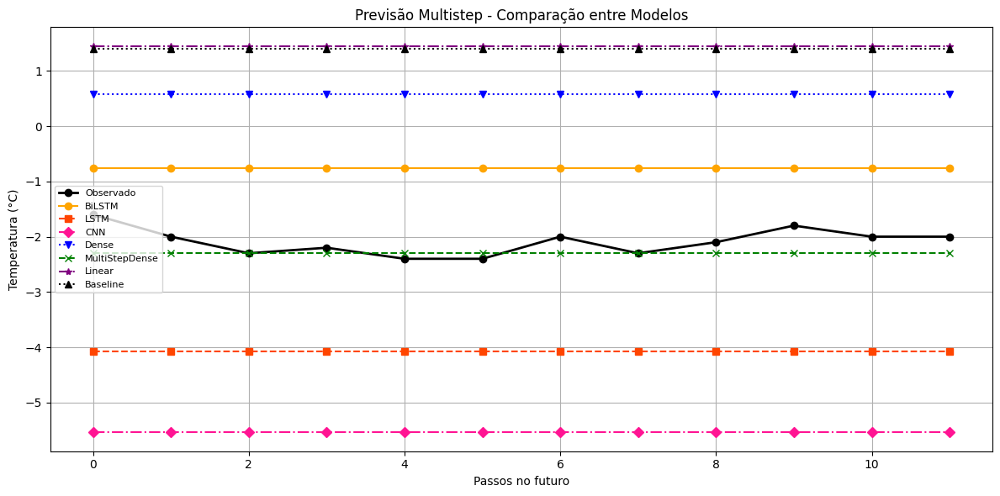

In [ ]:
def plot_models_with_metrics(modelos, train_mean, train_std, step=0):
    import matplotlib.pyplot as plt
    import numpy as np
    import tensorflow as tf

    plt.figure(figsize=(12, 6))

    cores = ['black', 'orange', 'orangered', 'deeppink', 'blue', 'green', 'purple']
    estilos = ['-', '--', '-.', ':', '--', '-.', ':']
    marcadores = ['o', 's', 'D', 'v', 'x', '*', '^']

    # Referência para observado
    modelo_ref = next(iter(modelos.values()))
    _, targets_ref = next(iter(modelo_ref[1].test))
    y_true = targets_ref[0].numpy().flatten()

    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    plt.plot(y_true_orig, 'o-k', label='Observado', linewidth=2)

    for idx, (nome, (model, window)) in enumerate(modelos.items()):
        inputs, targets = next(iter(window.test))

        # Preparar entrada x_prep para o modelo, conforme input shape
        if hasattr(model, 'input_shape'):
            input_shape = model.input_shape
            if isinstance(input_shape, list):
                input_shape = input_shape[0]

            batch_size = tf.shape(inputs)[0]

            if len(input_shape) == 3:
                time_dim = input_shape[1]
                feat_dim = input_shape[2]

                x_prep = inputs[:, :time_dim, :feat_dim]

                pad_time = time_dim - tf.shape(x_prep)[1]
                pad_feat = feat_dim - tf.shape(x_prep)[2]
                paddings = [[0, 0], [0, tf.maximum(pad_time, 0)], [0, tf.maximum(pad_feat, 0)]]
                x_prep = tf.pad(x_prep, paddings)

            elif len(input_shape) == 2:
                x_flat = tf.reshape(inputs, [batch_size, -1])
                expected_dim = input_shape[1]
                x_prep = x_flat[:, :expected_dim]
                padding_dim = expected_dim - tf.shape(x_prep)[1]
                if padding_dim > 0:
                    padding = tf.zeros([batch_size, padding_dim], dtype=x_prep.dtype)
                    x_prep = tf.concat([x_prep, padding], axis=1)
            else:
                x_prep = inputs
        else:
            x_prep = inputs

        preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
        preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

        if preds_np.ndim == 3:
            n_steps = preds_np.shape[1]

            if step >= n_steps:
                y_pred = preds_np[0, -1].squeeze()
            else:
                y_pred = preds_np[0, step].squeeze()

            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))

        elif preds_np.ndim == 2:
            y_pred = preds_np[0].squeeze()
            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))

        else:
            y_pred = preds_np.flatten()
            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))

        y_true_step = np.array(y_true)

        min_len = min(len(y_pred), len(y_true_step))
        y_pred = y_pred[:min_len]
        y_true_step = y_true_step[:min_len]

        y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']
        y_true_orig = y_true_step * train_std['Air_Temp'] + train_mean['Air_Temp']

        mae = np.mean(np.abs(y_true_orig - y_pred_orig))
        rmse = np.sqrt(np.mean((y_true_orig - y_pred_orig) ** 2))

        print(f'Modelo: {nome} | RMSE: {rmse:.4f} | MAE: {mae:.4f}')

        plt.plot(
            y_pred_orig,
            linestyle=estilos[idx % len(estilos)],
            color=cores[(idx + 1) % len(cores)],
            marker=marcadores[idx % len(marcadores)],
            label=f'{nome}'
        )

    plt.title('Previsão Multistep - Comparação entre Modelos')
    plt.xlabel('Passos no futuro')
    plt.ylabel('Temperatura (°C)')
    plt.grid(True)
    plt.legend(loc='center left', prop={'size': 8})
    plt.tight_layout()
    plt.show()

plot_models_with_metrics(modelos, train_mean, train_std)

Modelo: BiLSTM | RMSE: 1.3290 | MAE: 1.1824
Modelo: LSTM | RMSE: 10.7378 | MAE: 10.7206
Modelo: CNN | RMSE: 1.2635 | MAE: 1.1082
Modelo: Dense | RMSE: 3.7653 | MAE: 3.7160
Modelo: MultiStepDense | RMSE: 0.6426 | MAE: 0.5389
Modelo: Linear | RMSE: 2.8943 | MAE: 2.8299
Modelo: Baseline | RMSE: 1.9946 | MAE: 1.9000


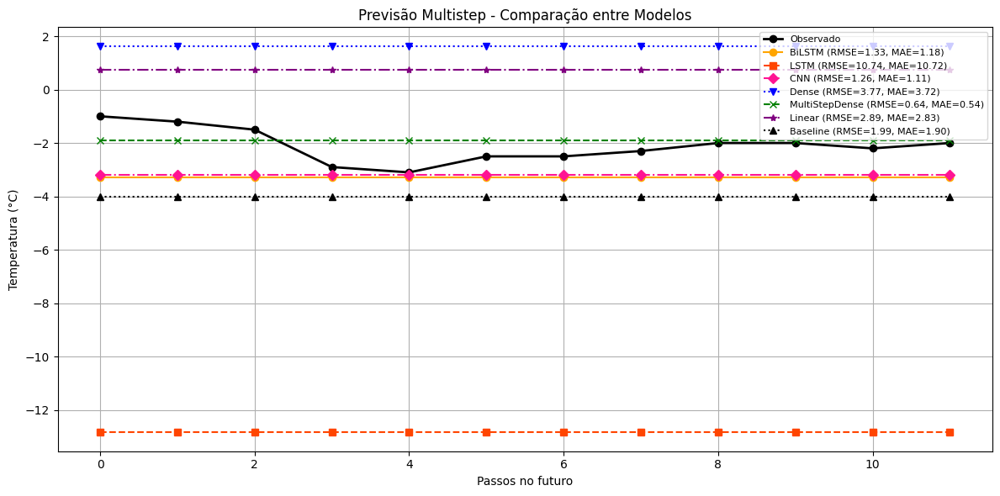

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_models_with_metrics(modelos, train_mean, train_std, step=0):
    plt.figure(figsize=(12, 6))

    cores = ['black', 'orange', 'orangered', 'deeppink', 'blue', 'green', 'purple']
    estilos = ['-', '--', '-.', ':', '--', '-.', ':']
    marcadores = ['o', 's', 'D', 'v', 'x', '*', '^']

    # Plot do observado (apenas uma vez)
    modelo_ref = next(iter(modelos.values()))
    _, window_ref = modelo_ref
    inputs_ref, targets_ref = next(iter(window_ref.test))
    y_true = targets_ref[0].numpy().flatten()
    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    plt.plot(y_true_orig, 'o-k', label='Observado', linewidth=2)

    for idx, (nome, (model, window)) in enumerate(modelos.items()):
        inputs, targets = next(iter(window.test))

        # Preparar entrada para o modelo conforme input_shape
        if hasattr(model, 'input_shape'):
            input_shape = model.input_shape
            if isinstance(input_shape, list):
                input_shape = input_shape[0]

            batch_size = tf.shape(inputs)[0]

            if len(input_shape) == 3:
                time_dim = input_shape[1]
                feat_dim = input_shape[2]

                x_prep = inputs[:, :time_dim, :feat_dim]

                pad_time = time_dim - tf.shape(x_prep)[1]
                pad_feat = feat_dim - tf.shape(x_prep)[2]
                paddings = [[0, 0], [0, tf.maximum(pad_time, 0)], [0, tf.maximum(pad_feat, 0)]]
                x_prep = tf.pad(x_prep, paddings)

            elif len(input_shape) == 2:
                x_flat = tf.reshape(inputs, [batch_size, -1])
                expected_dim = input_shape[1]
                x_prep = x_flat[:, :expected_dim]
                padding_dim = expected_dim - tf.shape(x_prep)[1]
                if padding_dim > 0:
                    padding = tf.zeros([batch_size, padding_dim], dtype=x_prep.dtype)
                    x_prep = tf.concat([x_prep, padding], axis=1)
            else:
                x_prep = inputs
        else:
            x_prep = inputs

        preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
        preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

        # Tratamento dos preds para pegar o passo `step`
        if preds_np.ndim == 3:
            n_steps = preds_np.shape[1]
            if step >= n_steps:
                y_pred = preds_np[0, -1].squeeze()
            else:
                y_pred = preds_np[0, step].squeeze()
            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))
        elif preds_np.ndim == 2:
            y_pred = preds_np[0].squeeze()
            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))
        else:
            y_pred = preds_np.flatten()
            if y_pred.ndim == 0:
                y_pred = np.repeat(y_pred, len(y_true))

        y_true_step = np.array(y_true)

        # Ajustar comprimento para evitar broadcast error
        min_len = min(len(y_pred), len(y_true_step))
        y_pred = y_pred[:min_len]
        y_true_step = y_true_step[:min_len]

        y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']
        y_true_orig_step = y_true_step * train_std['Air_Temp'] + train_mean['Air_Temp']

        mae = np.mean(np.abs(y_true_orig_step - y_pred_orig))
        rmse = np.sqrt(np.mean((y_true_orig_step - y_pred_orig) ** 2))

        print(f'Modelo: {nome} | RMSE: {rmse:.4f} | MAE: {mae:.4f}')

        plt.plot(
            y_pred_orig,
            linestyle=estilos[idx % len(estilos)],
            color=cores[(idx + 1) % len(cores)],
            marker=marcadores[idx % len(marcadores)],
            label=f'{nome} (RMSE={rmse:.2f}, MAE={mae:.2f})'
        )

    plt.title('Previsão Multistep - Comparação entre Modelos')
    plt.xlabel('Passos no futuro')
    plt.ylabel('Temperatura (°C)')
    plt.grid(True)
    plt.legend(loc='upper right', prop={'size': 8})
    plt.tight_layout()
    plt.show()

plot_models_with_metrics(modelos, train_mean, train_std, step=0)

Modelo: BiLSTM               | RMSE:  5.5700 | MAE:  5.5122 | MAPE: 532.20%
Modelo: LSTM                 | RMSE:  1.2161 | MAE:  0.9820 | MAPE:  68.39%
Modelo: CNN                  | RMSE:  0.8255 | MAE:  0.6500 | MAPE:  77.02%
Modelo: Dense                | RMSE: 13.6736 | MAE: 13.6501 | MAPE: 1412.51%
Modelo: MultiStepDense       | RMSE:  3.6095 | MAE:  3.5195 | MAPE: 316.66%
Modelo: Linear               | RMSE:  3.9472 | MAE:  3.8651 | MAPE: 354.04%
Modelo: Baseline             | RMSE:  5.6735 | MAE:  5.6167 | MAPE: 543.51%


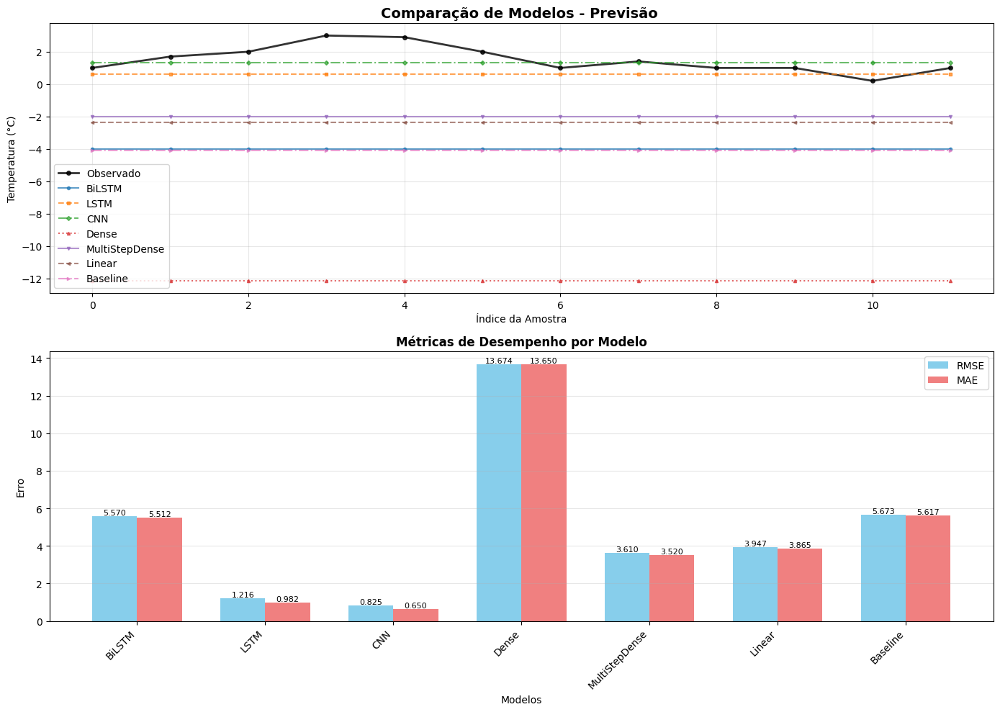

In [ ]:
def plot_models_with_metrics(modelos, train_mean, train_std, step=0, max_points=100):
    """
    Plota previsões de múltiplos modelos com métricas de desempenho.

    Args:
        modelos: Dict com {nome: (model, window)}
        train_mean: Média do treinamento para desnormalização
        train_std: Desvio padrão do treinamento para desnormalização
        step: Passo futuro a visualizar (para modelos multi-step)
        max_points: Número máximo de pontos a plotar
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import tensorflow as tf

    # Configuração da figura
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

    # Paleta de cores e estilos
    cores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
    estilos = ['-', '--', '-.', ':', '-', '--', '-.']
    marcadores = ['o', 's', 'D', '^', 'v', '<', '>']

    # Obter valores observados de referência
    modelo_ref = next(iter(modelos.values()))
    _, targets_ref = next(iter(modelo_ref[1].test))
    y_true = targets_ref[0].numpy().flatten()

    # Limitar número de pontos para melhor visualização
    if len(y_true) > max_points:
        indices = np.linspace(0, len(y_true)-1, max_points, dtype=int)
        y_true = y_true[indices]

    # Desnormalizar valores observados
    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    x_axis = np.arange(len(y_true_orig))

    # Plotar valores observados
    ax1.plot(x_axis, y_true_orig, 'o-', color='black', label='Observado',
             linewidth=2, markersize=4, alpha=0.8)

    # Dicionário para armazenar métricas
    metricas = {}

    # Processar cada modelo
    for idx, (nome, (model, window)) in enumerate(modelos.items()):
        try:
            # Obter dados de entrada
            inputs, targets = next(iter(window.test))

            # Preparar entrada para o modelo
            x_prep = prepare_model_input(model, inputs)

            # Fazer previsão
            preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
            preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

            # Extrair previsões do passo correto
            y_pred = extract_predictions(preds_np, step, len(y_true))

            # Aplicar mesma amostragem se necessário
            if len(y_pred) > max_points:
                y_pred = y_pred[indices]

            # Garantir mesmo tamanho
            min_len = min(len(y_pred), len(y_true_orig))
            y_pred = y_pred[:min_len]
            y_true_plot = y_true_orig[:min_len]
            x_axis_plot = x_axis[:min_len]

            # Desnormalizar previsões
            y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']

            # Calcular métricas
            mae = np.mean(np.abs(y_true_plot - y_pred_orig))
            rmse = np.sqrt(np.mean((y_true_plot - y_pred_orig) ** 2))
            mape = np.mean(np.abs((y_true_plot - y_pred_orig) / y_true_plot)) * 100

            metricas[nome] = {'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

            # Plotar previsões
            cor = cores[idx % len(cores)]
            estilo = estilos[idx % len(estilos)]
            marcador = marcadores[idx % len(marcadores)]

            ax1.plot(x_axis_plot, y_pred_orig,
                    linestyle=estilo, color=cor, marker=marcador,
                    label=f'{nome}', markersize=3, alpha=0.7)

            print(f'Modelo: {nome:20s} | RMSE: {rmse:7.4f} | MAE: {mae:7.4f} | MAPE: {mape:6.2f}%')

        except Exception as e:
            print(f'Erro ao processar modelo {nome}: {str(e)}')
            continue

    # Configurar gráfico principal
    ax1.set_title(f'Comparação de Modelos - Previsão {"Multistep (passo " + str(step) + ")" if step > 0 else ""}',
                  fontsize=14, fontweight='bold')
    ax1.set_xlabel('Índice da Amostra')
    ax1.set_ylabel('Temperatura (°C)')
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best', prop={'size': 10})

    # Plotar gráfico de barras com métricas
    if metricas:
        nomes = list(metricas.keys())
        rmse_vals = [metricas[n]['RMSE'] for n in nomes]
        mae_vals = [metricas[n]['MAE'] for n in nomes]

        x = np.arange(len(nomes))
        width = 0.35

        bars1 = ax2.bar(x - width/2, rmse_vals, width, label='RMSE', color='skyblue')
        bars2 = ax2.bar(x + width/2, mae_vals, width, label='MAE', color='lightcoral')

        # Adicionar valores nas barras
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax2.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.3f}', ha='center', va='bottom', fontsize=8)

        ax2.set_xlabel('Modelos')
        ax2.set_ylabel('Erro')
        ax2.set_title('Métricas de Desempenho por Modelo', fontsize=12, fontweight='bold')
        ax2.set_xticks(x)
        ax2.set_xticklabels(nomes, rotation=45, ha='right')
        ax2.legend()
        ax2.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.show()

    return metricas


def prepare_model_input(model, inputs):
    """Prepara entrada para diferentes arquiteturas de modelo."""
    import tensorflow as tf

    if not hasattr(model, 'input_shape'):
        return inputs

    input_shape = model.input_shape
    if isinstance(input_shape, list):
        input_shape = input_shape[0]

    batch_size = tf.shape(inputs)[0]

    if len(input_shape) == 3:
        # Modelo 3D (batch, time, features)
        time_dim = input_shape[1]
        feat_dim = input_shape[2]

        x_prep = inputs[:, :time_dim, :feat_dim]

        # Padding se necessário
        pad_time = time_dim - tf.shape(x_prep)[1]
        pad_feat = feat_dim - tf.shape(x_prep)[2]

        if pad_time > 0 or pad_feat > 0:
            paddings = [[0, 0],
                       [0, tf.maximum(pad_time, 0)],
                       [0, tf.maximum(pad_feat, 0)]]
            x_prep = tf.pad(x_prep, paddings)

    elif len(input_shape) == 2:
        # Modelo 2D (batch, features)
        x_flat = tf.reshape(inputs, [batch_size, -1])
        expected_dim = input_shape[1]

        if tf.shape(x_flat)[1] < expected_dim:
            padding_dim = expected_dim - tf.shape(x_flat)[1]
            padding = tf.zeros([batch_size, padding_dim], dtype=x_flat.dtype)
            x_prep = tf.concat([x_flat, padding], axis=1)
        else:
            x_prep = x_flat[:, :expected_dim]
    else:
        x_prep = inputs

    return x_prep


def extract_predictions(preds_np, step, target_len):
    """Extrai previsões do array de saída do modelo."""
    import numpy as np

    if preds_np.ndim == 3:
        # Saída 3D: (batch, time_steps, features)
        n_steps = preds_np.shape[1]

        if step >= n_steps:
            # Se o passo solicitado excede, usar último disponível
            y_pred = preds_np[0, -1].squeeze()
        else:
            y_pred = preds_np[0, step].squeeze()

        # Se escalar, repetir para todo o comprimento
        if y_pred.ndim == 0:
            y_pred = np.repeat(y_pred, target_len)

    elif preds_np.ndim == 2:
        # Saída 2D: (batch, features)
        y_pred = preds_np[0].squeeze()

        if y_pred.ndim == 0:
            y_pred = np.repeat(y_pred, target_len)

    else:
        # Saída 1D ou escalar
        y_pred = preds_np.flatten()

        if len(y_pred) == 1:
            y_pred = np.repeat(y_pred, target_len)

    return y_pred


# Exemplo de uso:
metricas = plot_models_with_metrics(modelos, train_mean, train_std, step=0, max_points=50)

In [ ]:
tempos_treinamento

{'baseline': 0.02585005760192871,
 'Linear': 66.61089658737183,
 'mlp': 63.06341099739075,
 'mlp2': 82.78998756408691,
 'multiple-input-step': 38.19488501548767,
 'multiple-input-step-2': 70.6384928226471,
 'cnn': 68.27582240104675,
 'LSTM': 900.9815862178802,
 'BiLSTM': 1215.6453886032104}

In [ ]:
tempos_validacao

{'baseline': 5.414351940155029,
 'Linear': 2.6384999752044678,
 'mlp': 2.1007044315338135,
 'mlp2': 2.6221797466278076,
 'multiple-input-step': 2.618170738220215,
 'multiple-input-step-2': 2.639597177505493,
 'cnn': 1.8157508373260498,
 'LSTM': 10.313157320022583,
 'BiLSTM': 10.32146954536438}

In [ ]:
tempos_teste

{'baseline': 1.3413794040679932,
 'Linear': 0.9338967800140381,
 'mlp': 1.345576524734497,
 'mlp2': 2.626399040222168,
 'multiple-input-step': 1.3297479152679443,
 'multiple-input-step-2': 0.9423656463623047,
 'cnn': 0.9474706649780273,
 'LSTM': 2.6392219066619873,
 'BiLSTM': 5.185123443603516}


Processando modelo 1/7: BiLSTM
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 2/7: LSTM
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 3/7: CNN
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 4/7: Dense
  - Fazendo previsão...
  - Plotado com sucesso!
  - Métricas: RMSE: 0.1972 | MAE: 0.1373 | MAPE: 82.40%

Processando modelo 5/7: MultiStepDense
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 6/7: Linear
  - Fazendo previsão...
  - Plotado com sucesso!
  - Métricas: RMSE: 0.1769 | MAE: 0.1153 | MAPE: 70.74%

Processando modelo 7/7: Baseline
  - Fazendo previsão...
  - Plotado com sucesso!
  - Métricas: RMSE: 0.1787 | MAE: 0.1068 | MAPE: 0.00%

Plotando métricas para 3 modelos...


/tmp/ipython-input-2357397035.py:282: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


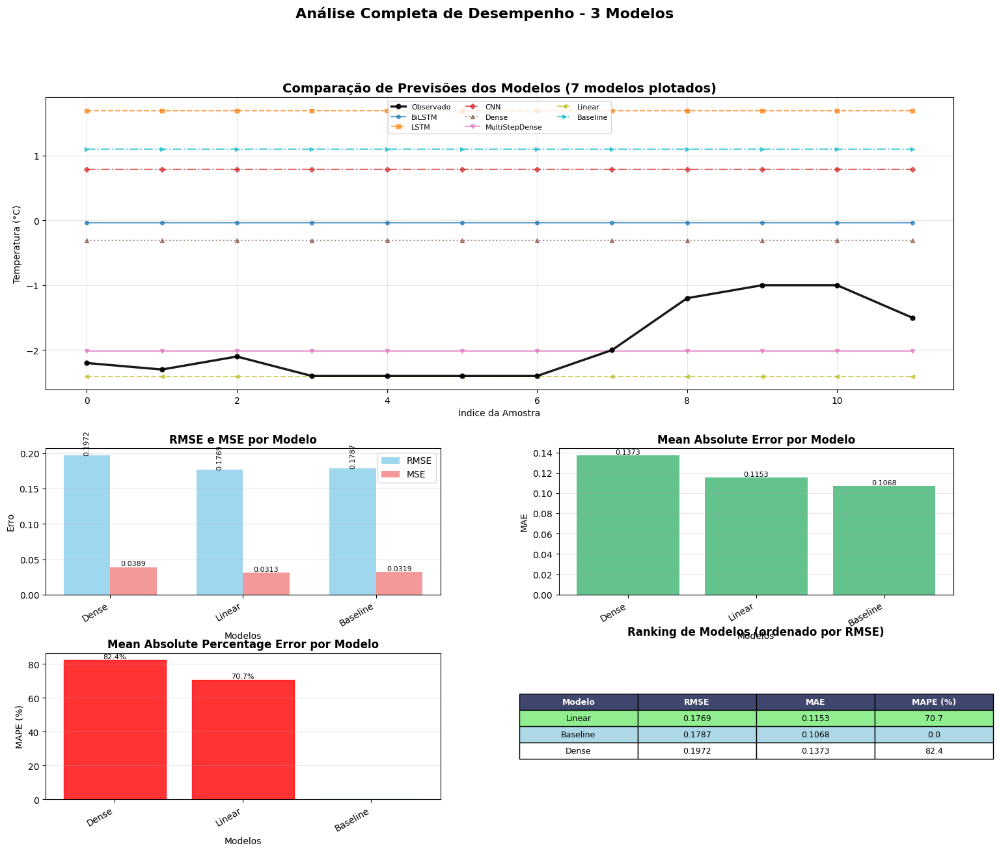

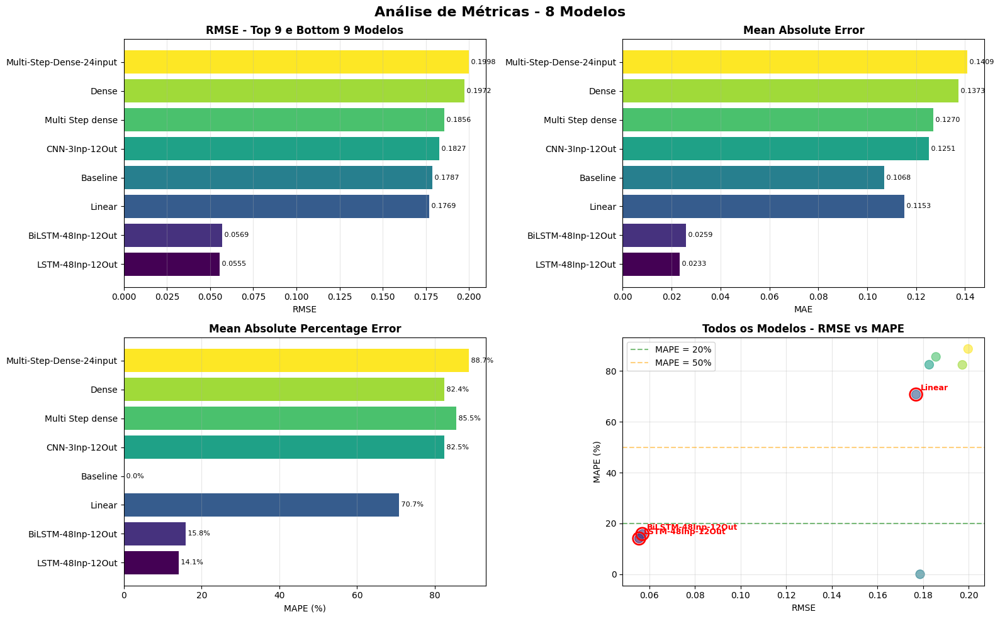


Top 5 Melhores Modelos (por RMSE):
             Model     RMSE      MAE      MAPE      MSE
  LSTM-48Inp-12Out 0.055473 0.023335 14.078782 0.003077
BiLSTM-48Inp-12Out 0.056905 0.025898 15.846425 0.003238
            Linear 0.176920 0.115274 70.735039 0.031301
          Baseline 0.178706 0.106847  0.000000 0.031936
    CNN-3Inp-12Out 0.182690 0.125150 82.468391 0.033376


In [ ]:
def plot_models_with_test_metrics(modelos, test_metrics, train_mean, train_std, step=0, max_points=100):
    """
    Plota previsões de modelos com suas métricas reais de teste.

    Args:
        modelos: Dict com {nome: (model, window)}
        test_metrics: Dict com métricas de teste de cada modelo
        train_mean: Média do treinamento para desnormalização
        train_std: Desvio padrão do treinamento para desnormalização
        step: Passo futuro a visualizar (para modelos multi-step)
        max_points: Número máximo de pontos a plotar
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import tensorflow as tf
    from matplotlib.gridspec import GridSpec

    # Criar figura com layout customizado
    fig = plt.figure(figsize=(18, 14))
    gs = GridSpec(3, 2, figure=fig, height_ratios=[2, 1, 1], hspace=0.3, wspace=0.3)

    # Subplots
    ax_pred = fig.add_subplot(gs[0, :])  # Gráfico de previsões
    ax_rmse = fig.add_subplot(gs[1, 0])  # RMSE/MSE
    ax_mae = fig.add_subplot(gs[1, 1])   # MAE
    ax_mape = fig.add_subplot(gs[2, 0])  # MAPE
    ax_table = fig.add_subplot(gs[2, 1]) # Tabela resumo

    # Paleta de cores expandida
    num_models = len(modelos)
    cores = plt.cm.tab10(np.linspace(0, 1, min(num_models, 10)))
    if num_models > 10:
        cores = plt.cm.tab20(np.linspace(0, 1, num_models))

    estilos = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--']
    marcadores = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h']

    # Obter valores observados
    modelo_ref = next(iter(modelos.values()))
    _, targets_ref = next(iter(modelo_ref[1].test))
    y_true = targets_ref[0].numpy().flatten()

    # Limitar pontos se necessário
    if len(y_true) > max_points:
        indices = np.linspace(0, len(y_true)-1, max_points, dtype=int)
        y_true = y_true[indices]
    else:
        indices = None

    # Desnormalizar valores observados
    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    x_axis = np.arange(len(y_true_orig))

    # Plotar valores observados
    ax_pred.plot(x_axis, y_true_orig, 'o-', color='black',
                label='Observado', linewidth=2.5, markersize=5, alpha=0.9, zorder=10)

    # Preparar dados para métricas
    nomes_modelos = []
    rmse_values = []
    mse_values = []
    mae_values = []
    mape_values = []

    # Contador para tracking
    plot_counter = 0

    # Processar cada modelo
    for idx, (nome, (model, window)) in enumerate(modelos.items()):
        print(f"\nProcessando modelo {idx+1}/{num_models}: {nome}")

        try:
            # Obter dados de entrada
            inputs, targets = next(iter(window.test))

            # Preparar entrada
            x_prep = prepare_model_input(model, inputs)

            # Fazer previsão
            print(f"  - Fazendo previsão...")
            preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
            preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

            # Extrair previsões
            y_pred = extract_predictions(preds_np, step, len(y_true))

            # Aplicar mesma amostragem
            if indices is not None and len(y_pred) > max_points:
                y_pred = y_pred[indices]

            # Garantir mesmo tamanho
            min_len = min(len(y_pred), len(y_true_orig))
            y_pred = y_pred[:min_len]
            x_axis_plot = x_axis[:min_len]

            # Desnormalizar previsões
            y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']

            # Plotar previsões
            cor = cores[plot_counter % len(cores)]
            estilo = estilos[plot_counter % len(estilos)]
            marcador = marcadores[plot_counter % len(marcadores)]

            ax_pred.plot(x_axis_plot, y_pred_orig,
                        linestyle=estilo, color=cor, marker=marcador,
                        label=f'{nome}', markersize=4, alpha=0.7,
                        markevery=max(1, len(x_axis_plot)//20),
                        linewidth=1.5)

            print(f"  - Plotado com sucesso!")
            plot_counter += 1

        except Exception as e:
            print(f"  - Erro ao plotar previsões: {str(e)}")
            print(f"  - Continuando com as métricas de teste...")

        # Sempre coletar métricas de teste, independente do plot
        if nome in test_metrics:
            metrics = test_metrics[nome]
            nomes_modelos.append(nome)

            # RMSE e MSE
            if 'root_mean_squared_error' in metrics:
                rmse_values.append(metrics['root_mean_squared_error'])
            elif 'mean_squared_error' in metrics:
                rmse_values.append(np.sqrt(metrics['mean_squared_error']))
            else:
                rmse_values.append(np.sqrt(metrics.get('loss', 0)))

            mse_values.append(metrics.get('mean_squared_error', metrics.get('loss', 0)))

            # MAE
            mae_values.append(metrics.get('mean_absolute_error', 0))

            # MAPE
            mape_values.append(metrics.get('mean_absolute_percentage_error', 0))

            print(f'  - Métricas: RMSE: {rmse_values[-1]:.4f} | '
                  f'MAE: {mae_values[-1]:.4f} | '
                  f'MAPE: {mape_values[-1]:.2f}%')

    # Configurar gráfico de previsões
    ax_pred.set_title(f'Comparação de Previsões dos Modelos ({plot_counter} modelos plotados)',
                     fontsize=14, fontweight='bold')
    ax_pred.set_xlabel('Índice da Amostra')
    ax_pred.set_ylabel('Temperatura (°C)')
    ax_pred.grid(True, alpha=0.3)
    ax_pred.legend(loc='best', prop={'size': 8}, ncol=3)

    # Verificar se temos métricas para plotar
    if not nomes_modelos:
        print("\nNenhuma métrica encontrada!")
        return {}

    print(f"\nPlotando métricas para {len(nomes_modelos)} modelos...")

    # Plotar RMSE/MSE
    x_pos = np.arange(len(nomes_modelos))
    width = 0.35

    # Ajustar tamanho das fontes se muitos modelos
    font_size = 8 if len(nomes_modelos) > 6 else 10
    rotation = 45 if len(nomes_modelos) > 4 else 30

    bars1 = ax_rmse.bar(x_pos - width/2, rmse_values, width,
                        label='RMSE', color='skyblue', alpha=0.8)
    bars2 = ax_rmse.bar(x_pos + width/2, mse_values, width,
                        label='MSE', color='lightcoral', alpha=0.8)

    # Adicionar valores nas barras
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0.001:  # Só mostrar se valor significativo
                ax_rmse.text(bar.get_x() + bar.get_width()/2., height,
                            f'{height:.4f}', ha='center', va='bottom',
                            fontsize=font_size-2, rotation=90 if height > 0.1 else 0)

    ax_rmse.set_xlabel('Modelos')
    ax_rmse.set_ylabel('Erro')
    ax_rmse.set_title('RMSE e MSE por Modelo', fontsize=12, fontweight='bold')
    ax_rmse.set_xticks(x_pos)
    ax_rmse.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_rmse.legend()
    ax_rmse.grid(True, alpha=0.3, axis='y')

    # Plotar MAE
    bars_mae = ax_mae.bar(x_pos, mae_values, color='mediumseagreen', alpha=0.8)

    for bar in bars_mae:
        height = bar.get_height()
        if height > 0.001:
            ax_mae.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.4f}', ha='center', va='bottom', fontsize=font_size-2)

    ax_mae.set_xlabel('Modelos')
    ax_mae.set_ylabel('MAE')
    ax_mae.set_title('Mean Absolute Error por Modelo', fontsize=12, fontweight='bold')
    ax_mae.set_xticks(x_pos)
    ax_mae.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_mae.grid(True, alpha=0.3, axis='y')

    # Plotar MAPE
    bars_mape = ax_mape.bar(x_pos, mape_values, color='mediumpurple', alpha=0.8)

    # Colorir barras baseado no valor
    for bar, mape in zip(bars_mape, mape_values):
        if mape < 20:
            bar.set_color('green')
        elif mape < 50:
            bar.set_color('orange')
        else:
            bar.set_color('red')

        height = bar.get_height()
        if height > 0.01:
            ax_mape.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.1f}%', ha='center', va='bottom', fontsize=font_size-2)

    ax_mape.set_xlabel('Modelos')
    ax_mape.set_ylabel('MAPE (%)')
    ax_mape.set_title('Mean Absolute Percentage Error por Modelo', fontsize=12, fontweight='bold')
    ax_mape.set_xticks(x_pos)
    ax_mape.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_mape.grid(True, alpha=0.3, axis='y')

    # Criar tabela resumo
    ax_table.axis('tight')
    ax_table.axis('off')

    # Preparar dados da tabela
    table_data = []
    headers = ['Modelo', 'RMSE', 'MAE', 'MAPE (%)']

    # Ordenar modelos por RMSE
    sorted_indices = np.argsort(rmse_values)

    for i in sorted_indices[:10]:  # Mostrar top 10
        row = [
            nomes_modelos[i][:25],  # Limitar nome
            f'{rmse_values[i]:.4f}',
            f'{mae_values[i]:.4f}',
            f'{mape_values[i]:.1f}'
        ]
        table_data.append(row)

    # Criar tabela
    table = ax_table.table(cellText=table_data,
                          colLabels=headers,
                          cellLoc='center',
                          loc='center')

    # Estilizar tabela
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)

    # Colorir cabeçalho
    for i in range(len(headers)):
        table[(0, i)].set_facecolor('#40466e')
        table[(0, i)].set_text_props(weight='bold', color='white')

    # Colorir linhas alternadas e destacar melhores
    for i in range(1, len(table_data) + 1):
        for j in range(len(headers)):
            if i == 1:  # Melhor modelo
                table[(i, j)].set_facecolor('#90EE90')
            elif i == 2:  # Segundo melhor
                table[(i, j)].set_facecolor('#ADD8E6')
            elif i % 2 == 0:
                table[(i, j)].set_facecolor('#f0f0f0')

    title_table = 'Top 10 Modelos (ordenado por RMSE)'
    if len(nomes_modelos) <= 10:
        title_table = 'Ranking de Modelos (ordenado por RMSE)'

    ax_table.set_title(title_table, fontsize=12, fontweight='bold', pad=20)

    plt.suptitle(f'Análise Completa de Desempenho - {len(nomes_modelos)} Modelos',
                 fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Retornar métricas organizadas
    return {
        nome: {
            'RMSE': rmse,
            'MSE': mse,
            'MAE': mae,
            'MAPE': mape
        }
        for nome, rmse, mse, mae, mape in zip(
            nomes_modelos, rmse_values, mse_values, mae_values, mape_values
        )
    }


# Função alternativa para quando há muitos modelos
def plot_metrics_summary(test_metrics, top_n=10):
    """
    Cria visualização resumida focada nos melhores modelos.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    # Converter para DataFrame
    df_data = []
    for model, metrics in test_metrics.items():
        row = {
            'Model': model,
            'RMSE': metrics.get('root_mean_squared_error', np.sqrt(metrics.get('mean_squared_error', metrics.get('loss', 0)))),
            'MAE': metrics.get('mean_absolute_error', 0),
            'MAPE': metrics.get('mean_absolute_percentage_error', 0),
            'MSE': metrics.get('mean_squared_error', metrics.get('loss', 0))
        }
        df_data.append(row)

    df = pd.DataFrame(df_data)
    df = df.sort_values('RMSE')

    # Pegar top N e bottom N
    if len(df) > top_n * 2:
        df_plot = pd.concat([df.head(top_n), df.tail(top_n)])
    else:
        df_plot = df

    # Criar figura
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 10))

    # Cores
    colors_good = plt.cm.Greens(np.linspace(0.4, 0.8, top_n))
    colors_bad = plt.cm.Reds(np.linspace(0.4, 0.8, top_n))

    if len(df) > top_n * 2:
        colors = np.concatenate([colors_good, colors_bad])
    else:
        colors = plt.cm.viridis(np.linspace(0, 1, len(df_plot)))

    # 1. RMSE
    bars1 = ax1.barh(df_plot['Model'], df_plot['RMSE'], color=colors)
    ax1.set_xlabel('RMSE')
    ax1.set_title(f'RMSE - Top {top_n} e Bottom {top_n} Modelos', fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='x')

    for bar in bars1:
        width = bar.get_width()
        ax1.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.4f}', ha='left', va='center', fontsize=8)

    # 2. MAE
    bars2 = ax2.barh(df_plot['Model'], df_plot['MAE'], color=colors)
    ax2.set_xlabel('MAE')
    ax2.set_title('Mean Absolute Error', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')

    for bar in bars2:
        width = bar.get_width()
        ax2.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.4f}', ha='left', va='center', fontsize=8)

    # 3. MAPE
    bars3 = ax3.barh(df_plot['Model'], df_plot['MAPE'], color=colors)
    ax3.set_xlabel('MAPE (%)')
    ax3.set_title('Mean Absolute Percentage Error', fontsize=12, fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='x')

    for bar in bars3:
        width = bar.get_width()
        ax3.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.1f}%', ha='left', va='center', fontsize=8)

    # 4. Comparação todos os modelos
    ax4.scatter(df['RMSE'], df['MAPE'], s=100, alpha=0.6, c=range(len(df)), cmap='viridis')

    # Destacar top 3
    for idx, row in df.head(3).iterrows():
        ax4.scatter(row['RMSE'], row['MAPE'], s=200, edgecolors='red',
                   linewidths=2, facecolors='none')
        ax4.annotate(row['Model'],
                    (row['RMSE'], row['MAPE']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=9, fontweight='bold', color='red')

    ax4.set_xlabel('RMSE')
    ax4.set_ylabel('MAPE (%)')
    ax4.set_title('Todos os Modelos - RMSE vs MAPE', fontsize=12, fontweight='bold')
    ax4.grid(True, alpha=0.3)

    # Linhas de referência
    ax4.axhline(y=20, color='green', linestyle='--', alpha=0.5, label='MAPE = 20%')
    ax4.axhline(y=50, color='orange', linestyle='--', alpha=0.5, label='MAPE = 50%')
    ax4.legend()

    plt.suptitle(f'Análise de Métricas - {len(df)} Modelos', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print("\nTop 5 Melhores Modelos (por RMSE):")
    print(df.head().to_string(index=False))

    return df


# Uso:
# 1. Plotar todos os modelos com métricas
metricas = plot_models_with_test_metrics(modelos, performance, train_mean, train_std)

# 2. Se houver muitos modelos, usar visualização resumida
df_metrics = plot_metrics_summary(performance, top_n=9)


Processando modelo 1/6: BiLSTM
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 2/6: LSTM
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 3/6: CNN
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 4/6: Dense
  - Fazendo previsão...
  - Plotado com sucesso!
  - Métricas: RMSE: 0.1972 | MAE: 0.1373 | MAPE: 82.40%

Processando modelo 5/6: MultiStepDense
  - Fazendo previsão...
  - Plotado com sucesso!

Processando modelo 6/6: Linear
  - Fazendo previsão...
  - Plotado com sucesso!
  - Métricas: RMSE: 0.1769 | MAE: 0.1153 | MAPE: 70.74%

Plotando métricas para 2 modelos...


/tmp/ipython-input-3067854017.py:287: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


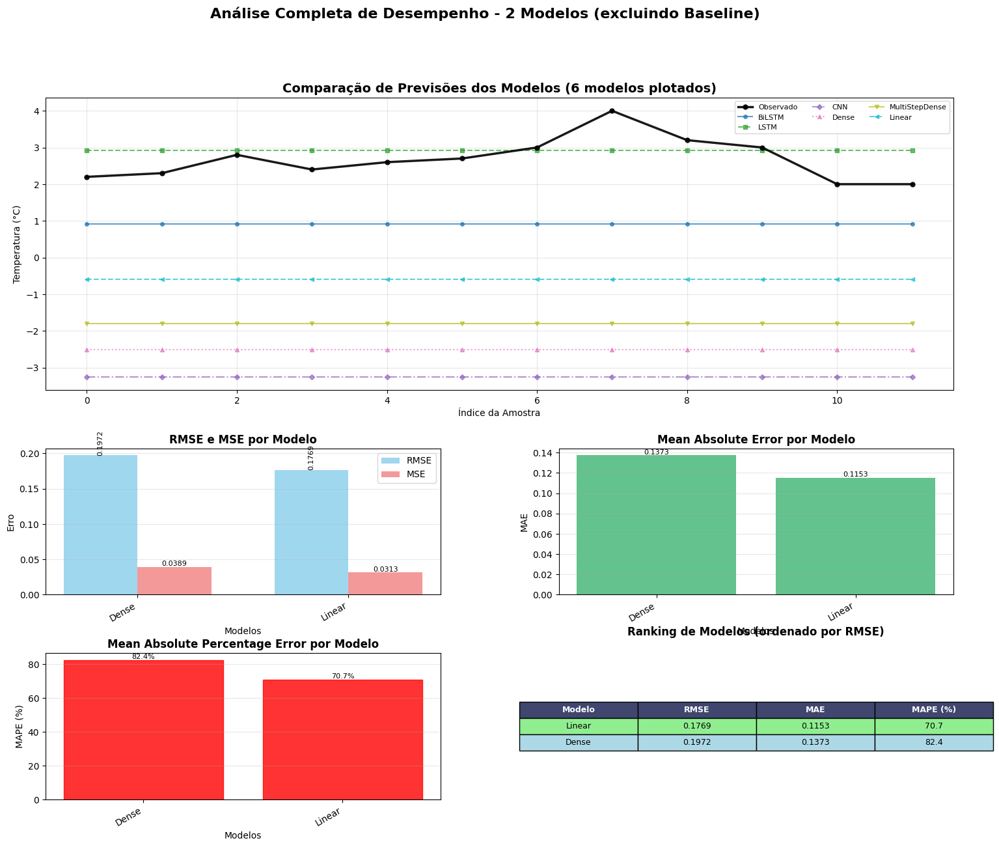

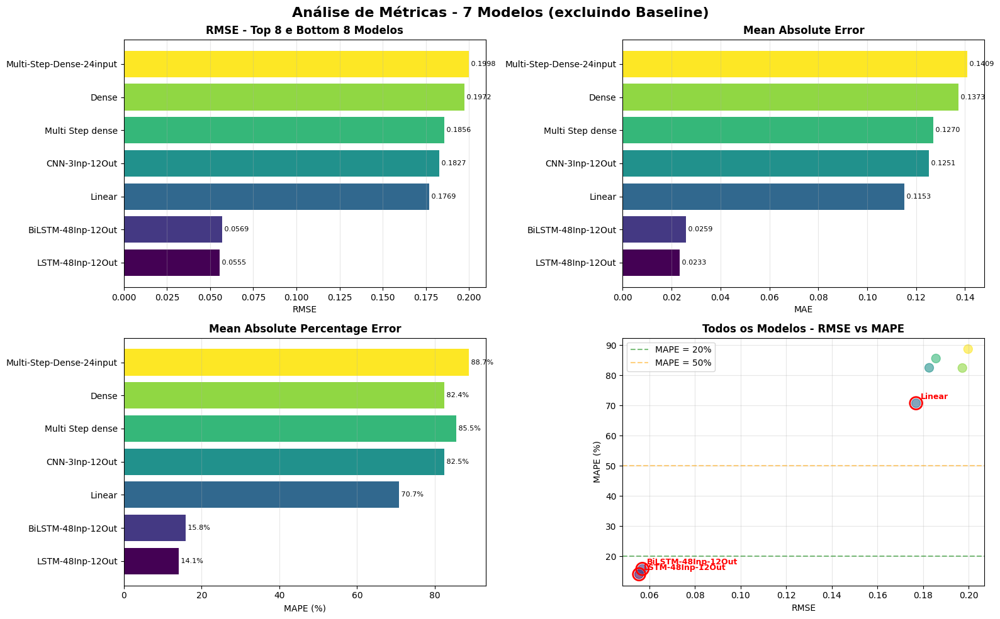


Top 5 Melhores Modelos (por RMSE) - excluindo Baseline:
             Model     RMSE      MAE      MAPE      MSE
  LSTM-48Inp-12Out 0.055473 0.023335 14.078782 0.003077
BiLSTM-48Inp-12Out 0.056905 0.025898 15.846425 0.003238
            Linear 0.176920 0.115274 70.735039 0.031301
    CNN-3Inp-12Out 0.182690 0.125150 82.468391 0.033376
  Multi Step dense 0.185649 0.127046 85.548698 0.034465


In [ ]:
def plot_models_with_test_metrics(modelos, test_metrics, train_mean, train_std, step=0, max_points=100, exclude_models=['Baseline']):
    """
    Plota previsões de modelos com suas métricas reais de teste.

    Args:
        modelos: Dict com {nome: (model, window)}
        test_metrics: Dict com métricas de teste de cada modelo
        train_mean: Média do treinamento para desnormalização
        train_std: Desvio padrão do treinamento para desnormalização
        step: Passo futuro a visualizar (para modelos multi-step)
        max_points: Número máximo de pontos a plotar
        exclude_models: Lista de modelos a excluir da visualização
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import tensorflow as tf
    from matplotlib.gridspec import GridSpec

    # Filtrar modelos excluídos
    modelos_filtered = {k: v for k, v in modelos.items() if k not in exclude_models}
    test_metrics_filtered = {k: v for k, v in test_metrics.items() if k not in exclude_models}

    # Criar figura com layout customizado
    fig = plt.figure(figsize=(18, 14))
    gs = GridSpec(3, 2, figure=fig, height_ratios=[2, 1, 1], hspace=0.3, wspace=0.3)

    # Subplots
    ax_pred = fig.add_subplot(gs[0, :])  # Gráfico de previsões
    ax_rmse = fig.add_subplot(gs[1, 0])  # RMSE/MSE
    ax_mae = fig.add_subplot(gs[1, 1])   # MAE
    ax_mape = fig.add_subplot(gs[2, 0])  # MAPE
    ax_table = fig.add_subplot(gs[2, 1]) # Tabela resumo

    # Paleta de cores expandida
    num_models = len(modelos_filtered)
    cores = plt.cm.tab10(np.linspace(0, 1, min(num_models, 10)))
    if num_models > 10:
        cores = plt.cm.tab20(np.linspace(0, 1, num_models))

    estilos = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--']
    marcadores = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h']

    # Obter valores observados (usar modelo original, não filtrado)
    modelo_ref = next(iter(modelos.values()))
    _, targets_ref = next(iter(modelo_ref[1].test))
    y_true = targets_ref[0].numpy().flatten()

    # Limitar pontos se necessário
    if len(y_true) > max_points:
        indices = np.linspace(0, len(y_true)-1, max_points, dtype=int)
        y_true = y_true[indices]
    else:
        indices = None

    # Desnormalizar valores observados
    y_true_orig = y_true * train_std['Air_Temp'] + train_mean['Air_Temp']
    x_axis = np.arange(len(y_true_orig))

    # Plotar valores observados
    ax_pred.plot(x_axis, y_true_orig, 'o-', color='black',
                label='Observado', linewidth=2.5, markersize=5, alpha=0.9, zorder=10)

    # Preparar dados para métricas
    nomes_modelos = []
    rmse_values = []
    mse_values = []
    mae_values = []
    mape_values = []

    # Contador para tracking
    plot_counter = 0

    # Processar cada modelo (excluindo Baseline)
    for idx, (nome, (model, window)) in enumerate(modelos_filtered.items()):
        print(f"\nProcessando modelo {idx+1}/{num_models}: {nome}")

        try:
            # Obter dados de entrada
            inputs, targets = next(iter(window.test))

            # Preparar entrada
            x_prep = prepare_model_input(model, inputs)

            # Fazer previsão
            print(f"  - Fazendo previsão...")
            preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
            preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

            # Extrair previsões
            y_pred = extract_predictions(preds_np, step, len(y_true))

            # Aplicar mesma amostragem
            if indices is not None and len(y_pred) > max_points:
                y_pred = y_pred[indices]

            # Garantir mesmo tamanho
            min_len = min(len(y_pred), len(y_true_orig))
            y_pred = y_pred[:min_len]
            x_axis_plot = x_axis[:min_len]

            # Desnormalizar previsões
            y_pred_orig = y_pred * train_std['Air_Temp'] + train_mean['Air_Temp']

            # Plotar previsões
            cor = cores[plot_counter % len(cores)]
            estilo = estilos[plot_counter % len(estilos)]
            marcador = marcadores[plot_counter % len(marcadores)]

            ax_pred.plot(x_axis_plot, y_pred_orig,
                        linestyle=estilo, color=cor, marker=marcador,
                        label=f'{nome}', markersize=4, alpha=0.7,
                        markevery=max(1, len(x_axis_plot)//20),
                        linewidth=1.5)

            print(f"  - Plotado com sucesso!")
            plot_counter += 1

        except Exception as e:
            print(f"  - Erro ao plotar previsões: {str(e)}")
            print(f"  - Continuando com as métricas de teste...")

        # Sempre coletar métricas de teste (excluindo Baseline)
        if nome in test_metrics_filtered:
            metrics = test_metrics_filtered[nome]
            nomes_modelos.append(nome)

            # RMSE e MSE
            if 'root_mean_squared_error' in metrics:
                rmse_values.append(metrics['root_mean_squared_error'])
            elif 'mean_squared_error' in metrics:
                rmse_values.append(np.sqrt(metrics['mean_squared_error']))
            else:
                rmse_values.append(np.sqrt(metrics.get('loss', 0)))

            mse_values.append(metrics.get('mean_squared_error', metrics.get('loss', 0)))

            # MAE
            mae_values.append(metrics.get('mean_absolute_error', 0))

            # MAPE
            mape_values.append(metrics.get('mean_absolute_percentage_error', 0))

            print(f'  - Métricas: RMSE: {rmse_values[-1]:.4f} | '
                  f'MAE: {mae_values[-1]:.4f} | '
                  f'MAPE: {mape_values[-1]:.2f}%')

    # Configurar gráfico de previsões
    ax_pred.set_title(f'Comparação de Previsões dos Modelos ({plot_counter} modelos plotados)',
                     fontsize=14, fontweight='bold')
    ax_pred.set_xlabel('Índice da Amostra')
    ax_pred.set_ylabel('Temperatura (°C)')
    ax_pred.grid(True, alpha=0.3)
    ax_pred.legend(loc='best', prop={'size': 8}, ncol=3)

    # Verificar se temos métricas para plotar
    if not nomes_modelos:
        print("\nNenhuma métrica encontrada!")
        return {}

    print(f"\nPlotando métricas para {len(nomes_modelos)} modelos...")

    # Plotar RMSE/MSE
    x_pos = np.arange(len(nomes_modelos))
    width = 0.35

    # Ajustar tamanho das fontes se muitos modelos
    font_size = 8 if len(nomes_modelos) > 6 else 10
    rotation = 45 if len(nomes_modelos) > 4 else 30

    bars1 = ax_rmse.bar(x_pos - width/2, rmse_values, width,
                        label='RMSE', color='skyblue', alpha=0.8)
    bars2 = ax_rmse.bar(x_pos + width/2, mse_values, width,
                        label='MSE', color='lightcoral', alpha=0.8)

    # Adicionar valores nas barras
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0.001:  # Só mostrar se valor significativo
                ax_rmse.text(bar.get_x() + bar.get_width()/2., height,
                            f'{height:.4f}', ha='center', va='bottom',
                            fontsize=font_size-2, rotation=90 if height > 0.1 else 0)

    ax_rmse.set_xlabel('Modelos')
    ax_rmse.set_ylabel('Erro')
    ax_rmse.set_title('RMSE e MSE por Modelo', fontsize=12, fontweight='bold')
    ax_rmse.set_xticks(x_pos)
    ax_rmse.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_rmse.legend()
    ax_rmse.grid(True, alpha=0.3, axis='y')

    # Plotar MAE
    bars_mae = ax_mae.bar(x_pos, mae_values, color='mediumseagreen', alpha=0.8)

    for bar in bars_mae:
        height = bar.get_height()
        if height > 0.001:
            ax_mae.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.4f}', ha='center', va='bottom', fontsize=font_size-2)

    ax_mae.set_xlabel('Modelos')
    ax_mae.set_ylabel('MAE')
    ax_mae.set_title('Mean Absolute Error por Modelo', fontsize=12, fontweight='bold')
    ax_mae.set_xticks(x_pos)
    ax_mae.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_mae.grid(True, alpha=0.3, axis='y')

    # Plotar MAPE
    bars_mape = ax_mape.bar(x_pos, mape_values, color='mediumpurple', alpha=0.8)

    # Colorir barras baseado no valor
    for bar, mape in zip(bars_mape, mape_values):
        if mape < 20:
            bar.set_color('green')
        elif mape < 50:
            bar.set_color('orange')
        else:
            bar.set_color('red')

        height = bar.get_height()
        if height > 0.01:
            ax_mape.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.1f}%', ha='center', va='bottom', fontsize=font_size-2)

    ax_mape.set_xlabel('Modelos')
    ax_mape.set_ylabel('MAPE (%)')
    ax_mape.set_title('Mean Absolute Percentage Error por Modelo', fontsize=12, fontweight='bold')
    ax_mape.set_xticks(x_pos)
    ax_mape.set_xticklabels(nomes_modelos, rotation=rotation, ha='right', fontsize=font_size)
    ax_mape.grid(True, alpha=0.3, axis='y')

    # Criar tabela resumo
    ax_table.axis('tight')
    ax_table.axis('off')

    # Preparar dados da tabela
    table_data = []
    headers = ['Modelo', 'RMSE', 'MAE', 'MAPE (%)']

    # Ordenar modelos por RMSE
    sorted_indices = np.argsort(rmse_values)

    for i in sorted_indices[:10]:  # Mostrar top 10
        row = [
            nomes_modelos[i][:25],  # Limitar nome
            f'{rmse_values[i]:.4f}',
            f'{mae_values[i]:.4f}',
            f'{mape_values[i]:.1f}'
        ]
        table_data.append(row)

    # Criar tabela
    table = ax_table.table(cellText=table_data,
                          colLabels=headers,
                          cellLoc='center',
                          loc='center')

    # Estilizar tabela
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)

    # Colorir cabeçalho
    for i in range(len(headers)):
        table[(0, i)].set_facecolor('#40466e')
        table[(0, i)].set_text_props(weight='bold', color='white')

    # Colorir linhas alternadas e destacar melhores
    for i in range(1, len(table_data) + 1):
        for j in range(len(headers)):
            if i == 1:  # Melhor modelo
                table[(i, j)].set_facecolor('#90EE90')
            elif i == 2:  # Segundo melhor
                table[(i, j)].set_facecolor('#ADD8E6')
            elif i % 2 == 0:
                table[(i, j)].set_facecolor('#f0f0f0')

    title_table = 'Top 10 Modelos (ordenado por RMSE)'
    if len(nomes_modelos) <= 10:
        title_table = 'Ranking de Modelos (ordenado por RMSE)'

    ax_table.set_title(title_table, fontsize=12, fontweight='bold', pad=20)

    plt.suptitle(f'Análise Completa de Desempenho - {len(nomes_modelos)} Modelos (excluindo {", ".join(exclude_models)})',
                 fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Retornar métricas organizadas
    return {
        nome: {
            'RMSE': rmse,
            'MSE': mse,
            'MAE': mae,
            'MAPE': mape
        }
        for nome, rmse, mse, mae, mape in zip(
            nomes_modelos, rmse_values, mse_values, mae_values, mape_values
        )
    }


def plot_metrics_summary(test_metrics, top_n=10, exclude_models=['Baseline']):
    """
    Cria visualização resumida focada nos melhores modelos.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    # Filtrar modelos excluídos
    test_metrics_filtered = {k: v for k, v in test_metrics.items() if k not in exclude_models}

    # Converter para DataFrame
    df_data = []
    for model, metrics in test_metrics_filtered.items():
        row = {
            'Model': model,
            'RMSE': metrics.get('root_mean_squared_error', np.sqrt(metrics.get('mean_squared_error', metrics.get('loss', 0)))),
            'MAE': metrics.get('mean_absolute_error', 0),
            'MAPE': metrics.get('mean_absolute_percentage_error', 0),
            'MSE': metrics.get('mean_squared_error', metrics.get('loss', 0))
        }
        df_data.append(row)

    df = pd.DataFrame(df_data)
    df = df.sort_values('RMSE')

    # Pegar top N e bottom N
    if len(df) > top_n * 2:
        df_plot = pd.concat([df.head(top_n), df.tail(top_n)])
    else:
        df_plot = df

    # Criar figura
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 10))

    # Cores
    colors_good = plt.cm.Greens(np.linspace(0.4, 0.8, top_n))
    colors_bad = plt.cm.Reds(np.linspace(0.4, 0.8, top_n))

    if len(df) > top_n * 2:
        colors = np.concatenate([colors_good, colors_bad])
    else:
        colors = plt.cm.viridis(np.linspace(0, 1, len(df_plot)))

    # 1. RMSE
    bars1 = ax1.barh(df_plot['Model'], df_plot['RMSE'], color=colors)
    ax1.set_xlabel('RMSE')
    ax1.set_title(f'RMSE - Top {top_n} e Bottom {top_n} Modelos', fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='x')

    for bar in bars1:
        width = bar.get_width()
        ax1.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.4f}', ha='left', va='center', fontsize=8)

    # 2. MAE
    bars2 = ax2.barh(df_plot['Model'], df_plot['MAE'], color=colors)
    ax2.set_xlabel('MAE')
    ax2.set_title('Mean Absolute Error', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')

    for bar in bars2:
        width = bar.get_width()
        ax2.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.4f}', ha='left', va='center', fontsize=8)

    # 3. MAPE
    bars3 = ax3.barh(df_plot['Model'], df_plot['MAPE'], color=colors)
    ax3.set_xlabel('MAPE (%)')
    ax3.set_title('Mean Absolute Percentage Error', fontsize=12, fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='x')

    for bar in bars3:
        width = bar.get_width()
        ax3.text(width, bar.get_y() + bar.get_height()/2,
                f' {width:.1f}%', ha='left', va='center', fontsize=8)

    # 4. Comparação todos os modelos
    ax4.scatter(df['RMSE'], df['MAPE'], s=100, alpha=0.6, c=range(len(df)), cmap='viridis')

    # Destacar top 3
    for idx, row in df.head(3).iterrows():
        ax4.scatter(row['RMSE'], row['MAPE'], s=200, edgecolors='red',
                   linewidths=2, facecolors='none')
        ax4.annotate(row['Model'],
                    (row['RMSE'], row['MAPE']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=9, fontweight='bold', color='red')

    ax4.set_xlabel('RMSE')
    ax4.set_ylabel('MAPE (%)')
    ax4.set_title('Todos os Modelos - RMSE vs MAPE', fontsize=12, fontweight='bold')
    ax4.grid(True, alpha=0.3)

    # Linhas de referência
    ax4.axhline(y=20, color='green', linestyle='--', alpha=0.5, label='MAPE = 20%')
    ax4.axhline(y=50, color='orange', linestyle='--', alpha=0.5, label='MAPE = 50%')
    ax4.legend()

    plt.suptitle(f'Análise de Métricas - {len(df)} Modelos (excluindo {", ".join(exclude_models)})',
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print(f"\nTop 5 Melhores Modelos (por RMSE) - excluindo {', '.join(exclude_models)}:")
    print(df.head().to_string(index=False))

    return df


# Uso:
# 1. Plotar todos os modelos exceto Baseline
metricas = plot_models_with_test_metrics(modelos, performance, train_mean, train_std)

# 2. Visualização resumida excluindo Baseline
df_metrics = plot_metrics_summary(performance, top_n=8)

# 3. Se quiser incluir o Baseline, basta remover o parâmetro ou passar lista vazia
# metricas_com_baseline = plot_models_with_test_metrics(modelos, test_metrics, train_mean, train_std, exclude_models=[])

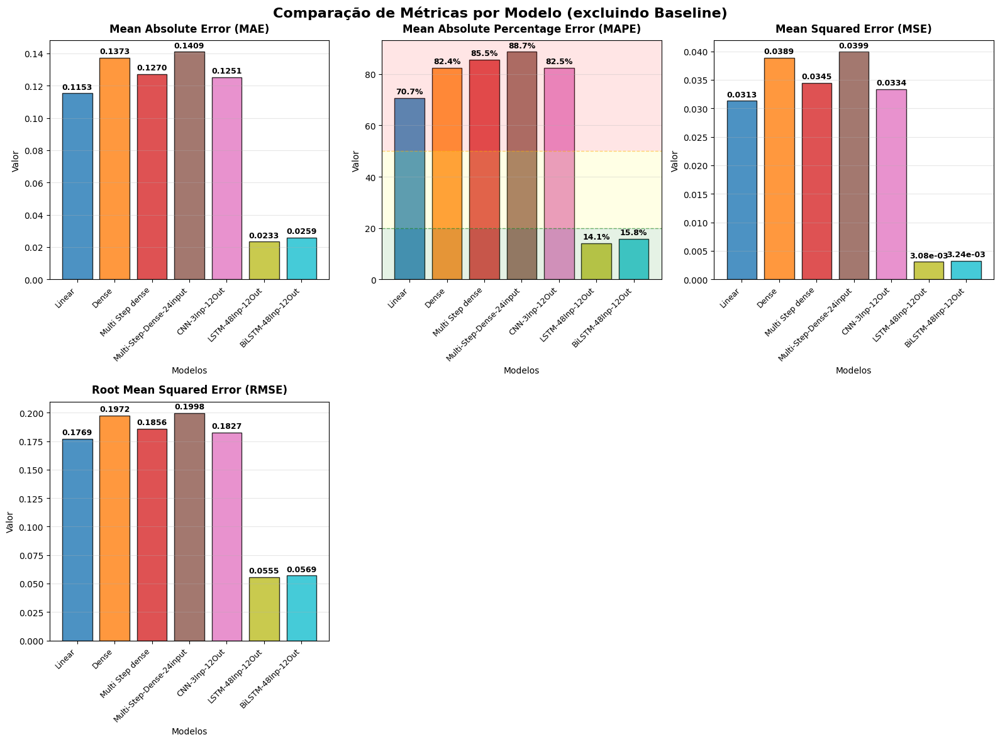

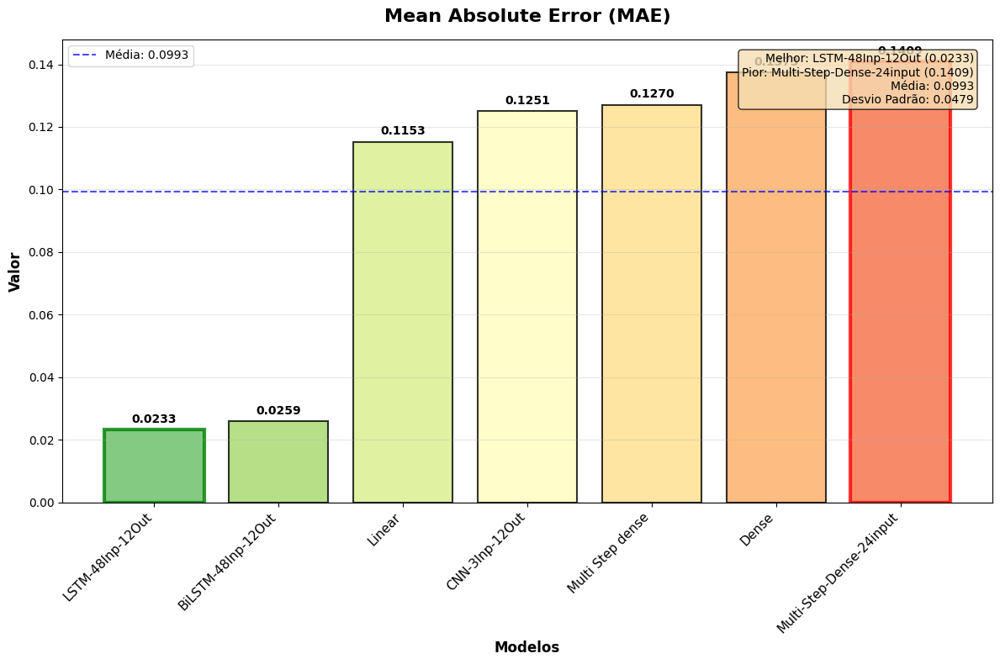

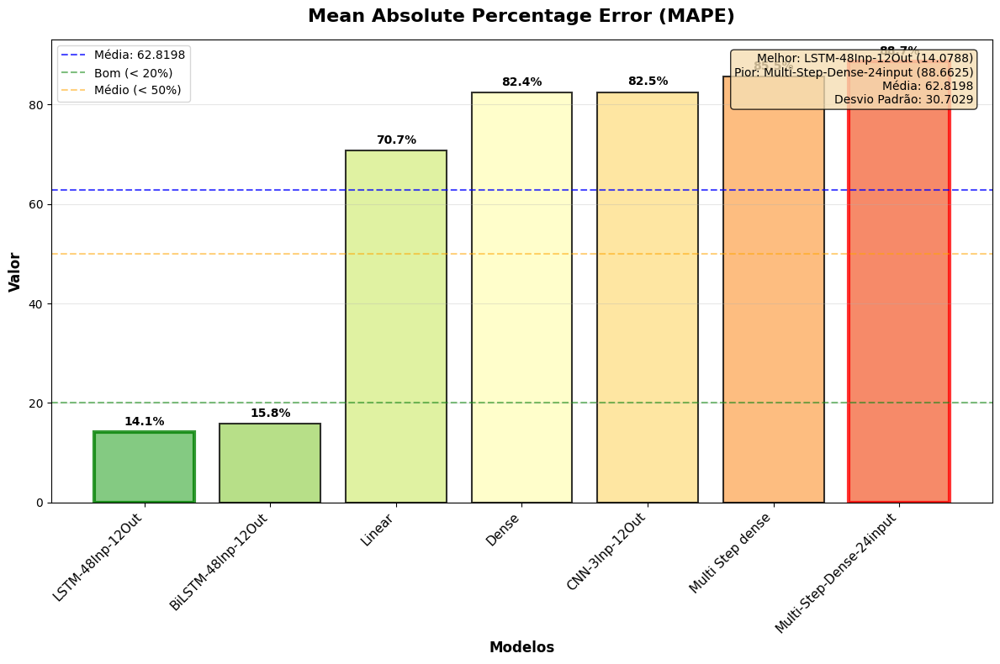

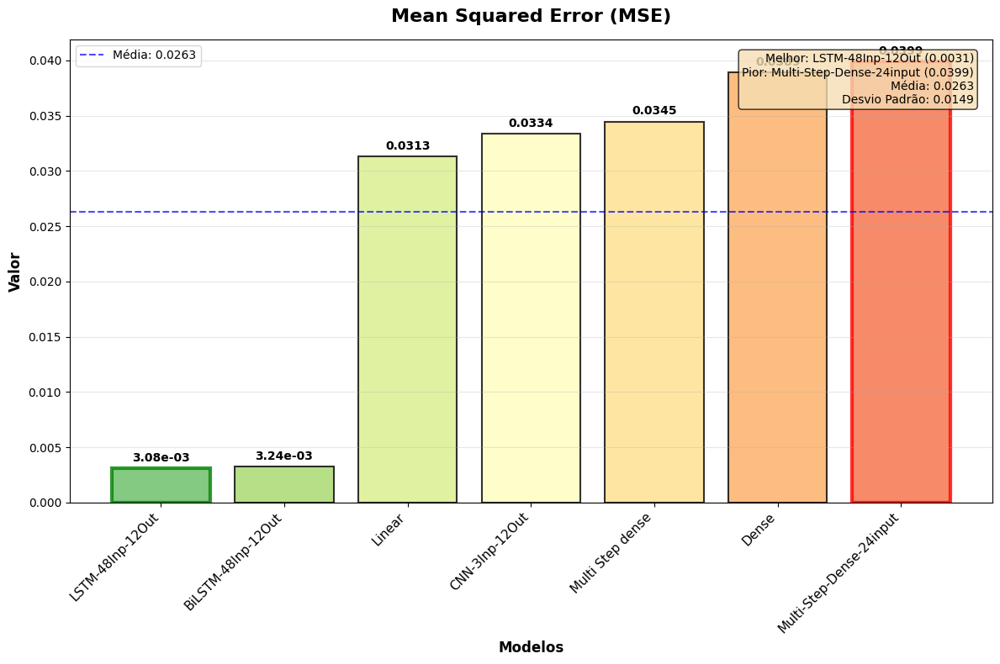

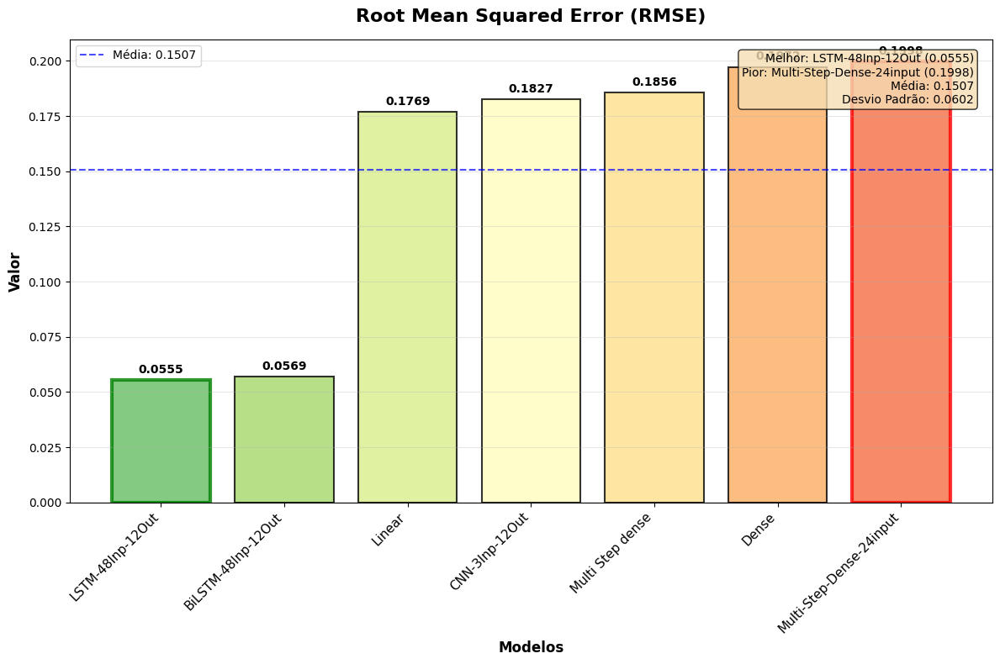

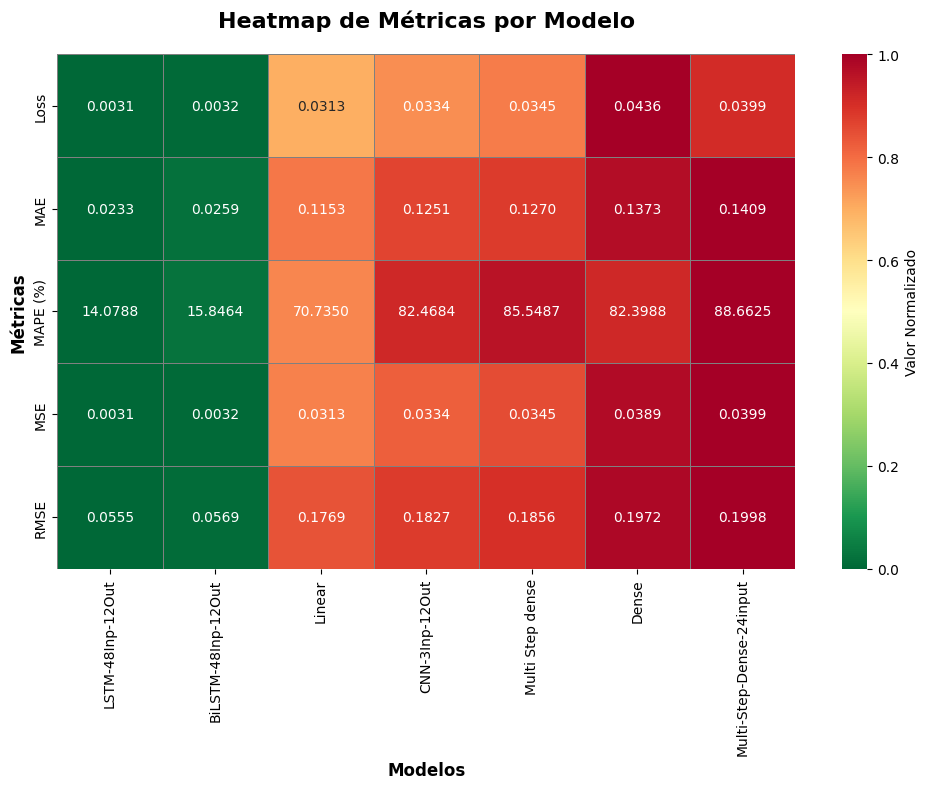

In [ ]:
def plot_metrics_bars(test_metrics, exclude_models=['Baseline'], figsize=(16, 12)):
    """
    Cria gráficos de barras separados para cada métrica disponível.

    Args:
        test_metrics: Dict com métricas de teste de cada modelo
        exclude_models: Lista de modelos a excluir
        figsize: Tamanho da figura
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from matplotlib.patches import Rectangle

    # Filtrar modelos excluídos
    test_metrics_filtered = {k: v for k, v in test_metrics.items() if k not in exclude_models}

    # Identificar todas as métricas disponíveis
    all_metrics = set()
    for model_metrics in test_metrics_filtered.values():
        all_metrics.update(model_metrics.keys())

    # Remover 'loss' se outras métricas estiverem disponíveis
    if len(all_metrics) > 1 and 'loss' in all_metrics:
        all_metrics.remove('loss')

    all_metrics = sorted(list(all_metrics))

    # Preparar dados
    models = list(test_metrics_filtered.keys())

    # Calcular layout do subplot
    n_metrics = len(all_metrics)
    n_cols = min(3, n_metrics)
    n_rows = (n_metrics + n_cols - 1) // n_cols

    # Criar figura
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_metrics == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)

    # Cores para os modelos
    colors = plt.cm.tab10(np.linspace(0, 1, len(models)))

    # Mapear nomes de métricas para títulos mais legíveis
    metric_titles = {
        'mean_absolute_error': 'Mean Absolute Error (MAE)',
        'mean_squared_error': 'Mean Squared Error (MSE)',
        'root_mean_squared_error': 'Root Mean Squared Error (RMSE)',
        'mean_absolute_percentage_error': 'Mean Absolute Percentage Error (MAPE)',
        'loss': 'Loss',
    }

    # Criar um gráfico para cada métrica
    for idx, metric in enumerate(all_metrics):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]

        # Coletar valores da métrica para cada modelo
        values = []
        valid_models = []
        model_colors = []

        for i, model in enumerate(models):
            if metric in test_metrics_filtered[model]:
                value = test_metrics_filtered[model][metric]

                # Para RMSE, calcular se não estiver disponível
                if metric == 'root_mean_squared_error' and value == 0:
                    if 'mean_squared_error' in test_metrics_filtered[model]:
                        value = np.sqrt(test_metrics_filtered[model]['mean_squared_error'])
                    elif 'loss' in test_metrics_filtered[model]:
                        value = np.sqrt(test_metrics_filtered[model]['loss'])

                values.append(value)
                valid_models.append(model)
                model_colors.append(colors[i])

        if not values:
            ax.text(0.5, 0.5, 'Sem dados', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(metric_titles.get(metric, metric))
            continue

        # Criar gráfico de barras
        x_pos = np.arange(len(valid_models))
        bars = ax.bar(x_pos, values, color=model_colors, alpha=0.8, edgecolor='black', linewidth=1)

        # Adicionar valores nas barras
        for bar, value in zip(bars, values):
            height = bar.get_height()

            # Formatar valor baseado na métrica
            if 'percentage' in metric:
                label = f'{height:.1f}%'
            elif height < 0.01:
                label = f'{height:.2e}'
            elif height < 1:
                label = f'{height:.4f}'
            else:
                label = f'{height:.2f}'

            # Posicionar texto
            y_pos = height + ax.get_ylim()[1] * 0.01
            ax.text(bar.get_x() + bar.get_width()/2., y_pos,
                   label, ha='center', va='bottom', fontsize=9, fontweight='bold')

        # Configurar eixos
        ax.set_xlabel('Modelos', fontsize=10)
        ax.set_ylabel('Valor', fontsize=10)
        ax.set_title(metric_titles.get(metric, metric), fontsize=12, fontweight='bold', pad=10)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(valid_models, rotation=45, ha='right', fontsize=9)
        ax.grid(True, alpha=0.3, axis='y')

        # Adicionar linha de referência para MAPE
        if 'percentage' in metric:
            ax.axhline(y=20, color='green', linestyle='--', alpha=0.5, linewidth=1)
            ax.axhline(y=50, color='orange', linestyle='--', alpha=0.5, linewidth=1)

        # Colorir fundo baseado no desempenho (para MAPE)
        if 'percentage' in metric:
            ylim = ax.get_ylim()
            ax.add_patch(Rectangle((ax.get_xlim()[0], 0),
                                 ax.get_xlim()[1] - ax.get_xlim()[0], 20,
                                 facecolor='green', alpha=0.1))
            ax.add_patch(Rectangle((ax.get_xlim()[0], 20),
                                 ax.get_xlim()[1] - ax.get_xlim()[0], 30,
                                 facecolor='yellow', alpha=0.1))
            ax.add_patch(Rectangle((ax.get_xlim()[0], 50),
                                 ax.get_xlim()[1] - ax.get_xlim()[0], ylim[1] - 50,
                                 facecolor='red', alpha=0.1))
            ax.set_ylim(ylim)

    # Remover subplots vazios
    for idx in range(len(all_metrics), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]
        ax.remove()

    # Título geral
    excl_text = f" (excluindo {', '.join(exclude_models)})" if exclude_models else ""
    plt.suptitle(f'Comparação de Métricas por Modelo{excl_text}',
                fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Retornar DataFrame com todas as métricas
    df_data = []
    for model in models:
        row = {'Model': model}
        for metric in all_metrics:
            if metric in test_metrics_filtered[model]:
                value = test_metrics_filtered[model][metric]
                if metric == 'root_mean_squared_error' and value == 0:
                    if 'mean_squared_error' in test_metrics_filtered[model]:
                        value = np.sqrt(test_metrics_filtered[model]['mean_squared_error'])
                row[metric] = value
            else:
                row[metric] = np.nan
        df_data.append(row)

    df = pd.DataFrame(df_data)
    return df


def plot_individual_metric_bars(test_metrics, exclude_models=['Baseline']):
    """
    Cria um gráfico de barras individual para cada métrica em figuras separadas.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Filtrar modelos excluídos
    test_metrics_filtered = {k: v for k, v in test_metrics.items() if k not in exclude_models}

    # Identificar todas as métricas disponíveis
    all_metrics = set()
    for model_metrics in test_metrics_filtered.values():
        all_metrics.update(model_metrics.keys())

    # Remover 'loss' se outras métricas estiverem disponíveis
    if len(all_metrics) > 1 and 'loss' in all_metrics:
        all_metrics.remove('loss')

    all_metrics = sorted(list(all_metrics))

    # Preparar dados
    models = list(test_metrics_filtered.keys())

    # Cores para os modelos
    colors = plt.cm.viridis(np.linspace(0, 1, len(models)))

    # Mapear nomes de métricas
    metric_titles = {
        'mean_absolute_error': 'Mean Absolute Error (MAE)',
        'mean_squared_error': 'Mean Squared Error (MSE)',
        'root_mean_squared_error': 'Root Mean Squared Error (RMSE)',
        'mean_absolute_percentage_error': 'Mean Absolute Percentage Error (MAPE)',
        'loss': 'Loss',
    }

    # Criar uma figura para cada métrica
    for metric in all_metrics:
        # Coletar valores
        values = []
        valid_models = []

        for model in models:
            if metric in test_metrics_filtered[model]:
                value = test_metrics_filtered[model][metric]

                # Para RMSE, calcular se não estiver disponível
                if metric == 'root_mean_squared_error' and value == 0:
                    if 'mean_squared_error' in test_metrics_filtered[model]:
                        value = np.sqrt(test_metrics_filtered[model]['mean_squared_error'])
                    elif 'loss' in test_metrics_filtered[model]:
                        value = np.sqrt(test_metrics_filtered[model]['loss'])

                values.append(value)
                valid_models.append(model)

        if not values:
            continue

        # Ordenar por valor (melhor para pior)
        sorted_indices = np.argsort(values)
        values = [values[i] for i in sorted_indices]
        valid_models = [valid_models[i] for i in sorted_indices]

        # Criar figura
        fig, ax = plt.subplots(figsize=(12, 8))

        # Cores baseadas no desempenho
        bar_colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(values)))

        # Criar barras
        x_pos = np.arange(len(valid_models))
        bars = ax.bar(x_pos, values, color=bar_colors, alpha=0.8, edgecolor='black', linewidth=1.5)

        # Destacar melhor e pior
        bars[0].set_edgecolor('green')
        bars[0].set_linewidth(3)
        bars[-1].set_edgecolor('red')
        bars[-1].set_linewidth(3)

        # Adicionar valores
        for bar, value in zip(bars, values):
            height = bar.get_height()

            # Formatar valor
            if 'percentage' in metric:
                label = f'{height:.1f}%'
            elif height < 0.01:
                label = f'{height:.2e}'
            elif height < 1:
                label = f'{height:.4f}'
            else:
                label = f'{height:.2f}'

            # Posicionar texto
            y_pos = height + max(values) * 0.01
            ax.text(bar.get_x() + bar.get_width()/2., y_pos,
                   label, ha='center', va='bottom', fontsize=10, fontweight='bold')

        # Configurar gráfico
        ax.set_xlabel('Modelos', fontsize=12, fontweight='bold')
        ax.set_ylabel('Valor', fontsize=12, fontweight='bold')
        ax.set_title(metric_titles.get(metric, metric), fontsize=16, fontweight='bold', pad=15)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(valid_models, rotation=45, ha='right', fontsize=11)
        ax.grid(True, alpha=0.3, axis='y')

        # Adicionar linha de média
        mean_value = np.mean(values)
        ax.axhline(y=mean_value, color='blue', linestyle='--', alpha=0.7,
                  label=f'Média: {mean_value:.4f}')

        # Para MAPE, adicionar referências
        if 'percentage' in metric:
            ax.axhline(y=20, color='green', linestyle='--', alpha=0.5,
                      label='Bom (< 20%)')
            ax.axhline(y=50, color='orange', linestyle='--', alpha=0.5,
                      label='Médio (< 50%)')

        ax.legend(loc='upper left')

        # Adicionar estatísticas
        stats_text = f'Melhor: {valid_models[0]} ({values[0]:.4f})\n'
        stats_text += f'Pior: {valid_models[-1]} ({values[-1]:.4f})\n'
        stats_text += f'Média: {mean_value:.4f}\n'
        stats_text += f'Desvio Padrão: {np.std(values):.4f}'

        ax.text(0.98, 0.97, stats_text, transform=ax.transAxes,
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
               verticalalignment='top', horizontalalignment='right',
               fontsize=10)

        plt.tight_layout()
        plt.show()


def plot_metrics_heatmap(test_metrics, exclude_models=['Baseline']):
    """
    Cria um heatmap com todas as métricas e modelos.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    import pandas as pd

    # Filtrar modelos excluídos
    test_metrics_filtered = {k: v for k, v in test_metrics.items() if k not in exclude_models}

    # Criar DataFrame
    df_data = []
    for model, metrics in test_metrics_filtered.items():
        row = {'Model': model}
        row.update(metrics)
        df_data.append(row)

    df = pd.DataFrame(df_data)
    df = df.set_index('Model')

    # Calcular RMSE se não existir
    if 'root_mean_squared_error' not in df.columns and 'mean_squared_error' in df.columns:
        df['root_mean_squared_error'] = np.sqrt(df['mean_squared_error'])

    # Remover colunas com todos NaN
    df = df.dropna(axis=1, how='all')

    # Renomear colunas
    column_names = {
        'mean_absolute_error': 'MAE',
        'mean_squared_error': 'MSE',
        'root_mean_squared_error': 'RMSE',
        'mean_absolute_percentage_error': 'MAPE (%)',
        'loss': 'Loss'
    }
    df = df.rename(columns=column_names)

    # Ordenar por RMSE
    if 'RMSE' in df.columns:
        df = df.sort_values('RMSE')

    # Criar figura
    plt.figure(figsize=(10, 8))

    # Normalizar valores para melhor visualização
    df_norm = df.copy()
    for col in df_norm.columns:
        if df_norm[col].std() > 0:
            df_norm[col] = (df_norm[col] - df_norm[col].min()) / (df_norm[col].max() - df_norm[col].min())

    # Criar heatmap
    sns.heatmap(df_norm.T, annot=df.T, fmt='.4f', cmap='RdYlGn_r',
                cbar_kws={'label': 'Valor Normalizado'},
                linewidths=0.5, linecolor='gray')

    plt.title('Heatmap de Métricas por Modelo', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Modelos', fontsize=12, fontweight='bold')
    plt.ylabel('Métricas', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

    return df


# Uso das funções:

# 1. Gráficos de barras para cada métrica em uma única figura
df_metrics = plot_metrics_bars(performance)

# 2. Gráficos individuais para cada métrica (um por figura)
plot_individual_metric_bars(performance)

# 3. Heatmap com todas as métricas
df_heatmap = plot_metrics_heatmap(performance)

# 4. Incluir Baseline se necessário
# df_metrics_with_baseline = plot_metrics_bars(performance, exclude_models=[])


In [ ]:
# def plot_models_with_metrics(modelos, train_mean, train_std, test_df, step=0):
#     import matplotlib.pyplot as plt
#     import numpy as np
#     import tensorflow as tf

#     # Forçar o matplotlib a mostrar o gráfico
#     plt.ion()  # Modo interativo

#     fig, ax = plt.subplots(figsize=(14, 8))

#     cores = ['black', 'orange', 'orangered', 'deeppink', 'blue', 'green', 'purple']
#     estilos = ['-', '--', '-.', ':', '--', '-.', ':']
#     marcadores = ['o', 's', 'D', 'v', 'x', '*', '^']

#     # Usar todo o conjunto de teste como referência
#     if isinstance(test_df, pd.DataFrame) and 'Air_Temp' in test_df.columns:
#         y_true_full = test_df['Air_Temp'].values
#     else:
#         # Se test_df não for DataFrame ou não tiver Air_Temp, tentar extrair de outra forma
#         y_true_full = test_df.values.flatten() if hasattr(test_df, 'values') else np.array(test_df).flatten()

#     print(f"Dados observados: {len(y_true_full)} pontos")

#     # Plotar valores observados
#     ax.plot(range(len(y_true_full)), y_true_full, 'o-k', label='Observado',
#             linewidth=2, markersize=4, alpha=0.7)

#     # Dicionário para armazenar resultados
#     resultados = {}

#     for idx, (nome, (model, window)) in enumerate(modelos.items()):
#         print(f"\nProcessando modelo: {nome}")

#         all_predictions = []
#         all_true_values = []

#         try:
#             batch_count = 0
#             # Iterar sobre todos os batches de teste
#             for inputs, targets in window.test:
#                 batch_count += 1

#                 # Preparar entrada para o modelo
#                 if hasattr(model, 'input_shape'):
#                     input_shape = model.input_shape
#                     if isinstance(input_shape, list):
#                         input_shape = input_shape[0]

#                     batch_size = inputs.shape[0]

#                     if len(input_shape) == 3:
#                         time_dim = input_shape[1]
#                         feat_dim = input_shape[2]

#                         actual_time = min(time_dim, inputs.shape[1])
#                         actual_feat = min(feat_dim, inputs.shape[2])

#                         x_prep = inputs[:, :actual_time, :actual_feat]

#                         pad_time = max(0, time_dim - actual_time)
#                         pad_feat = max(0, feat_dim - actual_feat)

#                         if pad_time > 0 or pad_feat > 0:
#                             paddings = [[0, 0], [0, pad_time], [0, pad_feat]]
#                             x_prep = tf.pad(x_prep, paddings)

#                     elif len(input_shape) == 2:
#                         x_flat = tf.reshape(inputs, [batch_size, -1])
#                         expected_dim = input_shape[1]
#                         actual_dim = x_flat.shape[1]

#                         if actual_dim >= expected_dim:
#                             x_prep = x_flat[:, :expected_dim]
#                         else:
#                             padding_dim = expected_dim - actual_dim
#                             padding = tf.zeros([batch_size, padding_dim], dtype=x_flat.dtype)
#                             x_prep = tf.concat([x_flat, padding], axis=1)
#                     else:
#                         x_prep = inputs
#                 else:
#                     x_prep = inputs

#                 # Fazer previsões
#                 preds = model.predict(x_prep, verbose=0) if hasattr(model, "predict") else model(x_prep)
#                 preds_np = preds if isinstance(preds, np.ndarray) else preds.numpy()

#                 # Processar targets
#                 targets_np = targets.numpy() if hasattr(targets, 'numpy') else targets

#                 # Extrair valores baseado na dimensão
#                 if preds_np.ndim == 3 and targets_np.ndim == 3:
#                     n_steps = min(preds_np.shape[1], targets_np.shape[1])
#                     use_step = min(step, n_steps - 1)

#                     for i in range(preds_np.shape[0]):
#                         pred_val = preds_np[i, use_step, 0] if preds_np.shape[2] > 0 else preds_np[i, use_step]
#                         true_val = targets_np[i, use_step, 0] if targets_np.shape[2] > 0 else targets_np[i, use_step]
#                         all_predictions.append(float(pred_val))
#                         all_true_values.append(float(true_val))

#                 elif preds_np.ndim == 2 and targets_np.ndim == 2:
#                     for i in range(preds_np.shape[0]):
#                         pred_val = preds_np[i, 0] if preds_np.shape[1] > 0 else preds_np[i]
#                         true_val = targets_np[i, 0] if targets_np.shape[1] > 0 else targets_np[i]
#                         all_predictions.append(float(pred_val))
#                         all_true_values.append(float(true_val))

#                 else:
#                     # Caso 1D ou outras dimensões
#                     preds_flat = preds_np.flatten()
#                     targets_flat = targets_np.flatten()
#                     min_len = min(len(preds_flat), len(targets_flat))
#                     all_predictions.extend(preds_flat[:min_len].tolist())
#                     all_true_values.extend(targets_flat[:min_len].tolist())

#             print(f"  Batches processados: {batch_count}")
#             print(f"  Previsões coletadas: {len(all_predictions)}")

#         except Exception as e:
#             print(f"  Erro: {e}")
#             continue

#         if len(all_predictions) == 0:
#             print(f"  Sem previsões válidas para {nome}")
#             continue

#         # Converter para arrays numpy
#         y_pred_all = np.array(all_predictions)
#         y_true_all = np.array(all_true_values)

#         # Desnormalizar
#         y_pred_orig = y_pred_all * train_std['Air_Temp'] + train_mean['Air_Temp']
#         y_true_orig = y_true_all * train_std['Air_Temp'] + train_mean['Air_Temp']

#         # Calcular métricas
#         mae = np.mean(np.abs(y_true_orig - y_pred_orig))
#         rmse = np.sqrt(np.mean((y_true_orig - y_pred_orig) ** 2))

#         print(f"  RMSE: {rmse:.4f} | MAE: {mae:.4f}")

#         # Armazenar resultados
#         resultados[nome] = {
#             'predictions': y_pred_orig,
#             'true_values': y_true_orig,
#             'mae': mae,
#             'rmse': rmse
#         }

#         # Plotar previsões
#         ax.plot(
#             range(len(y_pred_orig)),
#             y_pred_orig,
#             linestyle=estilos[idx % len(estilos)],
#             color=cores[(idx + 1) % len(cores)],
#             marker=marcadores[idx % len(marcadores)],
#             label=f'{nome} (RMSE: {rmse:.2f}, MAE: {mae:.2f})',
#             markersize=3,
#             markevery=max(1, len(y_pred_orig)//30),
#             alpha=0.8
#         )

#     ax.set_title(f'Previsão Multistep - Comparação entre Modelos (Step: {step})', fontsize=14)
#     ax.set_xlabel('Índice temporal', fontsize=12)
#     ax.set_ylabel('Temperatura (°C)', fontsize=12)
#     ax.grid(True, alpha=0.3)
#     ax.legend(loc='best', prop={'size': 10})

#     plt.tight_layout()
#     plt.show()

#     # Forçar a exibição
#     plt.pause(0.001)

#     return resultados

# # Chamar a função
# resultados = plot_models_with_metrics(modelos, train_mean, train_std, test_df, step=0)

# # Se ainda não aparecer, tente salvar o gráfico
# plt.savefig('comparacao_modelos.png', dpi=300, bbox_inches='tight')
# print("\nGráfico salvo como 'comparacao_modelos.png'")

## Plot do desempenho dos modelos por wide_window

In [ ]:
def plot(self, models=None, plot_col='Air_Temp', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(12, 8))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))

    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normalizado]')

        # Plotar entrada começando de 0
        input_hours = np.arange(self.input_width)
        plt.plot(input_hours, inputs[n, :, plot_col_index],
                 label='Entrada', marker='.', zorder=-10)

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        # Calcular onde as labels começam
        label_start_hour = self.input_width + self.shift - self.label_width
        label_hours = np.arange(label_start_hour, label_start_hour + self.label_width)

        plt.scatter(label_hours, labels[n, :, label_col_index],
                    edgecolors='k', label='Observado', c='#2ca02c', s=64)

        if models is not None:
            for name, model in models.items():
                try:
                    preds = model(inputs)

                    if len(preds.shape) == 3:
                        if preds.shape[2] == 1:
                            pred_values = preds[n, :, 0].numpy()
                        else:
                            if preds.shape[2] > label_col_index:
                                pred_values = preds[n, :, label_col_index].numpy()
                            else:
                                pred_values = preds[n, :, 0].numpy()
                    elif len(preds.shape) == 2:
                        pred_values = preds[n, :].numpy()
                    else:
                        continue

                    num_pred_points = len(pred_values)

                    # Para CNN com conv_window (prevê apenas 1 passo)
                    if name == 'CNN' and num_pred_points == 1:
                        # CNN prevê para o primeiro ponto de label
                        plot_indices = [label_hours[0]]
                        plot_values = pred_values
                    elif num_pred_points == self.label_width:
                        plot_indices = label_hours
                        plot_values = pred_values
                    elif num_pred_points < self.label_width:
                        plot_indices = label_hours[:num_pred_points]
                        plot_values = pred_values
                    else:
                        # Se o modelo prevê mais pontos que o esperado
                        plot_indices = label_hours
                        plot_values = pred_values[:self.label_width]

                    plt.scatter(plot_indices,
                                plot_values,
                                marker='X', edgecolors='k',
                                label=name,
                                s=64)

                except Exception as e:
                    print(f"Erro ao processar modelo {name}: {e}")
                    import traceback
                    traceback.print_exc()
                    continue

        if n == 0:
            plt.legend()

        # Adicionar linha vertical para mostrar onde termina a entrada
        plt.axvline(x=self.input_width-1, color='gray', linestyle='--', alpha=0.5)

        # Configurar limites do eixo x
        plt.xlim(-1, self.input_width + self.shift + 1)

    plt.xlabel('Tempo [horas]')

# Substitui o método na classe
WindowGenerator.plot = plot

In [ ]:
# Parâmetros
input_width = 12    # Entradas
label_width = 12    # Saídas (horizonte de previsão)
shift = 1           # Deslocamento

# Instancie sua janela
wide_window = WindowGenerator(
    input_width=input_width, label_width=label_width, shift=shift,
    label_columns=['Air_Temp']
)

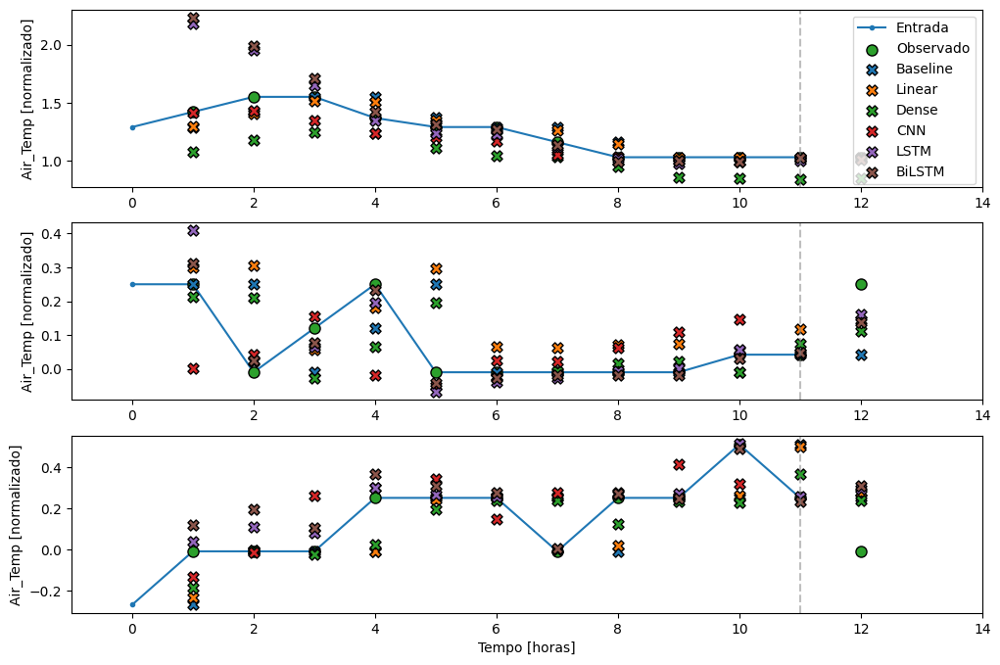

In [ ]:
wide_window.plot(
    models={
        'Baseline': baseline,
        'Linear': linear,
        'Dense': dense,
        'CNN':conv_model,
        'LSTM': lstm_model,
        'BiLSTM': bilstm_model},
    plot_col='Air_Temp',  # ou 'Air_Temp', dependendo do nome da sua variável
    max_subplots=3 )# ou o número de séries que você quer visualizar

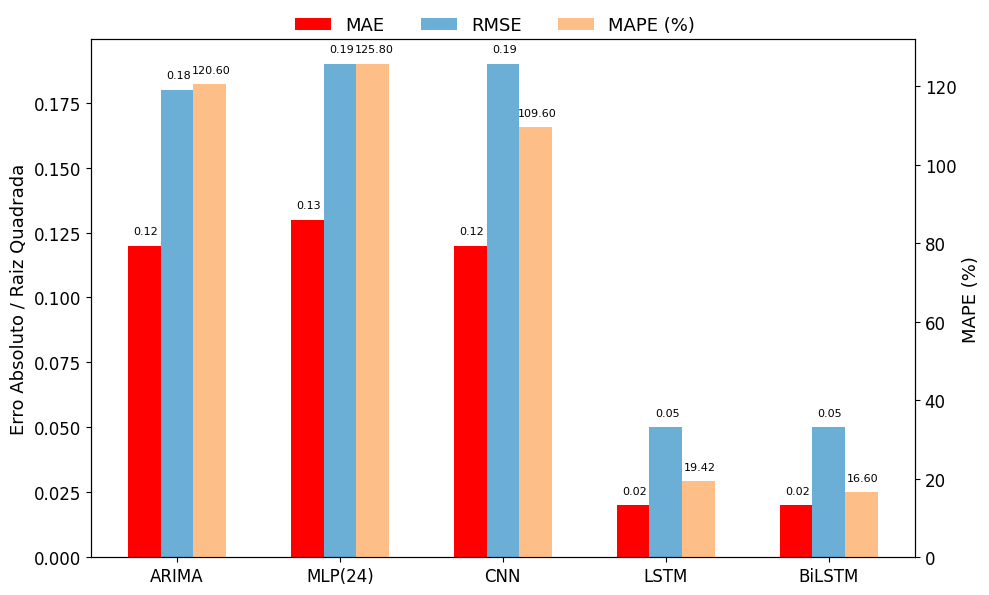

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Dados dos modelos
modelos = ['ARIMA', 'MLP(24)', 'CNN', 'LSTM', 'BiLSTM']
mae =   [0.12, 0.13, 0.12, 0.02, 0.02]
mape =  [120.6, 125.8, 109.6, 19.42, 16.6]
rmse =  [0.18, 0.19, 0.19, 0.05, 0.05]

x = np.arange(len(modelos))
largura = 0.20

fig, ax1 = plt.subplots(figsize=(10, 6))

bar_mae = ax1.bar(x - largura, mae, largura, label='MAE', color='red')
bar_rmse = ax1.bar(x, rmse, largura, label='RMSE', color='#6baed6')
ax1.set_ylabel('Erro Absoluto / Raiz Quadrada', fontsize=13)
ax1.set_xticks(x)
ax1.set_xticklabels(modelos, fontsize=12)
ax1.tick_params(axis='y', labelsize=12)

ax2 = ax1.twinx()
bar_mape = ax2.bar(x + largura, mape, largura, label='MAPE (%)', color='#fdae6b', alpha=0.8)
ax2.set_ylabel('MAPE (%)', fontsize=13)
ax2.tick_params(axis='y', labelsize=12)

# Legenda afastada para cima
labels = ['MAE', 'RMSE', 'MAPE (%)']
fig.legend([bar_mae, bar_rmse, bar_mape], labels, loc='upper center', ncol=3, fontsize=13, frameon=False, bbox_to_anchor=(0.5, 1.00))

# Adiciona valores "dentro" das barras
def autolabel(bars, ax, fmt='{:.2f}', y_offset=0.003):
    """Adiciona valores nas barras."""
    for bar in bars:
        for rect in bar:
            height = rect.get_height()
            ax.annotate(fmt.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height + y_offset),
                        xytext=(1, 1),  # Pequeno deslocamento vertical
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=8, color='black')

autolabel([bar_mae], ax1, fmt='{:.2f}')
autolabel([bar_rmse], ax1, fmt='{:.2f}')
autolabel([bar_mape], ax2, fmt='{:.2f}', y_offset=2.0)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Deixa espaço para a legenda acima
plt.show()